In [1]:
import torch, random
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from sklearn.metrics import *
torch.manual_seed(100)
random.seed(100)

In [2]:
import QUANTAXIS as QA
import sys,copy
sys.path.append('/root/workspace/QUANTAXIS/src')
from stock_head import *
from utils import *
from model import BoostModel, XGBoostRegression
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
from QUANTAXIS.QAUtil.QASetting import *
print(DEFAULT_DB_URI)
## for qlib's data
data_dir = '/root/workspace/data/'
if not os.path.exists(data_dir):
    os.mkdir(data_dir, mode=0o777)

os.environ['TZ'] = 'Asia/Shanghai'
print(time.asctime(time.localtime(time.time())))
start_date = QA.QA_util_get_next_trade_date('2010-01-01')
end_date = QA.QA_util_get_pre_trade_date(datetime.date.today().strftime("%Y-%m-%d"))
test_date = '2017-01-26' ## test dataset start on this day
# test_date = '2020-04-30'
## industry standard SW_l1 changed on this day
industry_change_date = QA.QA_util_get_real_date('2014-02-21')

date_dict = QA.QAUtil.QA_util_getBetweenMonth(start_date, end_date)
monthend_date = [ QA.QA_util_format_date2str(item[1]) for item in list(date_dict.values())]
real_date_list = [x.strftime('%Y-%m-%d') for x in list(pd.date_range(start=start_date, end=end_date))]
trade_date_list = trade_date_sse[trade_date_sse.index(start_date) : trade_date_sse.index(end_date)]
month_end_trade_date = [item if QA.QA_util_if_trade(item) else QA.QA_util_get_pre_trade_date(item, 1) for item in monthend_date]
# print(month_end_trade_date[-15:])

you are using non-interactive mdoel quantaxis
auth success 
{'total': 1000000, 'spare': 1000000}
mongodb://localhost:27017
Fri Jul 30 11:32:08 2021


In [3]:
## model & period
os.environ["CUDA_VISIBLE_DEVICES"] = '0'
model_name = 'LSTM'
epochs = 200
batch_size = 5000
num_layers = 2
hidden_size = 64
steps = [3, 6, 12] ##LSTM 关键参数，每步要用到前step_len的数据
model_period = [ model_name+str(j) for j in steps]
early_stop = 10
lr = 1e-3
optimizer = 'adam'
dropout=0.1
ranks = 1 ##按rtn分为ranks组，并以此为模型分类目标， 若为regression，则为1。为LSTM的output值。
# device = torch.device("cuda:%d" % (0) if torch.cuda.is_available() else "cpu")
device = torch.device('cuda')
print(device, model_period)

cuda ['LSTM3', 'LSTM6', 'LSTM12']


In [4]:
## 读取第一部分得到数据
df = pd.read_csv(data_dir+'df.csv', encoding='gbk', index_col=0, dtype={'code': str})
date_ls = df['date'].astype(str).unique().tolist()
test_date_list = date_ls[date_ls.index(test_date) : -1]
params = {} 
is_classify = False ## 是否regression
## 所用到的feature column name
f_cols = list(set(df.columns.tolist()) - set(['industry_code','mv', 'date', 'code', 'rtn', 'rank_rtn',
                                              'index_code', 'weight', 'industry_of_300', 'industry_of_500']))
f_cols = list(set(f_cols) - set([item for item in f_cols if item.startswith('label')]))
qlib_cols = ["RESI5", "WVMA5", "RSQR5", "KLEN", "RSQR10", "CORR5", "CORD5", "CORR10", 
                            "ROC60", "RESI10", "VSTD5", "RSQR60", "CORR60", "WVMA60", "STD5", 
                            "RSQR20", "CORD60", "CORD10", "CORR20", "KLOW"]
f_cols = list(set(f_cols).intersection(set(qlib_cols)))
print(len(f_cols))
df = df.set_index(['date', 'code'])[f_cols+['rank_rtn']]
df = df.drop(df[df.index.duplicated()].index, axis=0)
monthend_ls = df.index.levels[0].tolist()
df.fillna(0, inplace=True)

model_df = pd.DataFrame()
if is_classify:
    score_df = pd.DataFrame(index=test_date_list, columns=pd.MultiIndex.from_product([model_period, ['correct', 'auc']]))
else:
    score_df = pd.DataFrame(index=test_date_list, columns=pd.MultiIndex.from_product([model_period, ['mse']]))

19


In [5]:
df.head()

WVMA5     RSQR5    RSQR10    CORR10     ROC60    CORD60     RESI5      STD5      KLOW    RESI10     CORR5    CORR60    RSQR60    RSQR20    CORD10    WVMA60     CORD5    CORR20     VSTD5  rank_rtn
date       code                                                                                                                                                                                                          
2010-01-29 000001  1.512799  0.894823 -2.941618  0.214402  0.654482 -0.150890 -0.892364 -1.754136  1.470572 -0.853535  0.806568 -2.079469  1.780635 -0.818307  1.495104  0.275667  1.844658 -2.604603  0.263589 -0.411542
           000002 -0.078371 -1.567951  0.279753 -0.553108  0.580293 -1.810200 -0.753248 -1.261838 -0.508391 -0.001316 -1.548063  0.862618  1.209424  1.889767 -1.387764 -0.571361 -1.004522  0.363121 -0.926483 -1.087283
           000005 -0.817727 -1.497876  0.276381  0.247023 -1.960036  0.266253  1.909843 -0.065337  0.483721  2.121099  1.110810 -0.406875 -1.602147  0.912655  0.701523  1.086574  1.738358  0.581544 -1.116026 -0.355653
           000006 -0.331202 -0.797882  0.497491 -0.188182  0.555932  0.070407 -1.071740 -1.558209  0.537648  0.260999 -1.630746  0.255486  1.101927  0.708869 -1.678475 -0.499020 -0.291101 -0.006187 -2.032374 -0.215932
           000009 -0.374812 -1.627953 -0.023459  0.750870  1.200950 -1.111666 -0.976043 -1.059658  1.711627  0.841961 -0.027048 -1.192659  1.069296 -1.670638 -0.618960 -1.015339 -0.260009  0.239325  0.822393  0.784978

In [6]:
# parse_dates=['date']

In [7]:
# plot_multi_kde(df)

In [8]:
## 对于start，end区间的数据，取出具有连续step_len的股票代码历史数据.
class dataset:
    def __init__(self, data, start, end, step_len=5):
        self.step_len = step_len
        
        datelist = data.sort_index().index.levels[0].tolist()
        idx = datelist.index(start)
        if idx >= step_len:
            idx = idx-step_len+1
        self.data = data[(data.index.get_level_values(0) >= datelist[idx]) & (data.index.get_level_values(0) <= end)].sort_index(ascending=True)
#         print(f'select stocks from {self.data.index.get_level_values(0)[0]} to {self.data.index.get_level_values(0)[-1]}')
        
        self.swap_data = self.data.swaplevel().sort_index()
        self.swap_data_arr = np.array(self.swap_data).astype(float)
        
        self.steps_df = self.get_steps_df()
        print(f'start date: {start} . end date : {end}. the number of data: {self.steps_df.shape[0]}')
        self.steps_ls = self.steps_df['idx'].values.tolist()
        
    def get_steps_df(self):
        
        steps_df = self.data.iloc[:, -1].unstack().rolling(window=self.step_len, min_periods=0).count().stack().rename('count')
        steps_df = steps_df[steps_df == self.step_len]
        ## idx 为满足条件的swap_data的index
        idx_df = pd.DataFrame(range(self.swap_data.shape[0]), 
                              index=self.swap_data.index, 
                              columns=['idx']).swaplevel()    
        steps_df = pd.merge(steps_df, idx_df, left_index=True, right_index=True, how='left')
        
        return steps_df
    
    def __getitem__(self, idx: int):
        swap_idx = self.steps_ls[idx]
        tmp2 = self.swap_data_arr[swap_idx-self.step_len+1 : swap_idx+1]
#         print(f'idx {idx}, swap_idx {swap_idx}')
        return tmp2

    def get_index(self):
        return self.steps_df.index    
    
    def __len__(self):
        return len(self.steps_ls)

In [9]:
### LSTM model，定义LSTM各层，
class LSTMModel(nn.Module):
    def __init__(self, batch_size=500, feature_cnt=6, hidden_size=hidden_size,
                 output=ranks, num_layers=2, dropout=0):
        print('---LSTMModel init----')
        super().__init__()
        
        self.rnn = nn.LSTM(
            input_size=feature_cnt,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout,
        )
        self.fc_out = nn.Linear(hidden_size, 1)
#         self.fc_out_1 = nn.Linear(hidden_size, int(hidden_size/2))
#         self.fc_out_2 = nn.Linear(int(hidden_size/2), output)

    def forward(self, x):
#         self.rnn.flatten_parameters()
        
        out, _ = self.rnn(x)
        return self.fc_out(out[:, -1, :]).squeeze()
#         out = self.fc_out_1(out[:, -1, :]).squeeze()
#         out = self.fc_out_2(out[:, :])
# #         out = F.log_softmax(out.squeeze(), dim=-1)
# #         out = F.softmax(out.squeeze(), dim=-1)
# #         print(f'LSTMModel out {out.shape}')
#         return out

In [10]:
## LSTM traing process. fit is the training programme.
class LSTM():
    def __init__(self, feature_cnt=6, hidden_size=hidden_size, output=ranks,
                 num_layers=num_layers, dropout=dropout, optimizer='adam', lr=lr):
        
        self.LSTM_model = LSTMModel(batch_size=batch_size, feature_cnt=feature_cnt, 
                                    hidden_size=hidden_size, output=output,
                                    num_layers=num_layers, dropout=dropout)
        if torch.cuda.device_count() > 1:
            print("Let's use", torch.cuda.device_count(), "GPUs")
            self.LSTM_model = nn.DataParallel(self.LSTM_model)
            
        self.LSTM_model.to(device)
#         self.loss_fn = nn.NLLLoss()
#         self.loss_fn = nn.MSELoss()
#         self.loss_fn = nn.CrossEntropyLoss()
        if optimizer.lower() == "adam":
            self.optimizer = optim.Adam(self.LSTM_model.parameters(), lr=lr)
        elif optimizer.lower() == "sgd":
            self.optimizer = optim.SGD(self.LSTM_model.parameters(), lr=lr)
        else:
            raise NotImplementedError("optimizer {} is not supported!".format(optimizer))
    
    def loss_fn(self, pred, label): ##mse
        mask = ~torch.isnan(label)
#         print(torch.any(torch.isnan(pred)))
        loss = (pred[mask] - label[mask]) ** 2
#         print(loss)
        return torch.mean(loss)        
        
    def train_epoch(self, data_loader, step):
        self.LSTM_model.train()
        
        for data in data_loader:
            feature = data[:, :, 0:-1].to(device)
            label = data[:, -1, -1].type(torch.FloatTensor).to(device)
#             feature[torch.isnan(feature)] = 0
#             print(torch.any(torch.isnan(feature)))
#             print(torch.any(torch.isnan(feature)))
            pred = self.LSTM_model(feature.float())
            loss = self.loss_fn(pred, label)
#             loss = self.loss_fn(pred[l_mask], label[l_mask])
#             if (step == 3):
#                 print(f'max: {torch.max(pred)}, min: {torch.min(pred)}')
# #                 print(pred.cpu().detach().numpy())

            self.optimizer.zero_grad()
            loss.backward()
            nn.utils.clip_grad_value_(self.LSTM_model.parameters(), 3.0)
            self.optimizer.step()
            
    def test_epoch(self, data_loader):
        self.LSTM_model.eval()
        scores, losses = [], []

        for data in data_loader:
            feature = data[:, :, 0:-1].to(device)
            feature[torch.isnan(feature)] = 0
            label = data[:, -1, -1].type(torch.FloatTensor).to(device)            

            pred = self.LSTM_model(feature.float())
#             print(torch.any(torch.isnan(pred[l_mask])))
            loss = self.loss_fn(pred, label)
            losses.append(loss.item())

#             y_pred = torch.max(pred, 1)[1].cpu()
#             label = label.cpu()
#             score = roc_auc_score(label.data, y_pred.data)
            m_mask = torch.isfinite(label)
            score = - self.loss_fn(pred[m_mask], label[m_mask])            
            scores.append(score.item())
        
#         plt.hist(pred.cpu().detach().numpy(), 30, density=True)
#         plt.show()
#         print(f'PRED max: {torch.max(pred)}, min: {torch.min(pred)}')
#         print(f'LABEL: {torch.max(label)}, min: {torch.min(label)}')
        
        return np.mean(losses), np.mean(scores)    
    
    def fit(self, train_ds, valid_ds, evals_result=dict(), save_path='./lstm.model'):
        
        train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=False)
        valid_loader = DataLoader(valid_ds, batch_size=batch_size, shuffle=False, drop_last=False)

        stop_steps, train_loss, val_loss, best_epoch = 0, 0, 0, 0
        best_score = -np.inf
        best_loss = np.inf
        evals_result["train"], evals_result["valid"] = [], []

        for step in range(epochs):
            print("Epoch:", step)
#             print('training...... ')
            self.train_epoch(train_loader, step)
#             print("evaluating......")
            train_loss, train_score = self.test_epoch(train_loader)
            val_loss, val_score = self.test_epoch(valid_loader)
            print("train loss %.6f, train score %.6f, valid loss %.6f, valid score %.6f" % (
                train_loss,train_score, val_loss, val_score))
            evals_result["train"].append(train_score)
            evals_result["valid"].append(val_score)
#             best_param = copy.deepcopy(self.LSTM_model.state_dict())

            if val_score > best_score:
                best_score = val_score
                stop_steps = 0
                best_epoch = step
                best_param = copy.deepcopy(self.LSTM_model.state_dict())
            else:
                stop_steps += 1
                if stop_steps >= early_stop:
                    print("early stop...")
                    break
                    
        print("best score: %.6lf @ epoch%d" % (best_score, best_epoch))
        evals_result['best_score'] = best_score
        self.LSTM_model.load_state_dict(best_param)
        torch.save(best_param, save_path)
        print('torch model save successed')

        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        
        return evals_result
    
    def predict(self, test_ds):
        test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False, drop_last=False)
        preds = []
        
        self.LSTM_model.eval()
        for data in test_loader:
            feature = data[:, :, 0:-1].to(device)
            feature[torch.isnan(feature)] = 0

            with torch.no_grad():
                pred = self.LSTM_model(feature.float())
                plt.hist(pred.cpu().detach().numpy(), 30, density=True)
                plt.show()
#                 print(f'PRED max: {torch.max(pred)}, min: {torch.min(pred)}')
#                 pred = torch.max(F.softmax(pred, dim=1), 1)
#             pred=np.append(pred.values.cpu().numpy().reshape(-1, 1), pred.indices.cpu().numpy().reshape(-1, 1), axis=1)
            preds.append(pred.cpu())

        pred_df = pd.DataFrame(np.concatenate(preds), index=test_ds.get_index(), columns=['pred'])
#         pred_df = pd.merge(test_ds.data.iloc[:, -1], pred_df, left_index=True, right_index=True, how='right')
        return pred_df            

------LSTM-----3------2017-01-26-----
start date: 2010-05-31 . end date : 2016-10-31. the number of data: 146436
start date: 2016-11-30 . end date : 2016-12-30. the number of data: 4753
start date: 2017-01-26 . end date : 2017-01-26. the number of data: 2419
---LSTMModel init----
Epoch: 0
train loss 0.974994, train score -0.974994, valid loss 0.957652, valid score -0.957652
Epoch: 1
train loss 0.970291, train score -0.970291, valid loss 0.951957, valid score -0.951957
Epoch: 2
train loss 0.967413, train score -0.967413, valid loss 0.952169, valid score -0.952169
Epoch: 3
train loss 0.966642, train score -0.966642, valid loss 0.951621, valid score -0.951621
Epoch: 4
train loss 0.964969, train score -0.964969, valid loss 0.950790, valid score -0.950790
Epoch: 5
train loss 0.962285, train score -0.962285, valid loss 0.947558, valid score -0.947558
Epoch: 6
train loss 0.961139, train score -0.961139, valid loss 0.949569, valid score -0.949569
Epoch: 7
train loss 0.960020, train score -0.96

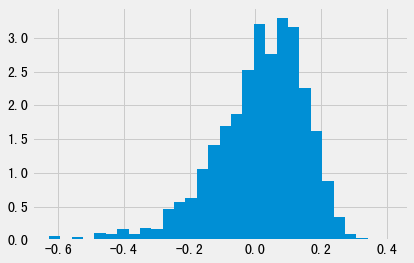

------LSTM-----3------2017-02-28-----
start date: 2010-06-30 . end date : 2016-11-30. the number of data: 147507
start date: 2016-12-30 . end date : 2017-01-26. the number of data: 4812
start date: 2017-02-28 . end date : 2017-02-28. the number of data: 2458
---LSTMModel init----
Epoch: 0
train loss 0.974632, train score -0.974632, valid loss 0.965286, valid score -0.965286
Epoch: 1
train loss 0.967982, train score -0.967982, valid loss 0.959642, valid score -0.959642
Epoch: 2
train loss 0.965916, train score -0.965916, valid loss 0.960313, valid score -0.960313
Epoch: 3
train loss 0.964698, train score -0.964698, valid loss 0.959948, valid score -0.959948
Epoch: 4
train loss 0.962773, train score -0.962773, valid loss 0.959918, valid score -0.959918
Epoch: 5
train loss 0.961407, train score -0.961407, valid loss 0.961146, valid score -0.961146
Epoch: 6
train loss 0.960269, train score -0.960269, valid loss 0.961708, valid score -0.961708
Epoch: 7
train loss 0.958717, train score -0.95

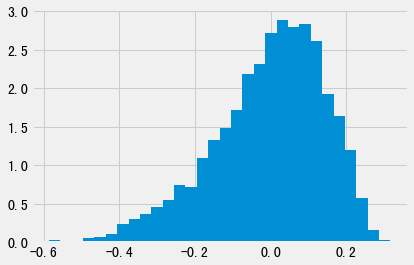

------LSTM-----3------2017-03-31-----
start date: 2010-07-30 . end date : 2016-12-30. the number of data: 148557
start date: 2017-01-26 . end date : 2017-02-28. the number of data: 4877
start date: 2017-03-31 . end date : 2017-03-31. the number of data: 2452
---LSTMModel init----
Epoch: 0
train loss 0.973549, train score -0.973549, valid loss 0.982224, valid score -0.982224
Epoch: 1
train loss 0.968407, train score -0.968407, valid loss 0.980527, valid score -0.980527
Epoch: 2
train loss 0.966716, train score -0.966716, valid loss 0.982114, valid score -0.982114
Epoch: 3
train loss 0.964904, train score -0.964904, valid loss 0.984427, valid score -0.984427
Epoch: 4
train loss 0.963707, train score -0.963707, valid loss 0.985043, valid score -0.985043
Epoch: 5
train loss 0.961801, train score -0.961801, valid loss 0.984732, valid score -0.984732
Epoch: 6
train loss 0.960924, train score -0.960924, valid loss 0.983648, valid score -0.983648
Epoch: 7
train loss 0.959247, train score -0.95

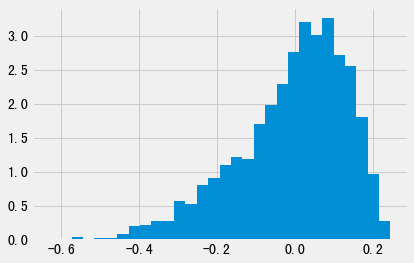

------LSTM-----3------2017-04-28-----
start date: 2010-08-31 . end date : 2017-01-26. the number of data: 149606
start date: 2017-02-28 . end date : 2017-03-31. the number of data: 4910
start date: 2017-04-28 . end date : 2017-04-28. the number of data: 2434
---LSTMModel init----
Epoch: 0
train loss 0.973560, train score -0.973560, valid loss 0.982433, valid score -0.982433
Epoch: 1
train loss 0.968534, train score -0.968534, valid loss 0.984979, valid score -0.984979
Epoch: 2
train loss 0.966236, train score -0.966236, valid loss 0.983769, valid score -0.983769
Epoch: 3
train loss 0.964534, train score -0.964534, valid loss 0.983188, valid score -0.983188
Epoch: 4
train loss 0.963021, train score -0.963021, valid loss 0.981797, valid score -0.981797
Epoch: 5
train loss 0.961936, train score -0.961936, valid loss 0.979812, valid score -0.979812
Epoch: 6
train loss 0.960503, train score -0.960503, valid loss 0.982125, valid score -0.982125
Epoch: 7
train loss 0.959241, train score -0.95

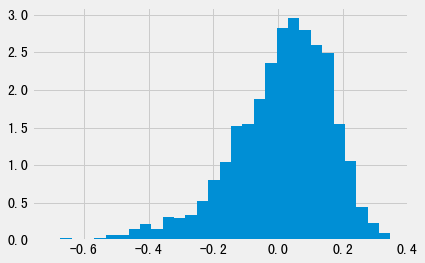

------LSTM-----3------2017-05-31-----
start date: 2010-09-30 . end date : 2017-02-28. the number of data: 150642
start date: 2017-03-31 . end date : 2017-04-28. the number of data: 4886
start date: 2017-05-31 . end date : 2017-05-31. the number of data: 2497
---LSTMModel init----
Epoch: 0
train loss 0.972500, train score -0.972500, valid loss 0.973797, valid score -0.973797
Epoch: 1
train loss 0.967342, train score -0.967342, valid loss 0.978702, valid score -0.978702
Epoch: 2
train loss 0.968675, train score -0.968675, valid loss 0.978010, valid score -0.978010
Epoch: 3
train loss 0.965223, train score -0.965223, valid loss 0.978980, valid score -0.978980
Epoch: 4
train loss 0.962832, train score -0.962832, valid loss 0.975738, valid score -0.975738
Epoch: 5
train loss 0.962208, train score -0.962208, valid loss 0.972688, valid score -0.972688
Epoch: 6
train loss 0.960409, train score -0.960409, valid loss 0.973051, valid score -0.973051
Epoch: 7
train loss 0.961501, train score -0.96

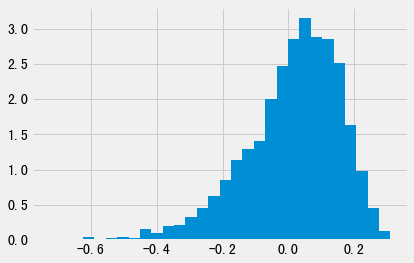

------LSTM-----3------2017-06-30-----
start date: 2010-10-29 . end date : 2017-03-31. the number of data: 151625
start date: 2017-04-28 . end date : 2017-05-31. the number of data: 4931
start date: 2017-06-30 . end date : 2017-06-30. the number of data: 2553
---LSTMModel init----
Epoch: 0
train loss 0.973429, train score -0.973429, valid loss 0.962964, valid score -0.962964
Epoch: 1
train loss 0.968267, train score -0.968267, valid loss 0.955084, valid score -0.955084
Epoch: 2
train loss 0.966422, train score -0.966422, valid loss 0.955957, valid score -0.955957
Epoch: 3
train loss 0.964773, train score -0.964773, valid loss 0.955232, valid score -0.955232
Epoch: 4
train loss 0.963323, train score -0.963323, valid loss 0.953900, valid score -0.953900
Epoch: 5
train loss 0.961517, train score -0.961517, valid loss 0.954451, valid score -0.954451
Epoch: 6
train loss 0.960380, train score -0.960380, valid loss 0.954900, valid score -0.954900
Epoch: 7
train loss 0.959606, train score -0.95

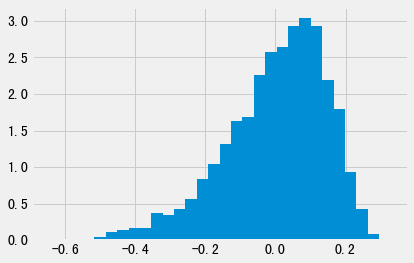

------LSTM-----3------2017-07-31-----
start date: 2010-11-30 . end date : 2017-04-28. the number of data: 152554
start date: 2017-05-31 . end date : 2017-06-30. the number of data: 5050
start date: 2017-07-31 . end date : 2017-07-31. the number of data: 2608
---LSTMModel init----
Epoch: 0
train loss 0.974734, train score -0.974734, valid loss 1.115887, valid score -1.115887
Epoch: 1
train loss 0.968643, train score -0.968643, valid loss 1.148769, valid score -1.148769
Epoch: 2
train loss 0.966389, train score -0.966389, valid loss 1.149315, valid score -1.149315
Epoch: 3
train loss 0.965708, train score -0.965708, valid loss 1.143392, valid score -1.143392
Epoch: 4
train loss 0.962929, train score -0.962929, valid loss 1.146101, valid score -1.146101
Epoch: 5
train loss 0.961784, train score -0.961784, valid loss 1.156247, valid score -1.156247
Epoch: 6
train loss 0.959940, train score -0.959940, valid loss 1.142129, valid score -1.142129
Epoch: 7
train loss 0.958422, train score -0.95

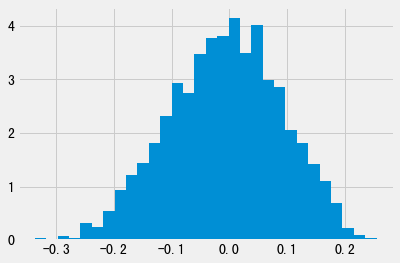

------LSTM-----3------2017-08-31-----
start date: 2010-12-31 . end date : 2017-05-31. the number of data: 153527
start date: 2017-06-30 . end date : 2017-07-31. the number of data: 5161
start date: 2017-08-31 . end date : 2017-08-31. the number of data: 2661
---LSTMModel init----
Epoch: 0
train loss 0.974527, train score -0.974527, valid loss 1.062890, valid score -1.062890
Epoch: 1
train loss 0.969142, train score -0.969142, valid loss 1.050250, valid score -1.050250
Epoch: 2
train loss 0.966568, train score -0.966568, valid loss 1.050536, valid score -1.050536
Epoch: 3
train loss 0.964879, train score -0.964879, valid loss 1.050626, valid score -1.050626
Epoch: 4
train loss 0.963146, train score -0.963146, valid loss 1.050274, valid score -1.050274
Epoch: 5
train loss 0.961573, train score -0.961573, valid loss 1.050750, valid score -1.050750
Epoch: 6
train loss 0.959956, train score -0.959956, valid loss 1.051137, valid score -1.051137
Epoch: 7
train loss 0.958391, train score -0.95

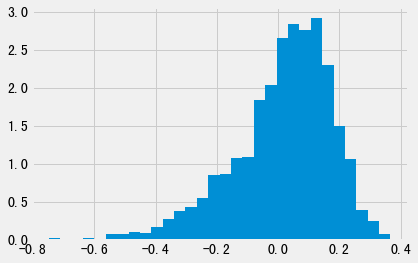

------LSTM-----3------2017-09-29-----
start date: 2011-01-31 . end date : 2017-06-30. the number of data: 154548
start date: 2017-07-31 . end date : 2017-08-31. the number of data: 5269
start date: 2017-09-29 . end date : 2017-09-29. the number of data: 2718
---LSTMModel init----
Epoch: 0
train loss 0.974409, train score -0.974409, valid loss 0.995543, valid score -0.995543
Epoch: 1
train loss 0.968207, train score -0.968207, valid loss 0.998058, valid score -0.998058
Epoch: 2
train loss 0.965895, train score -0.965895, valid loss 1.000038, valid score -1.000038
Epoch: 3
train loss 0.964720, train score -0.964720, valid loss 0.999803, valid score -0.999803
Epoch: 4
train loss 0.962484, train score -0.962484, valid loss 1.005683, valid score -1.005683
Epoch: 5
train loss 0.961162, train score -0.961162, valid loss 1.005154, valid score -1.005154
Epoch: 6
train loss 0.959621, train score -0.959621, valid loss 1.006793, valid score -1.006793
Epoch: 7
train loss 0.958251, train score -0.95

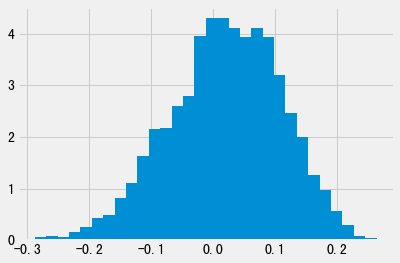

------LSTM-----3------2017-10-31-----
start date: 2011-02-28 . end date : 2017-07-31. the number of data: 155617
start date: 2017-08-31 . end date : 2017-09-29. the number of data: 5379
start date: 2017-10-31 . end date : 2017-10-31. the number of data: 2759
---LSTMModel init----
Epoch: 0
train loss 0.969133, train score -0.969133, valid loss 0.976243, valid score -0.976243
Epoch: 1
train loss 0.965151, train score -0.965151, valid loss 0.970443, valid score -0.970443
Epoch: 2
train loss 0.963775, train score -0.963775, valid loss 0.968790, valid score -0.968790
Epoch: 3
train loss 0.964516, train score -0.964516, valid loss 0.970323, valid score -0.970323
Epoch: 4
train loss 0.961281, train score -0.961281, valid loss 0.969707, valid score -0.969707
Epoch: 5
train loss 0.960000, train score -0.960000, valid loss 0.969252, valid score -0.969252
Epoch: 6
train loss 0.957328, train score -0.957328, valid loss 0.966464, valid score -0.966464
Epoch: 7
train loss 0.956690, train score -0.95

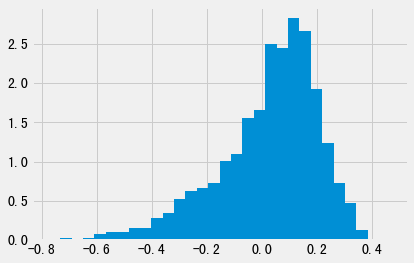

------LSTM-----3------2017-11-30-----
start date: 2011-03-31 . end date : 2017-08-31. the number of data: 156730
start date: 2017-09-29 . end date : 2017-10-31. the number of data: 5477
start date: 2017-11-30 . end date : 2017-11-30. the number of data: 2801
---LSTMModel init----
Epoch: 0
train loss 0.972922, train score -0.972922, valid loss 1.015755, valid score -1.015755
Epoch: 1
train loss 0.966502, train score -0.966502, valid loss 1.002355, valid score -1.002355
Epoch: 2
train loss 0.964137, train score -0.964137, valid loss 0.999088, valid score -0.999088
Epoch: 3
train loss 0.962553, train score -0.962553, valid loss 0.995256, valid score -0.995256
Epoch: 4
train loss 0.961564, train score -0.961564, valid loss 0.995010, valid score -0.995010
Epoch: 5
train loss 0.959512, train score -0.959512, valid loss 0.994014, valid score -0.994014
Epoch: 6
train loss 0.958665, train score -0.958665, valid loss 0.996150, valid score -0.996150
Epoch: 7
train loss 0.957081, train score -0.95

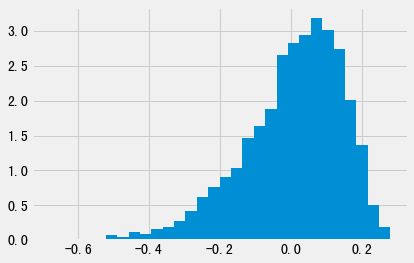

------LSTM-----3------2017-12-29-----
start date: 2011-04-29 . end date : 2017-09-29. the number of data: 157912
start date: 2017-10-31 . end date : 2017-11-30. the number of data: 5560
start date: 2017-12-29 . end date : 2017-12-29. the number of data: 2815
---LSTMModel init----
Epoch: 0
train loss 0.970593, train score -0.970593, valid loss 0.976589, valid score -0.976589
Epoch: 1
train loss 0.965628, train score -0.965628, valid loss 0.971216, valid score -0.971216
Epoch: 2
train loss 0.964066, train score -0.964066, valid loss 0.970036, valid score -0.970036
Epoch: 3
train loss 0.962243, train score -0.962243, valid loss 0.970374, valid score -0.970374
Epoch: 4
train loss 0.960856, train score -0.960856, valid loss 0.974382, valid score -0.974382
Epoch: 5
train loss 0.959211, train score -0.959211, valid loss 0.971281, valid score -0.971281
Epoch: 6
train loss 0.958024, train score -0.958024, valid loss 0.972685, valid score -0.972685
Epoch: 7
train loss 0.956964, train score -0.95

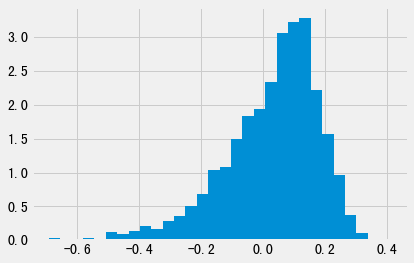

------LSTM-----3------2018-01-31-----
start date: 2011-05-31 . end date : 2017-10-31. the number of data: 159113
start date: 2017-11-30 . end date : 2017-12-29. the number of data: 5616
start date: 2018-01-31 . end date : 2018-01-31. the number of data: 2821
---LSTMModel init----
Epoch: 0
train loss 0.971864, train score -0.971864, valid loss 0.947462, valid score -0.947462
Epoch: 1
train loss 0.966322, train score -0.966322, valid loss 0.937163, valid score -0.937163
Epoch: 2
train loss 0.963944, train score -0.963944, valid loss 0.935753, valid score -0.935753
Epoch: 3
train loss 0.962352, train score -0.962352, valid loss 0.937702, valid score -0.937702
Epoch: 4
train loss 0.960734, train score -0.960734, valid loss 0.934541, valid score -0.934541
Epoch: 5
train loss 0.959228, train score -0.959228, valid loss 0.934551, valid score -0.934551
Epoch: 6
train loss 0.958049, train score -0.958049, valid loss 0.934185, valid score -0.934185
Epoch: 7
train loss 0.956726, train score -0.95

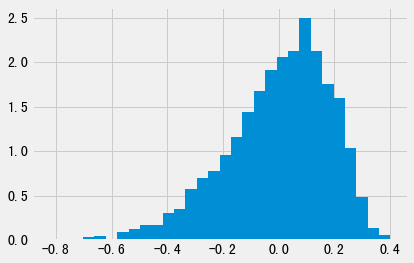

------LSTM-----3------2018-02-28-----
start date: 2011-06-30 . end date : 2017-11-30. the number of data: 160339
start date: 2017-12-29 . end date : 2018-01-31. the number of data: 5636
start date: 2018-02-28 . end date : 2018-02-28. the number of data: 2852
---LSTMModel init----
Epoch: 0
train loss 0.967836, train score -0.967836, valid loss 0.969767, valid score -0.969767
Epoch: 1
train loss 0.964081, train score -0.964081, valid loss 0.963427, valid score -0.963427
Epoch: 2
train loss 0.962750, train score -0.962750, valid loss 0.964981, valid score -0.964981
Epoch: 3
train loss 0.963340, train score -0.963340, valid loss 0.965453, valid score -0.965453
Epoch: 4
train loss 0.962261, train score -0.962261, valid loss 0.967573, valid score -0.967573
Epoch: 5
train loss 0.957840, train score -0.957840, valid loss 0.967794, valid score -0.967794
Epoch: 6
train loss 0.956528, train score -0.956528, valid loss 0.971755, valid score -0.971755
Epoch: 7
train loss 0.958293, train score -0.95

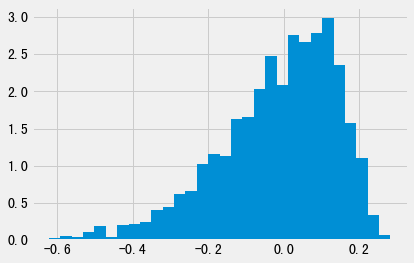

------LSTM-----3------2018-03-30-----
start date: 2011-07-29 . end date : 2017-12-29. the number of data: 161534
start date: 2018-01-31 . end date : 2018-02-28. the number of data: 5673
start date: 2018-03-30 . end date : 2018-03-30. the number of data: 2898
---LSTMModel init----
Epoch: 0
train loss 0.970635, train score -0.970635, valid loss 0.993964, valid score -0.993964
Epoch: 1
train loss 0.966468, train score -0.966468, valid loss 0.999248, valid score -0.999248
Epoch: 2
train loss 0.961749, train score -0.961749, valid loss 1.003992, valid score -1.003992
Epoch: 3
train loss 0.961336, train score -0.961336, valid loss 1.007693, valid score -1.007693
Epoch: 4
train loss 0.959653, train score -0.959653, valid loss 1.010511, valid score -1.010511
Epoch: 5
train loss 0.957570, train score -0.957570, valid loss 1.009763, valid score -1.009763
Epoch: 6
train loss 0.955408, train score -0.955408, valid loss 1.011622, valid score -1.011622
Epoch: 7
train loss 0.955092, train score -0.95

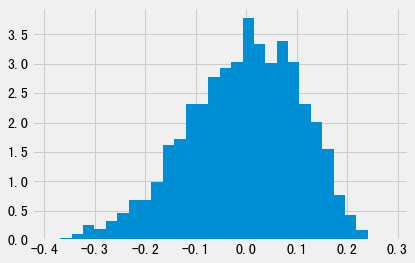

------LSTM-----3------2018-04-27-----
start date: 2011-08-31 . end date : 2018-01-31. the number of data: 162683
start date: 2018-02-28 . end date : 2018-03-30. the number of data: 5750
start date: 2018-04-27 . end date : 2018-04-27. the number of data: 2894
---LSTMModel init----
Epoch: 0
train loss 0.970102, train score -0.970102, valid loss 0.929519, valid score -0.929519
Epoch: 1
train loss 0.965067, train score -0.965067, valid loss 0.927729, valid score -0.927729
Epoch: 2
train loss 0.963101, train score -0.963101, valid loss 0.933328, valid score -0.933328
Epoch: 3
train loss 0.961463, train score -0.961463, valid loss 0.935911, valid score -0.935911
Epoch: 4
train loss 0.960895, train score -0.960895, valid loss 0.929712, valid score -0.929712
Epoch: 5
train loss 0.958297, train score -0.958297, valid loss 0.933529, valid score -0.933529
Epoch: 6
train loss 0.956979, train score -0.956979, valid loss 0.936996, valid score -0.936996
Epoch: 7
train loss 0.956117, train score -0.95

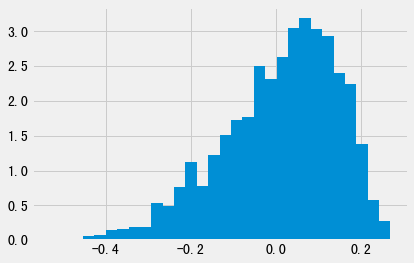

------LSTM-----3------2018-05-31-----
start date: 2011-09-30 . end date : 2018-02-28. the number of data: 163839
start date: 2018-03-30 . end date : 2018-04-27. the number of data: 5792
start date: 2018-05-31 . end date : 2018-05-31. the number of data: 2934
---LSTMModel init----
Epoch: 0
train loss 0.970643, train score -0.970643, valid loss 0.987647, valid score -0.987647
Epoch: 1
train loss 0.966408, train score -0.966408, valid loss 0.984446, valid score -0.984446
Epoch: 2
train loss 0.964623, train score -0.964623, valid loss 0.990749, valid score -0.990749
Epoch: 3
train loss 0.962673, train score -0.962673, valid loss 0.986279, valid score -0.986279
Epoch: 4
train loss 0.961206, train score -0.961206, valid loss 0.986492, valid score -0.986492
Epoch: 5
train loss 0.959916, train score -0.959916, valid loss 0.989935, valid score -0.989935
Epoch: 6
train loss 0.958811, train score -0.958811, valid loss 0.983158, valid score -0.983158
Epoch: 7
train loss 0.957617, train score -0.95

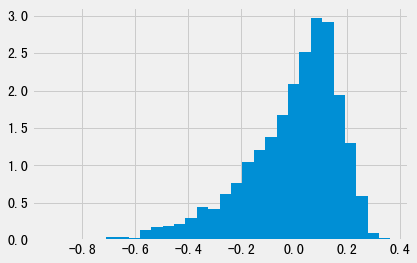

------LSTM-----3------2018-06-29-----
start date: 2011-10-31 . end date : 2018-03-30. the number of data: 164989
start date: 2018-04-27 . end date : 2018-05-31. the number of data: 5828
start date: 2018-06-29 . end date : 2018-06-29. the number of data: 3003
---LSTMModel init----
Epoch: 0
train loss 0.971355, train score -0.971355, valid loss 0.980035, valid score -0.980035
Epoch: 1
train loss 0.966090, train score -0.966090, valid loss 0.973212, valid score -0.973212
Epoch: 2
train loss 0.964030, train score -0.964030, valid loss 0.974496, valid score -0.974496
Epoch: 3
train loss 0.962453, train score -0.962453, valid loss 0.980697, valid score -0.980697
Epoch: 4
train loss 0.960961, train score -0.960961, valid loss 0.978693, valid score -0.978693
Epoch: 5
train loss 0.959786, train score -0.959786, valid loss 0.978390, valid score -0.978390
Epoch: 6
train loss 0.958784, train score -0.958784, valid loss 0.979477, valid score -0.979477
Epoch: 7
train loss 0.957428, train score -0.95

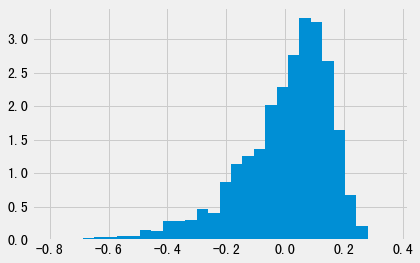

------LSTM-----3------2018-07-31-----
start date: 2011-11-30 . end date : 2018-04-27. the number of data: 166114
start date: 2018-05-31 . end date : 2018-06-29. the number of data: 5937
start date: 2018-07-31 . end date : 2018-07-31. the number of data: 3104
---LSTMModel init----
Epoch: 0
train loss 0.969315, train score -0.969315, valid loss 0.925630, valid score -0.925630
Epoch: 1
train loss 0.966575, train score -0.966575, valid loss 0.917779, valid score -0.917779
Epoch: 2
train loss 0.964235, train score -0.964235, valid loss 0.917358, valid score -0.917358
Epoch: 3
train loss 0.962386, train score -0.962386, valid loss 0.919236, valid score -0.919236
Epoch: 4
train loss 0.961424, train score -0.961424, valid loss 0.916102, valid score -0.916102
Epoch: 5
train loss 0.959471, train score -0.959471, valid loss 0.919403, valid score -0.919403
Epoch: 6
train loss 0.959079, train score -0.959079, valid loss 0.915314, valid score -0.915314
Epoch: 7
train loss 0.958464, train score -0.95

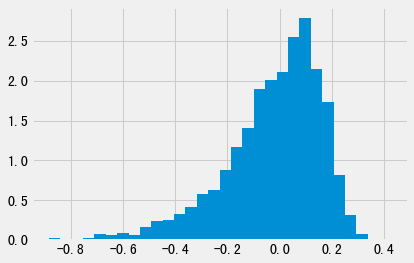

------LSTM-----3------2018-08-31-----
start date: 2011-12-30 . end date : 2018-05-31. the number of data: 167256
start date: 2018-06-29 . end date : 2018-07-31. the number of data: 6107
start date: 2018-08-31 . end date : 2018-08-31. the number of data: 3165
---LSTMModel init----
Epoch: 0
train loss 0.972657, train score -0.972657, valid loss 0.956521, valid score -0.956521
Epoch: 1
train loss 0.966829, train score -0.966829, valid loss 0.962657, valid score -0.962657
Epoch: 2
train loss 0.965297, train score -0.965297, valid loss 0.957837, valid score -0.957837
Epoch: 3
train loss 0.963620, train score -0.963620, valid loss 0.961231, valid score -0.961231
Epoch: 4
train loss 0.961922, train score -0.961922, valid loss 0.956371, valid score -0.956371
Epoch: 5
train loss 0.960730, train score -0.960730, valid loss 0.965250, valid score -0.965250
Epoch: 6
train loss 0.959720, train score -0.959720, valid loss 0.959515, valid score -0.959515
Epoch: 7
train loss 0.958194, train score -0.95

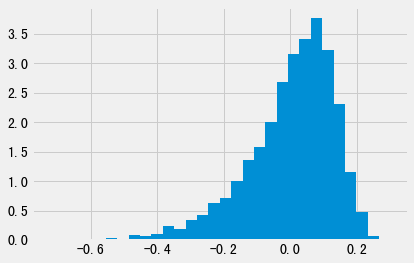

------LSTM-----3------2018-09-28-----
start date: 2012-01-31 . end date : 2018-06-29. the number of data: 168438
start date: 2018-07-31 . end date : 2018-08-31. the number of data: 6269
start date: 2018-09-28 . end date : 2018-09-28. the number of data: 3212
---LSTMModel init----
Epoch: 0
train loss 0.969708, train score -0.969708, valid loss 0.959172, valid score -0.959172
Epoch: 1
train loss 0.965698, train score -0.965698, valid loss 0.963220, valid score -0.963220
Epoch: 2
train loss 0.963767, train score -0.963767, valid loss 0.961167, valid score -0.961167
Epoch: 3
train loss 0.962018, train score -0.962018, valid loss 0.960970, valid score -0.960970
Epoch: 4
train loss 0.961228, train score -0.961228, valid loss 0.960634, valid score -0.960634
Epoch: 5
train loss 0.960072, train score -0.960072, valid loss 0.961119, valid score -0.961119
Epoch: 6
train loss 0.958357, train score -0.958357, valid loss 0.962888, valid score -0.962888
Epoch: 7
train loss 0.956954, train score -0.95

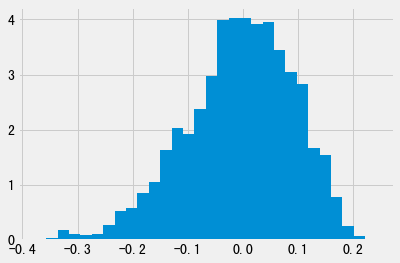

------LSTM-----3------2018-10-31-----
start date: 2012-02-29 . end date : 2018-07-31. the number of data: 169691
start date: 2018-08-31 . end date : 2018-09-28. the number of data: 6377
start date: 2018-10-31 . end date : 2018-10-31. the number of data: 3257
---LSTMModel init----
Epoch: 0
train loss 0.970368, train score -0.970368, valid loss 0.980398, valid score -0.980398
Epoch: 1
train loss 0.965516, train score -0.965516, valid loss 0.981271, valid score -0.981271
Epoch: 2
train loss 0.963549, train score -0.963549, valid loss 0.976264, valid score -0.976264
Epoch: 3
train loss 0.961824, train score -0.961824, valid loss 0.974547, valid score -0.974547
Epoch: 4
train loss 0.960262, train score -0.960262, valid loss 0.970424, valid score -0.970424
Epoch: 5
train loss 0.958845, train score -0.958845, valid loss 0.969610, valid score -0.969610
Epoch: 6
train loss 0.957196, train score -0.957196, valid loss 0.971743, valid score -0.971743
Epoch: 7
train loss 0.956016, train score -0.95

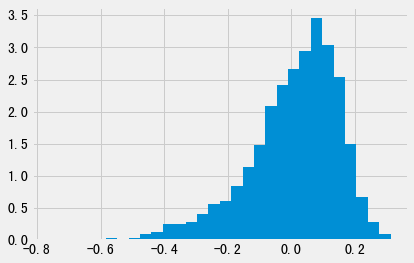

------LSTM-----3------2018-11-30-----
start date: 2012-03-30 . end date : 2018-08-31. the number of data: 171003
start date: 2018-09-28 . end date : 2018-10-31. the number of data: 6469
start date: 2018-11-30 . end date : 2018-11-30. the number of data: 3292
---LSTMModel init----
Epoch: 0
train loss 0.970748, train score -0.970748, valid loss 0.976104, valid score -0.976104
Epoch: 1
train loss 0.965926, train score -0.965926, valid loss 0.965321, valid score -0.965321
Epoch: 2
train loss 0.963824, train score -0.963824, valid loss 0.964642, valid score -0.964642
Epoch: 3
train loss 0.961593, train score -0.961593, valid loss 0.964796, valid score -0.964796
Epoch: 4
train loss 0.961127, train score -0.961127, valid loss 0.963446, valid score -0.963446
Epoch: 5
train loss 0.958792, train score -0.958792, valid loss 0.962363, valid score -0.962363
Epoch: 6
train loss 0.957754, train score -0.957754, valid loss 0.963175, valid score -0.963175
Epoch: 7
train loss 0.956165, train score -0.95

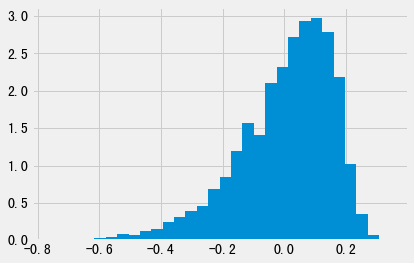

------LSTM-----3------2018-12-28-----
start date: 2012-04-27 . end date : 2018-09-28. the number of data: 172403
start date: 2018-10-31 . end date : 2018-11-30. the number of data: 6549
start date: 2018-12-28 . end date : 2018-12-28. the number of data: 3327
---LSTMModel init----
Epoch: 0
train loss 0.970674, train score -0.970674, valid loss 0.972891, valid score -0.972891
Epoch: 1
train loss 0.965742, train score -0.965742, valid loss 0.968261, valid score -0.968261
Epoch: 2
train loss 0.964002, train score -0.964002, valid loss 0.969469, valid score -0.969469
Epoch: 3
train loss 0.962604, train score -0.962604, valid loss 0.971043, valid score -0.971043
Epoch: 4
train loss 0.960808, train score -0.960808, valid loss 0.971850, valid score -0.971850
Epoch: 5
train loss 0.959527, train score -0.959527, valid loss 0.974375, valid score -0.974375
Epoch: 6
train loss 0.957700, train score -0.957700, valid loss 0.975177, valid score -0.975177
Epoch: 7
train loss 0.956904, train score -0.95

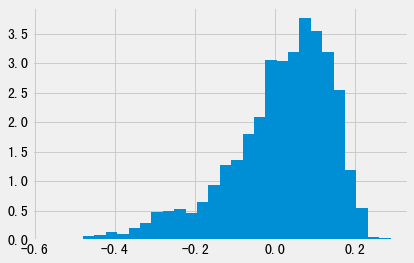

------LSTM-----3------2019-01-31-----
start date: 2012-05-31 . end date : 2018-10-31. the number of data: 173841
start date: 2018-11-30 . end date : 2018-12-28. the number of data: 6619
start date: 2019-01-31 . end date : 2019-01-31. the number of data: 3375
---LSTMModel init----
Epoch: 0
train loss 0.970639, train score -0.970639, valid loss 0.958139, valid score -0.958139
Epoch: 1
train loss 0.965777, train score -0.965777, valid loss 0.950244, valid score -0.950244
Epoch: 2
train loss 0.963787, train score -0.963787, valid loss 0.948208, valid score -0.948208
Epoch: 3
train loss 0.962324, train score -0.962324, valid loss 0.947796, valid score -0.947796
Epoch: 4
train loss 0.960914, train score -0.960914, valid loss 0.949721, valid score -0.949721
Epoch: 5
train loss 0.959132, train score -0.959132, valid loss 0.947194, valid score -0.947194
Epoch: 6
train loss 0.957977, train score -0.957977, valid loss 0.948338, valid score -0.948338
Epoch: 7
train loss 0.956433, train score -0.95

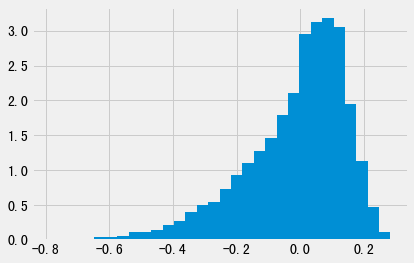

------LSTM-----3------2019-02-28-----
start date: 2012-06-29 . end date : 2018-11-30. the number of data: 175329
start date: 2018-12-28 . end date : 2019-01-31. the number of data: 6702
start date: 2019-02-28 . end date : 2019-02-28. the number of data: 3374
---LSTMModel init----
Epoch: 0
train loss 0.971595, train score -0.971595, valid loss 1.008052, valid score -1.008052
Epoch: 1
train loss 0.965359, train score -0.965359, valid loss 1.007834, valid score -1.007834
Epoch: 2
train loss 0.966051, train score -0.966051, valid loss 1.008499, valid score -1.008499
Epoch: 3
train loss 0.964157, train score -0.964157, valid loss 1.007731, valid score -1.007731
Epoch: 4
train loss 0.962739, train score -0.962739, valid loss 1.010744, valid score -1.010744
Epoch: 5
train loss 0.960469, train score -0.960469, valid loss 1.007646, valid score -1.007646
Epoch: 6
train loss 0.959519, train score -0.959519, valid loss 1.013206, valid score -1.013206
Epoch: 7
train loss 0.958433, train score -0.95

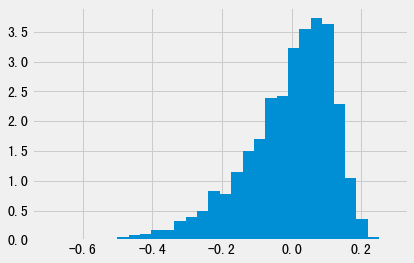

------LSTM-----3------2019-03-29-----
start date: 2012-07-31 . end date : 2018-12-28. the number of data: 176801
start date: 2019-01-31 . end date : 2019-02-28. the number of data: 6749
start date: 2019-03-29 . end date : 2019-03-29. the number of data: 3350
---LSTMModel init----
Epoch: 0
train loss 0.972600, train score -0.972600, valid loss 1.005993, valid score -1.005993
Epoch: 1
train loss 0.965825, train score -0.965825, valid loss 1.006974, valid score -1.006974
Epoch: 2
train loss 0.963857, train score -0.963857, valid loss 1.008132, valid score -1.008132
Epoch: 3
train loss 0.962390, train score -0.962390, valid loss 1.008107, valid score -1.008107
Epoch: 4
train loss 0.960917, train score -0.960917, valid loss 1.011749, valid score -1.011749
Epoch: 5
train loss 0.960139, train score -0.960139, valid loss 1.007297, valid score -1.007297
Epoch: 6
train loss 0.959139, train score -0.959139, valid loss 1.017507, valid score -1.017507
Epoch: 7
train loss 0.957309, train score -0.95

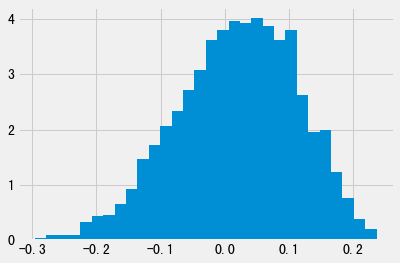

------LSTM-----3------2019-04-30-----
start date: 2012-08-31 . end date : 2019-01-31. the number of data: 178224
start date: 2019-02-28 . end date : 2019-03-29. the number of data: 6724
start date: 2019-04-30 . end date : 2019-04-30. the number of data: 3332
---LSTMModel init----
Epoch: 0
train loss 0.970711, train score -0.970711, valid loss 0.970268, valid score -0.970268
Epoch: 1
train loss 0.966096, train score -0.966096, valid loss 0.963853, valid score -0.963853
Epoch: 2
train loss 0.964186, train score -0.964186, valid loss 0.961264, valid score -0.961264
Epoch: 3
train loss 0.963032, train score -0.963032, valid loss 0.959833, valid score -0.959833
Epoch: 4
train loss 0.961348, train score -0.961348, valid loss 0.958844, valid score -0.958844
Epoch: 5
train loss 0.959717, train score -0.959717, valid loss 0.957686, valid score -0.957686
Epoch: 6
train loss 0.959937, train score -0.959937, valid loss 0.963299, valid score -0.963299
Epoch: 7
train loss 0.957532, train score -0.95

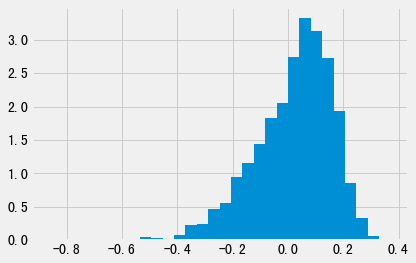

------LSTM-----3------2019-05-31-----
start date: 2012-09-28 . end date : 2019-02-28. the number of data: 179562
start date: 2019-03-29 . end date : 2019-04-30. the number of data: 6682
start date: 2019-05-31 . end date : 2019-05-31. the number of data: 3341
---LSTMModel init----
Epoch: 0
train loss 0.972894, train score -0.972894, valid loss 0.973471, valid score -0.973471
Epoch: 1
train loss 0.967634, train score -0.967634, valid loss 0.971937, valid score -0.971937
Epoch: 2
train loss 0.965461, train score -0.965461, valid loss 0.971880, valid score -0.971880
Epoch: 3
train loss 0.963829, train score -0.963829, valid loss 0.971989, valid score -0.971989
Epoch: 4
train loss 0.962084, train score -0.962084, valid loss 0.973524, valid score -0.973524
Epoch: 5
train loss 0.960629, train score -0.960629, valid loss 0.972507, valid score -0.972507
Epoch: 6
train loss 0.959224, train score -0.959224, valid loss 0.976470, valid score -0.976470
Epoch: 7
train loss 0.958044, train score -0.95

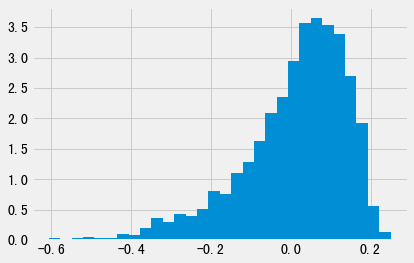

------LSTM-----3------2019-06-28-----
start date: 2012-10-31 . end date : 2019-03-29. the number of data: 180808
start date: 2019-04-30 . end date : 2019-05-31. the number of data: 6673
start date: 2019-06-28 . end date : 2019-06-28. the number of data: 3381
---LSTMModel init----
Epoch: 0
train loss 0.970100, train score -0.970100, valid loss 0.962522, valid score -0.962522
Epoch: 1
train loss 0.965573, train score -0.965573, valid loss 0.955156, valid score -0.955156
Epoch: 2
train loss 0.962777, train score -0.962777, valid loss 0.954934, valid score -0.954934
Epoch: 3
train loss 0.963695, train score -0.963695, valid loss 0.954032, valid score -0.954032
Epoch: 4
train loss 0.962453, train score -0.962453, valid loss 0.952366, valid score -0.952366
Epoch: 5
train loss 0.961346, train score -0.961346, valid loss 0.953367, valid score -0.953367
Epoch: 6
train loss 0.958856, train score -0.958856, valid loss 0.952150, valid score -0.952150
Epoch: 7
train loss 0.957154, train score -0.95

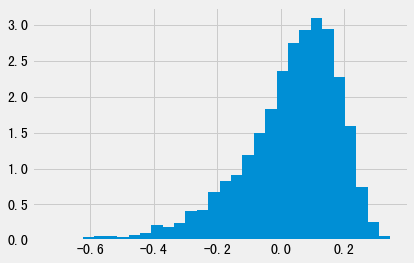

------LSTM-----3------2019-07-31-----
start date: 2012-11-30 . end date : 2019-04-30. the number of data: 182001
start date: 2019-05-31 . end date : 2019-06-28. the number of data: 6722
start date: 2019-07-31 . end date : 2019-07-31. the number of data: 3397
---LSTMModel init----
Epoch: 0
train loss 0.970158, train score -0.970158, valid loss 0.947024, valid score -0.947024
Epoch: 1
train loss 0.966205, train score -0.966205, valid loss 0.942767, valid score -0.942767
Epoch: 2
train loss 0.965041, train score -0.965041, valid loss 0.943453, valid score -0.943453
Epoch: 3
train loss 0.963518, train score -0.963518, valid loss 0.945816, valid score -0.945816
Epoch: 4
train loss 0.962065, train score -0.962065, valid loss 0.946152, valid score -0.946152
Epoch: 5
train loss 0.960715, train score -0.960715, valid loss 0.943447, valid score -0.943447
Epoch: 6
train loss 0.958408, train score -0.958408, valid loss 0.945736, valid score -0.945736
Epoch: 7
train loss 0.957749, train score -0.95

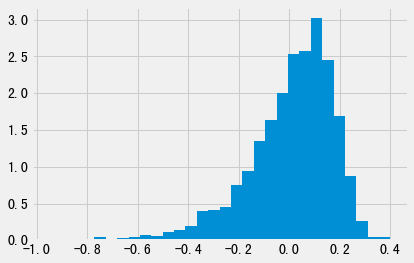

------LSTM-----3------2019-08-30-----
start date: 2012-12-31 . end date : 2019-05-31. the number of data: 183180
start date: 2019-06-28 . end date : 2019-07-31. the number of data: 6778
start date: 2019-08-30 . end date : 2019-08-30. the number of data: 3406
---LSTMModel init----
Epoch: 0
train loss 0.971833, train score -0.971833, valid loss 0.994098, valid score -0.994098
Epoch: 1
train loss 0.966370, train score -0.966370, valid loss 0.998074, valid score -0.998074
Epoch: 2
train loss 0.964540, train score -0.964540, valid loss 1.001070, valid score -1.001070
Epoch: 3
train loss 0.962916, train score -0.962916, valid loss 1.004051, valid score -1.004051
Epoch: 4
train loss 0.961667, train score -0.961667, valid loss 1.002433, valid score -1.002433
Epoch: 5
train loss 0.960055, train score -0.960055, valid loss 1.003153, valid score -1.003153
Epoch: 6
train loss 0.958844, train score -0.958844, valid loss 1.004158, valid score -1.004158
Epoch: 7
train loss 0.957101, train score -0.95

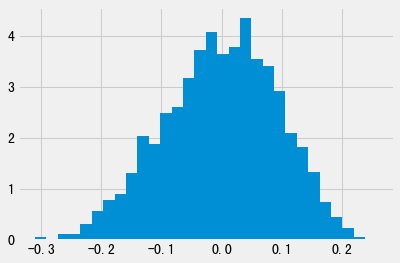

------LSTM-----3------2019-09-30-----
start date: 2013-01-31 . end date : 2019-06-28. the number of data: 184378
start date: 2019-07-31 . end date : 2019-08-30. the number of data: 6803
start date: 2019-09-30 . end date : 2019-09-30. the number of data: 3410
---LSTMModel init----
Epoch: 0
train loss 0.971274, train score -0.971274, valid loss 0.988582, valid score -0.988582
Epoch: 1
train loss 0.966336, train score -0.966336, valid loss 0.987106, valid score -0.987106
Epoch: 2
train loss 0.964260, train score -0.964260, valid loss 0.988486, valid score -0.988486
Epoch: 3
train loss 0.962841, train score -0.962841, valid loss 0.988721, valid score -0.988721
Epoch: 4
train loss 0.961562, train score -0.961562, valid loss 0.989937, valid score -0.989937
Epoch: 5
train loss 0.960026, train score -0.960026, valid loss 0.989807, valid score -0.989807
Epoch: 6
train loss 0.959188, train score -0.959188, valid loss 0.990149, valid score -0.990149
Epoch: 7
train loss 0.957665, train score -0.95

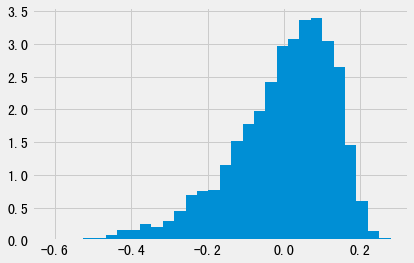

------LSTM-----3------2019-10-31-----
start date: 2013-02-28 . end date : 2019-07-31. the number of data: 185587
start date: 2019-08-30 . end date : 2019-09-30. the number of data: 6816
start date: 2019-10-31 . end date : 2019-10-31. the number of data: 3420
---LSTMModel init----
Epoch: 0
train loss 0.972875, train score -0.972875, valid loss 0.962658, valid score -0.962658
Epoch: 1
train loss 0.968274, train score -0.968274, valid loss 0.957112, valid score -0.957112
Epoch: 2
train loss 0.964547, train score -0.964547, valid loss 0.954100, valid score -0.954100
Epoch: 3
train loss 0.963111, train score -0.963111, valid loss 0.953556, valid score -0.953556
Epoch: 4
train loss 0.961815, train score -0.961815, valid loss 0.954522, valid score -0.954522
Epoch: 5
train loss 0.962770, train score -0.962770, valid loss 0.952834, valid score -0.952834
Epoch: 6
train loss 0.960518, train score -0.960518, valid loss 0.956846, valid score -0.956846
Epoch: 7
train loss 0.959900, train score -0.95

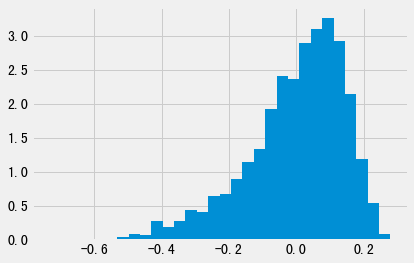

------LSTM-----3------2019-11-29-----
start date: 2013-03-29 . end date : 2019-08-30. the number of data: 186805
start date: 2019-09-30 . end date : 2019-10-31. the number of data: 6830
start date: 2019-11-29 . end date : 2019-11-29. the number of data: 3428
---LSTMModel init----
Epoch: 0
train loss 0.972465, train score -0.972465, valid loss 0.975674, valid score -0.975674
Epoch: 1
train loss 0.966724, train score -0.966724, valid loss 0.975524, valid score -0.975524
Epoch: 2
train loss 0.964819, train score -0.964819, valid loss 0.973541, valid score -0.973541
Epoch: 3
train loss 0.963618, train score -0.963618, valid loss 0.972674, valid score -0.972674
Epoch: 4
train loss 0.962207, train score -0.962207, valid loss 0.972899, valid score -0.972899
Epoch: 5
train loss 0.960920, train score -0.960920, valid loss 0.973665, valid score -0.973665
Epoch: 6
train loss 0.959519, train score -0.959519, valid loss 0.974690, valid score -0.974690
Epoch: 7
train loss 0.958604, train score -0.95

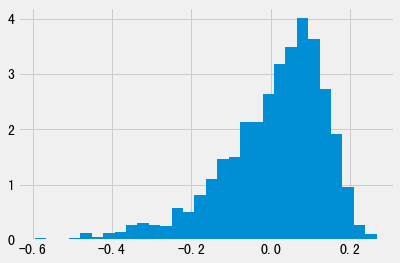

------LSTM-----3------2019-12-31-----
start date: 2013-04-26 . end date : 2019-09-30. the number of data: 188033
start date: 2019-10-31 . end date : 2019-11-29. the number of data: 6848
start date: 2019-12-31 . end date : 2019-12-31. the number of data: 3442
---LSTMModel init----
Epoch: 0
train loss 0.972204, train score -0.972204, valid loss 0.990777, valid score -0.990777
Epoch: 1
train loss 0.966773, train score -0.966773, valid loss 0.994196, valid score -0.994196
Epoch: 2
train loss 0.964683, train score -0.964683, valid loss 0.996692, valid score -0.996692
Epoch: 3
train loss 0.963499, train score -0.963499, valid loss 0.998332, valid score -0.998332
Epoch: 4
train loss 0.961752, train score -0.961752, valid loss 0.998500, valid score -0.998500
Epoch: 5
train loss 0.960277, train score -0.960277, valid loss 0.998150, valid score -0.998150
Epoch: 6
train loss 0.958878, train score -0.958878, valid loss 1.001945, valid score -1.001945
Epoch: 7
train loss 0.958089, train score -0.95

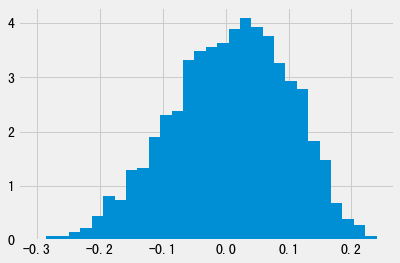

------LSTM-----3------2020-01-23-----
start date: 2013-05-31 . end date : 2019-10-31. the number of data: 189295
start date: 2019-11-29 . end date : 2019-12-31. the number of data: 6870
start date: 2020-01-23 . end date : 2020-01-23. the number of data: 3460
---LSTMModel init----
Epoch: 0
train loss 0.970575, train score -0.970575, valid loss 0.996145, valid score -0.996145
Epoch: 1
train loss 0.966272, train score -0.966272, valid loss 1.003069, valid score -1.003069
Epoch: 2
train loss 0.964244, train score -0.964244, valid loss 1.003821, valid score -1.003821
Epoch: 3
train loss 0.963070, train score -0.963070, valid loss 1.011393, valid score -1.011393
Epoch: 4
train loss 0.961396, train score -0.961396, valid loss 1.007784, valid score -1.007784
Epoch: 5
train loss 0.960276, train score -0.960276, valid loss 1.011224, valid score -1.011224
Epoch: 6
train loss 0.959140, train score -0.959140, valid loss 1.014823, valid score -1.014823
Epoch: 7
train loss 0.958232, train score -0.95

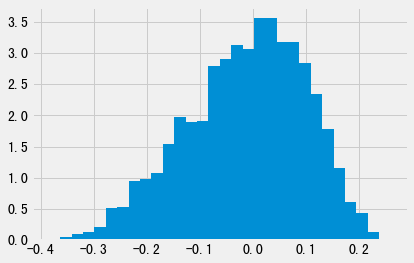

------LSTM-----3------2020-02-28-----
start date: 2013-06-28 . end date : 2019-11-29. the number of data: 190579
start date: 2019-12-31 . end date : 2020-01-23. the number of data: 6902
start date: 2020-02-28 . end date : 2020-02-28. the number of data: 3466
---LSTMModel init----
Epoch: 0
train loss 0.971507, train score -0.971507, valid loss 1.019251, valid score -1.019251
Epoch: 1
train loss 0.967684, train score -0.967684, valid loss 1.038910, valid score -1.038910
Epoch: 2
train loss 0.963686, train score -0.963686, valid loss 1.045091, valid score -1.045091
Epoch: 3
train loss 0.963089, train score -0.963089, valid loss 1.046044, valid score -1.046044
Epoch: 4
train loss 0.961779, train score -0.961779, valid loss 1.048885, valid score -1.048885
Epoch: 5
train loss 0.962443, train score -0.962443, valid loss 1.058105, valid score -1.058105
Epoch: 6
train loss 0.961397, train score -0.961397, valid loss 1.061304, valid score -1.061304
Epoch: 7
train loss 0.960147, train score -0.96

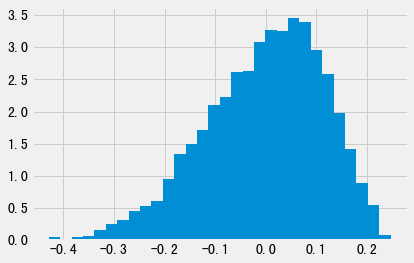

------LSTM-----3------2020-03-31-----
start date: 2013-07-31 . end date : 2019-12-31. the number of data: 191881
start date: 2020-01-23 . end date : 2020-02-28. the number of data: 6926
start date: 2020-03-31 . end date : 2020-03-31. the number of data: 3440
---LSTMModel init----
Epoch: 0
train loss 0.972173, train score -0.972173, valid loss 0.960322, valid score -0.960322
Epoch: 1
train loss 0.967049, train score -0.967049, valid loss 0.971116, valid score -0.971116
Epoch: 2
train loss 0.966004, train score -0.966004, valid loss 0.974150, valid score -0.974150
Epoch: 3
train loss 0.963177, train score -0.963177, valid loss 0.972762, valid score -0.972762
Epoch: 4
train loss 0.962775, train score -0.962775, valid loss 0.974709, valid score -0.974709
Epoch: 5
train loss 0.961059, train score -0.961059, valid loss 0.974800, valid score -0.974800
Epoch: 6
train loss 0.960228, train score -0.960228, valid loss 0.977624, valid score -0.977624
Epoch: 7
train loss 0.958569, train score -0.95

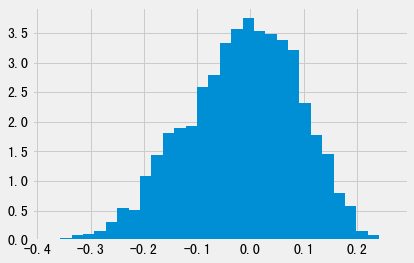

------LSTM-----3------2020-04-30-----
start date: 2013-08-30 . end date : 2020-01-23. the number of data: 193201
start date: 2020-02-28 . end date : 2020-03-31. the number of data: 6906
start date: 2020-04-30 . end date : 2020-04-30. the number of data: 3415
---LSTMModel init----
Epoch: 0
train loss 0.971996, train score -0.971996, valid loss 0.959048, valid score -0.959048
Epoch: 1
train loss 0.968610, train score -0.968610, valid loss 0.953728, valid score -0.953728
Epoch: 2
train loss 0.967063, train score -0.967063, valid loss 0.954597, valid score -0.954597
Epoch: 3
train loss 0.965800, train score -0.965800, valid loss 0.953365, valid score -0.953365
Epoch: 4
train loss 0.964265, train score -0.964265, valid loss 0.955014, valid score -0.955014
Epoch: 5
train loss 0.963210, train score -0.963210, valid loss 0.957925, valid score -0.957925
Epoch: 6
train loss 0.962455, train score -0.962455, valid loss 0.959002, valid score -0.959002
Epoch: 7
train loss 0.960602, train score -0.96

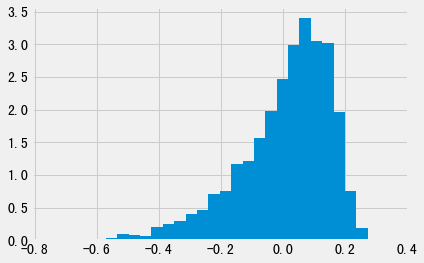

------LSTM-----3------2020-05-29-----
start date: 2013-09-30 . end date : 2020-02-28. the number of data: 194543
start date: 2020-03-31 . end date : 2020-04-30. the number of data: 6855
start date: 2020-05-29 . end date : 2020-05-29. the number of data: 3412
---LSTMModel init----
Epoch: 0
train loss 0.972249, train score -0.972249, valid loss 0.987128, valid score -0.987128
Epoch: 1
train loss 0.968336, train score -0.968336, valid loss 0.988486, valid score -0.988486
Epoch: 2
train loss 0.966536, train score -0.966536, valid loss 0.989432, valid score -0.989432
Epoch: 3
train loss 0.965337, train score -0.965337, valid loss 0.992332, valid score -0.992332
Epoch: 4
train loss 0.963959, train score -0.963959, valid loss 0.991823, valid score -0.991823
Epoch: 5
train loss 0.963151, train score -0.963151, valid loss 0.991778, valid score -0.991778
Epoch: 6
train loss 0.962130, train score -0.962130, valid loss 0.995597, valid score -0.995597
Epoch: 7
train loss 0.960793, train score -0.96

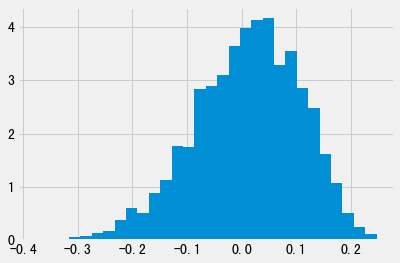

------LSTM-----3------2020-06-30-----
start date: 2013-10-31 . end date : 2020-03-31. the number of data: 195864
start date: 2020-04-30 . end date : 2020-05-29. the number of data: 6827
start date: 2020-06-30 . end date : 2020-06-30. the number of data: 3408
---LSTMModel init----
Epoch: 0
train loss 0.971690, train score -0.971690, valid loss 0.995467, valid score -0.995467
Epoch: 1
train loss 0.969149, train score -0.969149, valid loss 0.997885, valid score -0.997885
Epoch: 2
train loss 0.967488, train score -0.967488, valid loss 0.999802, valid score -0.999802
Epoch: 3
train loss 0.965559, train score -0.965559, valid loss 1.000986, valid score -1.000986
Epoch: 4
train loss 0.963774, train score -0.963774, valid loss 0.999612, valid score -0.999612
Epoch: 5
train loss 0.962380, train score -0.962380, valid loss 1.000032, valid score -1.000032
Epoch: 6
train loss 0.961599, train score -0.961599, valid loss 1.006340, valid score -1.006340
Epoch: 7
train loss 0.961191, train score -0.96

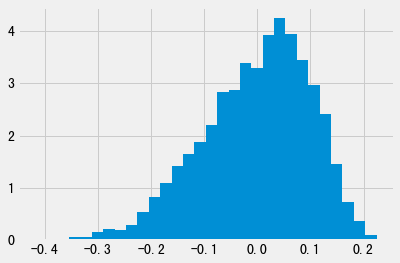

------LSTM-----3------2020-07-31-----
start date: 2013-11-29 . end date : 2020-04-30. the number of data: 197173
start date: 2020-05-29 . end date : 2020-06-30. the number of data: 6820
start date: 2020-07-31 . end date : 2020-07-31. the number of data: 3417
---LSTMModel init----
Epoch: 0
train loss 0.972898, train score -0.972898, valid loss 0.984762, valid score -0.984762
Epoch: 1
train loss 0.969192, train score -0.969192, valid loss 0.986826, valid score -0.986826
Epoch: 2
train loss 0.967041, train score -0.967041, valid loss 0.986565, valid score -0.986565
Epoch: 3
train loss 0.966092, train score -0.966092, valid loss 0.988438, valid score -0.988438
Epoch: 4
train loss 0.964733, train score -0.964733, valid loss 0.987262, valid score -0.987262
Epoch: 5
train loss 0.963106, train score -0.963106, valid loss 0.988968, valid score -0.988968
Epoch: 6
train loss 0.962506, train score -0.962506, valid loss 0.988641, valid score -0.988641
Epoch: 7
train loss 0.961333, train score -0.96

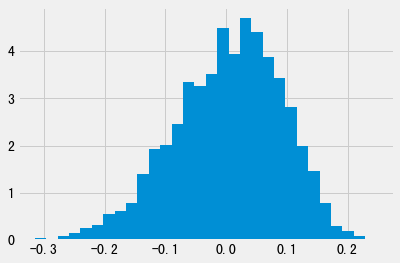

------LSTM-----6------2017-01-26-----
start date: 2010-08-31 . end date : 2016-10-31. the number of data: 127284
start date: 2016-11-30 . end date : 2016-12-30. the number of data: 4270
start date: 2017-01-26 . end date : 2017-01-26. the number of data: 2179
---LSTMModel init----
Epoch: 0
train loss 0.965719, train score -0.965719, valid loss 0.935360, valid score -0.935360
Epoch: 1
train loss 0.960079, train score -0.960079, valid loss 0.927744, valid score -0.927744
Epoch: 2
train loss 0.957341, train score -0.957341, valid loss 0.923467, valid score -0.923467
Epoch: 3
train loss 0.953829, train score -0.953829, valid loss 0.918167, valid score -0.918167
Epoch: 4
train loss 0.953801, train score -0.953801, valid loss 0.917198, valid score -0.917198
Epoch: 5
train loss 0.951451, train score -0.951451, valid loss 0.914078, valid score -0.914078
Epoch: 6
train loss 0.949969, train score -0.949969, valid loss 0.915174, valid score -0.915174
Epoch: 7
train loss 0.948615, train score -0.94

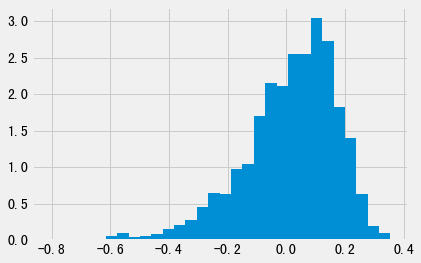

------LSTM-----6------2017-02-28-----
start date: 2010-09-30 . end date : 2016-11-30. the number of data: 128165
start date: 2016-12-30 . end date : 2017-01-26. the number of data: 4338
start date: 2017-02-28 . end date : 2017-02-28. the number of data: 2214
---LSTMModel init----
Epoch: 0
train loss 0.964406, train score -0.964406, valid loss 0.949048, valid score -0.949048
Epoch: 1
train loss 0.958668, train score -0.958668, valid loss 0.942446, valid score -0.942446
Epoch: 2
train loss 0.955178, train score -0.955178, valid loss 0.940470, valid score -0.940470
Epoch: 3
train loss 0.953534, train score -0.953534, valid loss 0.940730, valid score -0.940730
Epoch: 4
train loss 0.951748, train score -0.951748, valid loss 0.940488, valid score -0.940488
Epoch: 5
train loss 0.950637, train score -0.950637, valid loss 0.940257, valid score -0.940257
Epoch: 6
train loss 0.948718, train score -0.948718, valid loss 0.943268, valid score -0.943268
Epoch: 7
train loss 0.947456, train score -0.94

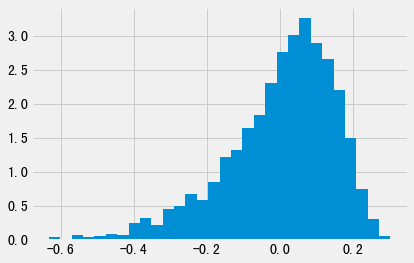

------LSTM-----6------2017-03-31-----
start date: 2010-10-29 . end date : 2016-12-30. the number of data: 129034
start date: 2017-01-26 . end date : 2017-02-28. the number of data: 4393
start date: 2017-03-31 . end date : 2017-03-31. the number of data: 2223
---LSTMModel init----
Epoch: 0
train loss 0.965439, train score -0.965439, valid loss 0.971233, valid score -0.971233
Epoch: 1
train loss 0.958737, train score -0.958737, valid loss 0.970308, valid score -0.970308
Epoch: 2
train loss 0.955096, train score -0.955096, valid loss 0.969926, valid score -0.969926
Epoch: 3
train loss 0.952548, train score -0.952548, valid loss 0.972313, valid score -0.972313
Epoch: 4
train loss 0.950930, train score -0.950930, valid loss 0.972625, valid score -0.972625
Epoch: 5
train loss 0.949784, train score -0.949784, valid loss 0.973575, valid score -0.973575
Epoch: 6
train loss 0.947944, train score -0.947944, valid loss 0.974012, valid score -0.974012
Epoch: 7
train loss 0.946579, train score -0.94

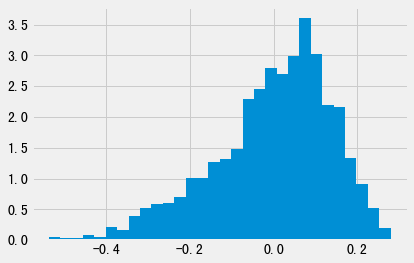

------LSTM-----6------2017-04-28-----
start date: 2010-11-30 . end date : 2017-01-26. the number of data: 129898
start date: 2017-02-28 . end date : 2017-03-31. the number of data: 4437
start date: 2017-04-28 . end date : 2017-04-28. the number of data: 2217
---LSTMModel init----
Epoch: 0
train loss 0.961185, train score -0.961185, valid loss 0.980776, valid score -0.980776
Epoch: 1
train loss 0.956049, train score -0.956049, valid loss 0.984539, valid score -0.984539
Epoch: 2
train loss 0.953237, train score -0.953237, valid loss 0.987433, valid score -0.987433
Epoch: 3
train loss 0.951401, train score -0.951401, valid loss 0.987278, valid score -0.987278
Epoch: 4
train loss 0.949506, train score -0.949506, valid loss 0.988399, valid score -0.988399
Epoch: 5
train loss 0.948015, train score -0.948015, valid loss 0.987867, valid score -0.987867
Epoch: 6
train loss 0.946593, train score -0.946593, valid loss 0.987283, valid score -0.987283
Epoch: 7
train loss 0.945019, train score -0.94

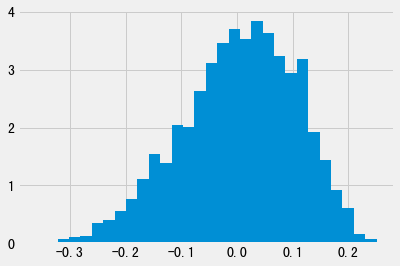

------LSTM-----6------2017-05-31-----
start date: 2010-12-31 . end date : 2017-02-28. the number of data: 130751
start date: 2017-03-31 . end date : 2017-04-28. the number of data: 4440
start date: 2017-05-31 . end date : 2017-05-31. the number of data: 2257
---LSTMModel init----
Epoch: 0
train loss 0.964036, train score -0.964036, valid loss 0.976539, valid score -0.976539
Epoch: 1
train loss 0.956355, train score -0.956355, valid loss 0.983792, valid score -0.983792
Epoch: 2
train loss 0.952997, train score -0.952997, valid loss 0.981100, valid score -0.981100
Epoch: 3
train loss 0.953295, train score -0.953295, valid loss 0.983907, valid score -0.983907
Epoch: 4
train loss 0.950612, train score -0.950612, valid loss 0.980857, valid score -0.980857
Epoch: 5
train loss 0.948293, train score -0.948293, valid loss 0.980627, valid score -0.980627
Epoch: 6
train loss 0.948917, train score -0.948917, valid loss 0.983093, valid score -0.983093
Epoch: 7
train loss 0.944929, train score -0.94

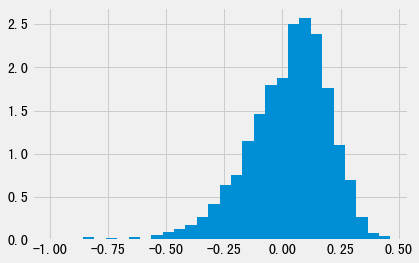

------LSTM-----6------2017-06-30-----
start date: 2011-01-31 . end date : 2017-03-31. the number of data: 131577
start date: 2017-04-28 . end date : 2017-05-31. the number of data: 4474
start date: 2017-06-30 . end date : 2017-06-30. the number of data: 2268
---LSTMModel init----
Epoch: 0
train loss 0.962281, train score -0.962281, valid loss 0.961019, valid score -0.961019
Epoch: 1
train loss 0.957631, train score -0.957631, valid loss 0.954239, valid score -0.954239
Epoch: 2
train loss 0.954169, train score -0.954169, valid loss 0.954111, valid score -0.954111
Epoch: 3
train loss 0.952393, train score -0.952393, valid loss 0.955369, valid score -0.955369
Epoch: 4
train loss 0.950950, train score -0.950950, valid loss 0.955345, valid score -0.955345
Epoch: 5
train loss 0.948297, train score -0.948297, valid loss 0.953864, valid score -0.953864
Epoch: 6
train loss 0.947819, train score -0.947819, valid loss 0.953573, valid score -0.953573
Epoch: 7
train loss 0.946191, train score -0.94

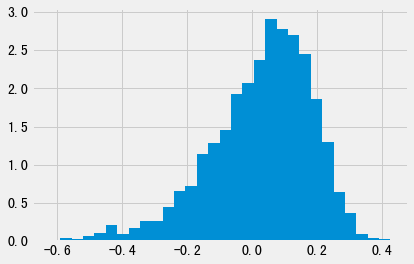

------LSTM-----6------2017-07-31-----
start date: 2011-02-28 . end date : 2017-04-28. the number of data: 132381
start date: 2017-05-31 . end date : 2017-06-30. the number of data: 4525
start date: 2017-07-31 . end date : 2017-07-31. the number of data: 2297
---LSTMModel init----
Epoch: 0
train loss 0.961758, train score -0.961758, valid loss 0.938598, valid score -0.938598
Epoch: 1
train loss 0.956493, train score -0.956493, valid loss 0.922439, valid score -0.922439
Epoch: 2
train loss 0.954216, train score -0.954216, valid loss 0.931476, valid score -0.931476
Epoch: 3
train loss 0.951741, train score -0.951741, valid loss 0.930617, valid score -0.930617
Epoch: 4
train loss 0.950605, train score -0.950605, valid loss 0.933599, valid score -0.933599
Epoch: 5
train loss 0.948794, train score -0.948794, valid loss 0.933758, valid score -0.933758
Epoch: 6
train loss 0.947615, train score -0.947615, valid loss 0.933034, valid score -0.933034
Epoch: 7
train loss 0.946835, train score -0.94

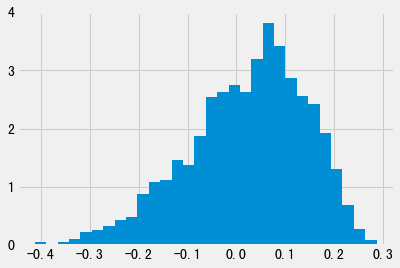

------LSTM-----6------2017-08-31-----
start date: 2011-03-31 . end date : 2017-05-31. the number of data: 133219
start date: 2017-06-30 . end date : 2017-07-31. the number of data: 4565
start date: 2017-08-31 . end date : 2017-08-31. the number of data: 2369
---LSTMModel init----
Epoch: 0
train loss 0.961608, train score -0.961608, valid loss 0.934654, valid score -0.934654
Epoch: 1
train loss 0.955936, train score -0.955936, valid loss 0.929367, valid score -0.929367
Epoch: 2
train loss 0.953013, train score -0.953013, valid loss 0.933346, valid score -0.933346
Epoch: 3
train loss 0.950995, train score -0.950995, valid loss 0.936294, valid score -0.936294
Epoch: 4
train loss 0.950089, train score -0.950089, valid loss 0.933853, valid score -0.933853
Epoch: 5
train loss 0.948255, train score -0.948255, valid loss 0.933582, valid score -0.933582
Epoch: 6
train loss 0.947427, train score -0.947427, valid loss 0.930636, valid score -0.930636
Epoch: 7
train loss 0.945376, train score -0.94

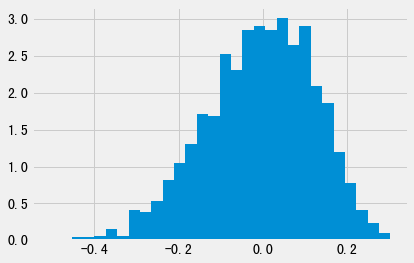

------LSTM-----6------2017-09-29-----
start date: 2011-04-29 . end date : 2017-06-30. the number of data: 134082
start date: 2017-07-31 . end date : 2017-08-31. the number of data: 4666
start date: 2017-09-29 . end date : 2017-09-29. the number of data: 2439
---LSTMModel init----
Epoch: 0
train loss 0.958176, train score -0.958176, valid loss 0.956274, valid score -0.956274
Epoch: 1
train loss 0.953759, train score -0.953759, valid loss 0.953131, valid score -0.953131
Epoch: 2
train loss 0.951375, train score -0.951375, valid loss 0.954903, valid score -0.954903
Epoch: 3
train loss 0.949880, train score -0.949880, valid loss 0.952087, valid score -0.952087
Epoch: 4
train loss 0.948480, train score -0.948480, valid loss 0.952666, valid score -0.952666
Epoch: 5
train loss 0.947252, train score -0.947252, valid loss 0.949588, valid score -0.949588
Epoch: 6
train loss 0.945599, train score -0.945599, valid loss 0.946680, valid score -0.946680
Epoch: 7
train loss 0.944030, train score -0.94

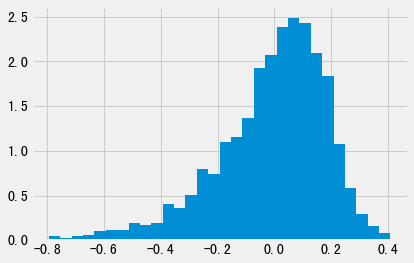

------LSTM-----6------2017-10-31-----
start date: 2011-05-31 . end date : 2017-07-31. the number of data: 134961
start date: 2017-08-31 . end date : 2017-09-29. the number of data: 4808
start date: 2017-10-31 . end date : 2017-10-31. the number of data: 2462
---LSTMModel init----
Epoch: 0
train loss 0.959940, train score -0.959940, valid loss 0.949216, valid score -0.949216
Epoch: 1
train loss 0.954511, train score -0.954511, valid loss 0.945271, valid score -0.945271
Epoch: 2
train loss 0.951676, train score -0.951676, valid loss 0.943280, valid score -0.943280
Epoch: 3
train loss 0.949989, train score -0.949989, valid loss 0.939414, valid score -0.939414
Epoch: 4
train loss 0.948618, train score -0.948618, valid loss 0.940491, valid score -0.940491
Epoch: 5
train loss 0.947430, train score -0.947430, valid loss 0.938822, valid score -0.938822
Epoch: 6
train loss 0.945415, train score -0.945415, valid loss 0.938667, valid score -0.938667
Epoch: 7
train loss 0.943856, train score -0.94

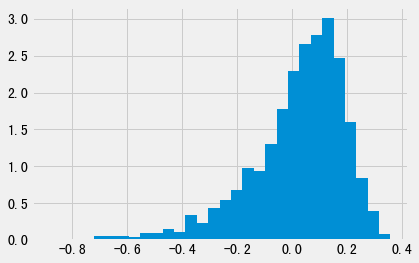

------LSTM-----6------2017-11-30-----
start date: 2011-06-30 . end date : 2017-08-31. the number of data: 135914
start date: 2017-09-29 . end date : 2017-10-31. the number of data: 4901
start date: 2017-11-30 . end date : 2017-11-30. the number of data: 2512
---LSTMModel init----
Epoch: 0
train loss 0.960095, train score -0.960095, valid loss 0.942524, valid score -0.942524
Epoch: 1
train loss 0.956504, train score -0.956504, valid loss 0.931200, valid score -0.931200
Epoch: 2
train loss 0.951741, train score -0.951741, valid loss 0.929161, valid score -0.929161
Epoch: 3
train loss 0.948499, train score -0.948499, valid loss 0.924389, valid score -0.924389
Epoch: 4
train loss 0.947832, train score -0.947832, valid loss 0.926194, valid score -0.926194
Epoch: 5
train loss 0.947072, train score -0.947072, valid loss 0.925335, valid score -0.925335
Epoch: 6
train loss 0.944159, train score -0.944159, valid loss 0.921988, valid score -0.921988
Epoch: 7
train loss 0.945978, train score -0.94

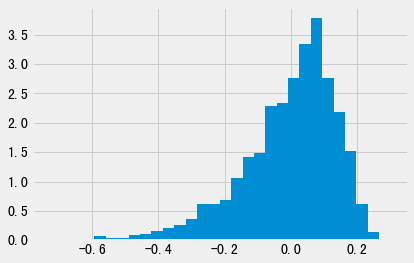

------LSTM-----6------2017-12-29-----
start date: 2011-07-29 . end date : 2017-09-29. the number of data: 136928
start date: 2017-10-31 . end date : 2017-11-30. the number of data: 4974
start date: 2017-12-29 . end date : 2017-12-29. the number of data: 2545
---LSTMModel init----
Epoch: 0
train loss 0.957308, train score -0.957308, valid loss 0.964448, valid score -0.964448
Epoch: 1
train loss 0.952577, train score -0.952577, valid loss 0.955874, valid score -0.955874
Epoch: 2
train loss 0.950869, train score -0.950869, valid loss 0.952630, valid score -0.952630
Epoch: 3
train loss 0.947347, train score -0.947347, valid loss 0.950681, valid score -0.950681
Epoch: 4
train loss 0.946722, train score -0.946722, valid loss 0.947013, valid score -0.947013
Epoch: 5
train loss 0.945437, train score -0.945437, valid loss 0.949667, valid score -0.949667
Epoch: 6
train loss 0.943642, train score -0.943642, valid loss 0.944828, valid score -0.944828
Epoch: 7
train loss 0.942431, train score -0.94

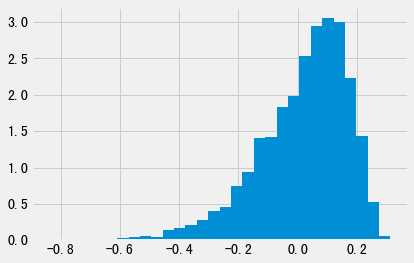

------LSTM-----6------2018-01-31-----
start date: 2011-08-31 . end date : 2017-10-31. the number of data: 137942
start date: 2017-11-30 . end date : 2017-12-29. the number of data: 5057
start date: 2018-01-31 . end date : 2018-01-31. the number of data: 2570
---LSTMModel init----
Epoch: 0
train loss 0.958949, train score -0.958949, valid loss 1.086544, valid score -1.086544
Epoch: 1
train loss 0.952798, train score -0.952798, valid loss 1.065942, valid score -1.065942
Epoch: 2
train loss 0.950374, train score -0.950374, valid loss 1.063711, valid score -1.063711
Epoch: 3
train loss 0.948585, train score -0.948585, valid loss 1.055103, valid score -1.055103
Epoch: 4
train loss 0.947211, train score -0.947211, valid loss 1.064262, valid score -1.064262
Epoch: 5
train loss 0.944551, train score -0.944551, valid loss 1.063079, valid score -1.063079
Epoch: 6
train loss 0.943797, train score -0.943797, valid loss 1.050032, valid score -1.050032
Epoch: 7
train loss 0.942181, train score -0.94

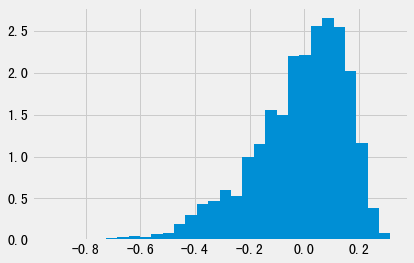

------LSTM-----6------2018-02-28-----
start date: 2011-09-30 . end date : 2017-11-30. the number of data: 138969
start date: 2017-12-29 . end date : 2018-01-31. the number of data: 5115
start date: 2018-02-28 . end date : 2018-02-28. the number of data: 2608
---LSTMModel init----
Epoch: 0
train loss 0.959030, train score -0.959030, valid loss 1.027780, valid score -1.027780
Epoch: 1
train loss 0.953749, train score -0.953749, valid loss 1.021688, valid score -1.021688
Epoch: 2
train loss 0.950778, train score -0.950778, valid loss 1.021557, valid score -1.021557
Epoch: 3
train loss 0.948602, train score -0.948602, valid loss 1.024500, valid score -1.024500
Epoch: 4
train loss 0.946717, train score -0.946717, valid loss 1.026773, valid score -1.026773
Epoch: 5
train loss 0.945212, train score -0.945212, valid loss 1.029999, valid score -1.029999
Epoch: 6
train loss 0.943469, train score -0.943469, valid loss 1.026974, valid score -1.026974
Epoch: 7
train loss 0.942019, train score -0.94

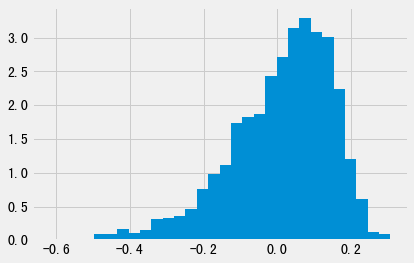

------LSTM-----6------2018-03-30-----
start date: 2011-10-31 . end date : 2017-12-29. the number of data: 139981
start date: 2018-01-31 . end date : 2018-02-28. the number of data: 5178
start date: 2018-03-30 . end date : 2018-03-30. the number of data: 2647
---LSTMModel init----
Epoch: 0
train loss 0.958233, train score -0.958233, valid loss 0.947607, valid score -0.947607
Epoch: 1
train loss 0.952514, train score -0.952514, valid loss 0.953088, valid score -0.953088
Epoch: 2
train loss 0.949609, train score -0.949609, valid loss 0.950871, valid score -0.950871
Epoch: 3
train loss 0.947177, train score -0.947177, valid loss 0.959817, valid score -0.959817
Epoch: 4
train loss 0.945783, train score -0.945783, valid loss 0.957072, valid score -0.957072
Epoch: 5
train loss 0.944292, train score -0.944292, valid loss 0.952394, valid score -0.952394
Epoch: 6
train loss 0.942345, train score -0.942345, valid loss 0.961843, valid score -0.961843
Epoch: 7
train loss 0.941820, train score -0.94

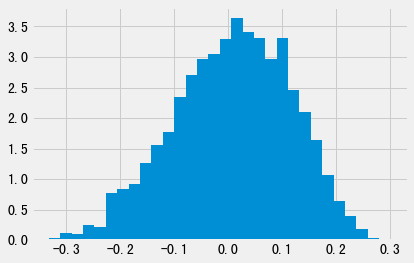

------LSTM-----6------2018-04-27-----
start date: 2011-11-30 . end date : 2018-01-31. the number of data: 140976
start date: 2018-02-28 . end date : 2018-03-30. the number of data: 5255
start date: 2018-04-27 . end date : 2018-04-27. the number of data: 2646
---LSTMModel init----
Epoch: 0
train loss 0.956831, train score -0.956831, valid loss 0.993412, valid score -0.993412
Epoch: 1
train loss 0.952517, train score -0.952517, valid loss 0.972423, valid score -0.972423
Epoch: 2
train loss 0.949079, train score -0.949079, valid loss 0.978298, valid score -0.978298
Epoch: 3
train loss 0.946263, train score -0.946263, valid loss 0.976263, valid score -0.976263
Epoch: 4
train loss 0.945145, train score -0.945145, valid loss 0.979341, valid score -0.979341
Epoch: 5
train loss 0.943802, train score -0.943802, valid loss 0.970363, valid score -0.970363
Epoch: 6
train loss 0.943673, train score -0.943673, valid loss 0.970692, valid score -0.970692
Epoch: 7
train loss 0.941918, train score -0.94

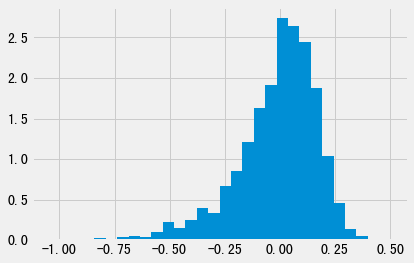

------LSTM-----6------2018-05-31-----
start date: 2011-12-30 . end date : 2018-02-28. the number of data: 141992
start date: 2018-03-30 . end date : 2018-04-27. the number of data: 5293
start date: 2018-05-31 . end date : 2018-05-31. the number of data: 2689
---LSTMModel init----
Epoch: 0
train loss 0.957500, train score -0.957500, valid loss 1.032661, valid score -1.032661
Epoch: 1
train loss 0.951875, train score -0.951875, valid loss 1.028485, valid score -1.028485
Epoch: 2
train loss 0.948625, train score -0.948625, valid loss 1.028649, valid score -1.028649
Epoch: 3
train loss 0.947417, train score -0.947417, valid loss 1.025194, valid score -1.025194
Epoch: 4
train loss 0.946411, train score -0.946411, valid loss 1.045934, valid score -1.045934
Epoch: 5
train loss 0.945188, train score -0.945188, valid loss 1.045744, valid score -1.045744
Epoch: 6
train loss 0.944769, train score -0.944769, valid loss 1.040097, valid score -1.040097
Epoch: 7
train loss 0.942099, train score -0.94

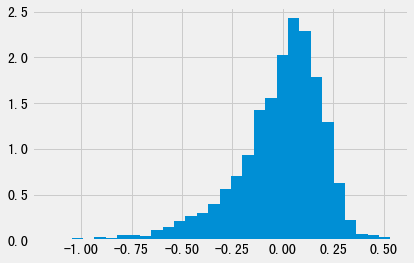

------LSTM-----6------2018-06-29-----
start date: 2012-01-31 . end date : 2018-03-30. the number of data: 142997
start date: 2018-04-27 . end date : 2018-05-31. the number of data: 5335
start date: 2018-06-29 . end date : 2018-06-29. the number of data: 2761
---LSTMModel init----
Epoch: 0
train loss 0.958520, train score -0.958520, valid loss 0.948525, valid score -0.948525
Epoch: 1
train loss 0.953227, train score -0.953227, valid loss 0.952246, valid score -0.952246
Epoch: 2
train loss 0.949926, train score -0.949926, valid loss 0.952175, valid score -0.952175
Epoch: 3
train loss 0.948145, train score -0.948145, valid loss 0.951870, valid score -0.951870
Epoch: 4
train loss 0.946377, train score -0.946377, valid loss 0.953663, valid score -0.953663
Epoch: 5
train loss 0.945072, train score -0.945072, valid loss 0.955527, valid score -0.955527
Epoch: 6
train loss 0.942944, train score -0.942944, valid loss 0.948091, valid score -0.948091
Epoch: 7
train loss 0.940917, train score -0.94

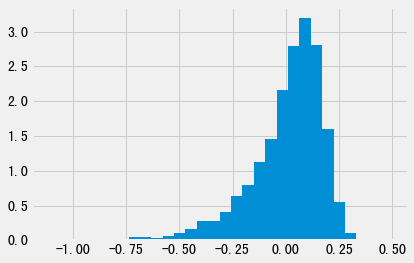

------LSTM-----6------2018-07-31-----
start date: 2012-02-29 . end date : 2018-04-27. the number of data: 143964
start date: 2018-05-31 . end date : 2018-06-29. the number of data: 5450
start date: 2018-07-31 . end date : 2018-07-31. the number of data: 2832
---LSTMModel init----
Epoch: 0
train loss 0.955683, train score -0.955683, valid loss 0.906593, valid score -0.906593
Epoch: 1
train loss 0.951192, train score -0.951192, valid loss 0.899491, valid score -0.899491
Epoch: 2
train loss 0.948736, train score -0.948736, valid loss 0.894315, valid score -0.894315
Epoch: 3
train loss 0.947212, train score -0.947212, valid loss 0.896727, valid score -0.896727
Epoch: 4
train loss 0.945781, train score -0.945781, valid loss 0.895268, valid score -0.895268
Epoch: 5
train loss 0.944426, train score -0.944426, valid loss 0.894616, valid score -0.894616
Epoch: 6
train loss 0.943237, train score -0.943237, valid loss 0.895293, valid score -0.895293
Epoch: 7
train loss 0.942076, train score -0.94

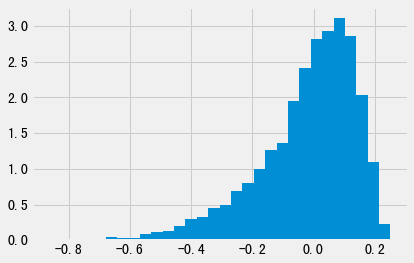

------LSTM-----6------2018-08-31-----
start date: 2012-03-30 . end date : 2018-05-31. the number of data: 144964
start date: 2018-06-29 . end date : 2018-07-31. the number of data: 5593
start date: 2018-08-31 . end date : 2018-08-31. the number of data: 2912
---LSTMModel init----
Epoch: 0
train loss 0.956911, train score -0.956911, valid loss 0.965740, valid score -0.965740
Epoch: 1
train loss 0.952598, train score -0.952598, valid loss 0.971136, valid score -0.971136
Epoch: 2
train loss 0.948889, train score -0.948889, valid loss 0.969056, valid score -0.969056
Epoch: 3
train loss 0.947772, train score -0.947772, valid loss 0.967168, valid score -0.967168
Epoch: 4
train loss 0.945672, train score -0.945672, valid loss 0.959608, valid score -0.959608
Epoch: 5
train loss 0.943963, train score -0.943963, valid loss 0.959614, valid score -0.959614
Epoch: 6
train loss 0.942270, train score -0.942270, valid loss 0.962891, valid score -0.962891
Epoch: 7
train loss 0.941119, train score -0.94

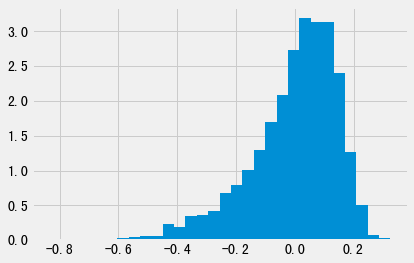

------LSTM-----6------2018-09-28-----
start date: 2012-04-27 . end date : 2018-06-29. the number of data: 146072
start date: 2018-07-31 . end date : 2018-08-31. the number of data: 5744
start date: 2018-09-28 . end date : 2018-09-28. the number of data: 2965
---LSTMModel init----
Epoch: 0
train loss 0.956709, train score -0.956709, valid loss 0.959866, valid score -0.959866
Epoch: 1
train loss 0.950953, train score -0.950953, valid loss 0.967285, valid score -0.967285
Epoch: 2
train loss 0.948351, train score -0.948351, valid loss 0.960937, valid score -0.960937
Epoch: 3
train loss 0.946620, train score -0.946620, valid loss 0.962642, valid score -0.962642
Epoch: 4
train loss 0.946648, train score -0.946648, valid loss 0.961206, valid score -0.961206
Epoch: 5
train loss 0.944588, train score -0.944588, valid loss 0.956266, valid score -0.956266
Epoch: 6
train loss 0.944126, train score -0.944126, valid loss 0.957203, valid score -0.957203
Epoch: 7
train loss 0.939647, train score -0.93

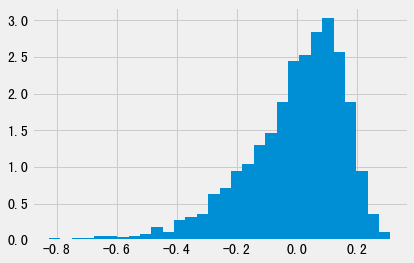

------LSTM-----6------2018-10-31-----
start date: 2012-05-31 . end date : 2018-07-31. the number of data: 147239
start date: 2018-08-31 . end date : 2018-09-28. the number of data: 5877
start date: 2018-10-31 . end date : 2018-10-31. the number of data: 3062
---LSTMModel init----
Epoch: 0
train loss 0.956392, train score -0.956392, valid loss 0.962662, valid score -0.962662
Epoch: 1
train loss 0.950815, train score -0.950815, valid loss 0.965580, valid score -0.965580
Epoch: 2
train loss 0.947267, train score -0.947267, valid loss 0.961702, valid score -0.961702
Epoch: 3
train loss 0.946568, train score -0.946568, valid loss 0.962485, valid score -0.962485
Epoch: 4
train loss 0.945063, train score -0.945063, valid loss 0.960131, valid score -0.960131
Epoch: 5
train loss 0.943697, train score -0.943697, valid loss 0.963629, valid score -0.963629
Epoch: 6
train loss 0.942126, train score -0.942126, valid loss 0.960647, valid score -0.960647
Epoch: 7
train loss 0.941175, train score -0.94

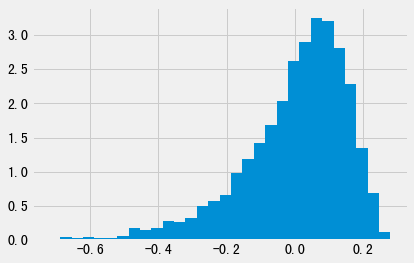

------LSTM-----6------2018-11-30-----
start date: 2012-06-29 . end date : 2018-08-31. the number of data: 148484
start date: 2018-09-28 . end date : 2018-10-31. the number of data: 6027
start date: 2018-11-30 . end date : 2018-11-30. the number of data: 3127
---LSTMModel init----
Epoch: 0
train loss 0.957195, train score -0.957195, valid loss 0.956925, valid score -0.956925
Epoch: 1
train loss 0.952271, train score -0.952271, valid loss 0.958991, valid score -0.958991
Epoch: 2
train loss 0.948450, train score -0.948450, valid loss 0.954163, valid score -0.954163
Epoch: 3
train loss 0.946516, train score -0.946516, valid loss 0.957010, valid score -0.957010
Epoch: 4
train loss 0.944780, train score -0.944780, valid loss 0.954302, valid score -0.954302
Epoch: 5
train loss 0.943012, train score -0.943012, valid loss 0.952980, valid score -0.952980
Epoch: 6
train loss 0.942255, train score -0.942255, valid loss 0.955066, valid score -0.955066
Epoch: 7
train loss 0.940058, train score -0.94

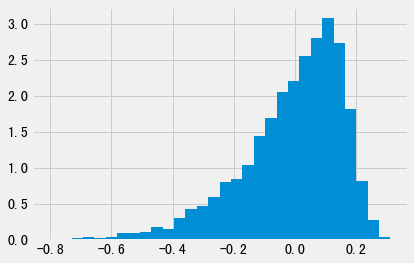

------LSTM-----6------2018-12-28-----
start date: 2012-07-31 . end date : 2018-09-28. the number of data: 149745
start date: 2018-10-31 . end date : 2018-11-30. the number of data: 6189
start date: 2018-12-28 . end date : 2018-12-28. the number of data: 3193
---LSTMModel init----
Epoch: 0
train loss 0.955823, train score -0.955823, valid loss 0.945347, valid score -0.945347
Epoch: 1
train loss 0.950958, train score -0.950958, valid loss 0.942618, valid score -0.942618
Epoch: 2
train loss 0.948627, train score -0.948627, valid loss 0.941900, valid score -0.941900
Epoch: 3
train loss 0.946167, train score -0.946167, valid loss 0.944267, valid score -0.944267
Epoch: 4
train loss 0.944700, train score -0.944700, valid loss 0.946269, valid score -0.946269
Epoch: 5
train loss 0.943069, train score -0.943069, valid loss 0.948900, valid score -0.948900
Epoch: 6
train loss 0.942047, train score -0.942047, valid loss 0.951114, valid score -0.951114
Epoch: 7
train loss 0.940223, train score -0.94

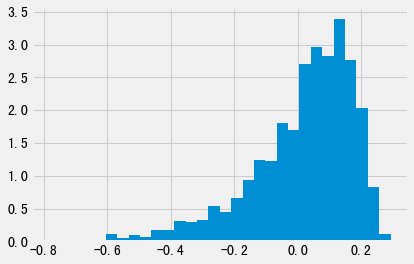

------LSTM-----6------2019-01-31-----
start date: 2012-08-31 . end date : 2018-10-31. the number of data: 151075
start date: 2018-11-30 . end date : 2018-12-28. the number of data: 6320
start date: 2019-01-31 . end date : 2019-01-31. the number of data: 3234
---LSTMModel init----
Epoch: 0
train loss 0.956324, train score -0.956324, valid loss 0.927032, valid score -0.927032
Epoch: 1
train loss 0.950554, train score -0.950554, valid loss 0.915469, valid score -0.915469
Epoch: 2
train loss 0.948009, train score -0.948009, valid loss 0.914342, valid score -0.914342
Epoch: 3
train loss 0.945039, train score -0.945039, valid loss 0.913540, valid score -0.913540
Epoch: 4
train loss 0.943264, train score -0.943264, valid loss 0.916972, valid score -0.916972
Epoch: 5
train loss 0.943111, train score -0.943111, valid loss 0.920344, valid score -0.920344
Epoch: 6
train loss 0.941982, train score -0.941982, valid loss 0.920364, valid score -0.920364
Epoch: 7
train loss 0.940678, train score -0.94

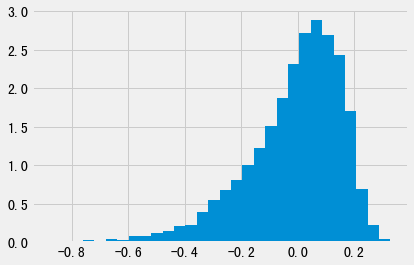

------LSTM-----6------2019-02-28-----
start date: 2012-09-28 . end date : 2018-11-30. the number of data: 152443
start date: 2018-12-28 . end date : 2019-01-31. the number of data: 6427
start date: 2019-02-28 . end date : 2019-02-28. the number of data: 3253
---LSTMModel init----
Epoch: 0
train loss 0.956377, train score -0.956377, valid loss 1.020552, valid score -1.020552
Epoch: 1
train loss 0.951301, train score -0.951301, valid loss 1.024053, valid score -1.024053
Epoch: 2
train loss 0.948086, train score -0.948086, valid loss 1.016914, valid score -1.016914
Epoch: 3
train loss 0.946962, train score -0.946962, valid loss 1.021967, valid score -1.021967
Epoch: 4
train loss 0.945028, train score -0.945028, valid loss 1.019914, valid score -1.019914
Epoch: 5
train loss 0.943673, train score -0.943673, valid loss 1.016418, valid score -1.016418
Epoch: 6
train loss 0.942523, train score -0.942523, valid loss 1.019621, valid score -1.019621
Epoch: 7
train loss 0.941746, train score -0.94

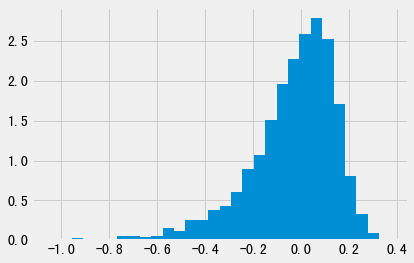

------LSTM-----6------2019-03-29-----
start date: 2012-10-31 . end date : 2018-12-28. the number of data: 153827
start date: 2019-01-31 . end date : 2019-02-28. the number of data: 6487
start date: 2019-03-29 . end date : 2019-03-29. the number of data: 3256
---LSTMModel init----
Epoch: 0
train loss 0.955727, train score -0.955727, valid loss 1.007595, valid score -1.007595
Epoch: 1
train loss 0.950749, train score -0.950749, valid loss 1.011439, valid score -1.011439
Epoch: 2
train loss 0.948064, train score -0.948064, valid loss 1.011232, valid score -1.011232
Epoch: 3
train loss 0.946971, train score -0.946971, valid loss 1.006400, valid score -1.006400
Epoch: 4
train loss 0.945319, train score -0.945319, valid loss 1.008568, valid score -1.008568
Epoch: 5
train loss 0.943501, train score -0.943501, valid loss 1.011376, valid score -1.011376
Epoch: 6
train loss 0.941841, train score -0.941841, valid loss 1.011797, valid score -1.011797
Epoch: 7
train loss 0.940806, train score -0.94

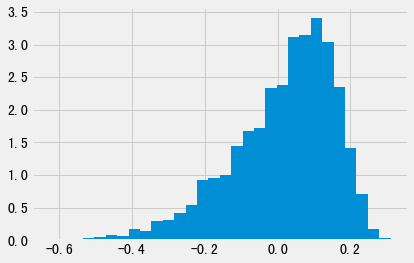

------LSTM-----6------2019-04-30-----
start date: 2012-11-30 . end date : 2019-01-31. the number of data: 155161
start date: 2019-02-28 . end date : 2019-03-29. the number of data: 6509
start date: 2019-04-30 . end date : 2019-04-30. the number of data: 3282
---LSTMModel init----
Epoch: 0
train loss 0.959755, train score -0.959755, valid loss 0.954729, valid score -0.954729
Epoch: 1
train loss 0.952199, train score -0.952199, valid loss 0.952492, valid score -0.952492
Epoch: 2
train loss 0.951343, train score -0.951343, valid loss 0.945277, valid score -0.945277
Epoch: 3
train loss 0.943982, train score -0.943982, valid loss 0.945496, valid score -0.945496
Epoch: 4
train loss 0.946055, train score -0.946055, valid loss 0.942836, valid score -0.942836
Epoch: 5
train loss 0.942854, train score -0.942854, valid loss 0.944059, valid score -0.944059
Epoch: 6
train loss 0.945431, train score -0.945431, valid loss 0.943664, valid score -0.943664
Epoch: 7
train loss 0.943597, train score -0.94

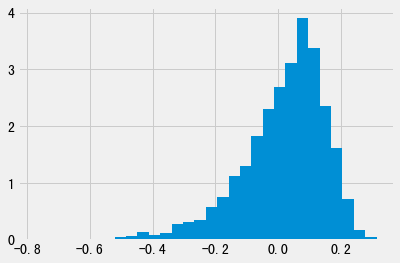

------LSTM-----6------2019-05-31-----
start date: 2012-12-31 . end date : 2019-02-28. the number of data: 156436
start date: 2019-03-29 . end date : 2019-04-30. the number of data: 6538
start date: 2019-05-31 . end date : 2019-05-31. the number of data: 3295
---LSTMModel init----
Epoch: 0
train loss 0.957931, train score -0.957931, valid loss 0.965082, valid score -0.965082
Epoch: 1
train loss 0.952356, train score -0.952356, valid loss 0.964456, valid score -0.964456
Epoch: 2
train loss 0.949042, train score -0.949042, valid loss 0.965662, valid score -0.965662
Epoch: 3
train loss 0.948190, train score -0.948190, valid loss 0.966475, valid score -0.966475
Epoch: 4
train loss 0.947047, train score -0.947047, valid loss 0.968109, valid score -0.968109
Epoch: 5
train loss 0.945683, train score -0.945683, valid loss 0.969095, valid score -0.969095
Epoch: 6
train loss 0.944093, train score -0.944093, valid loss 0.970093, valid score -0.970093
Epoch: 7
train loss 0.942440, train score -0.94

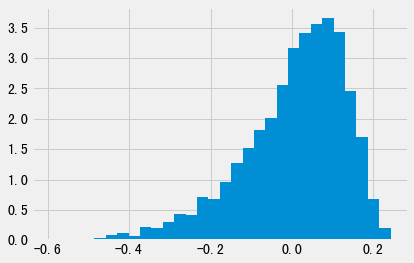

------LSTM-----6------2019-06-28-----
start date: 2013-01-31 . end date : 2019-03-29. the number of data: 157650
start date: 2019-04-30 . end date : 2019-05-31. the number of data: 6577
start date: 2019-06-28 . end date : 2019-06-28. the number of data: 3302
---LSTMModel init----
Epoch: 0
train loss 0.958226, train score -0.958226, valid loss 0.954218, valid score -0.954218
Epoch: 1
train loss 0.952973, train score -0.952973, valid loss 0.946886, valid score -0.946886
Epoch: 2
train loss 0.950069, train score -0.950069, valid loss 0.941873, valid score -0.941873
Epoch: 3
train loss 0.948198, train score -0.948198, valid loss 0.939426, valid score -0.939426
Epoch: 4
train loss 0.947045, train score -0.947045, valid loss 0.939395, valid score -0.939395
Epoch: 5
train loss 0.945376, train score -0.945376, valid loss 0.938784, valid score -0.938784
Epoch: 6
train loss 0.943824, train score -0.943824, valid loss 0.939691, valid score -0.939691
Epoch: 7
train loss 0.942725, train score -0.94

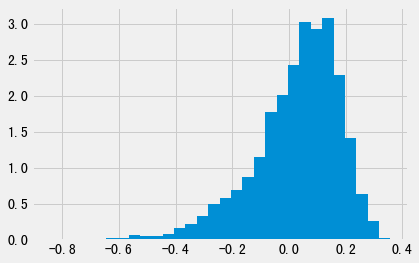

------LSTM-----6------2019-07-31-----
start date: 2013-02-28 . end date : 2019-04-30. the number of data: 158856
start date: 2019-05-31 . end date : 2019-06-28. the number of data: 6597
start date: 2019-07-31 . end date : 2019-07-31. the number of data: 3311
---LSTMModel init----
Epoch: 0
train loss 0.958931, train score -0.958931, valid loss 0.936971, valid score -0.936971
Epoch: 1
train loss 0.953351, train score -0.953351, valid loss 0.929874, valid score -0.929874
Epoch: 2
train loss 0.949901, train score -0.949901, valid loss 0.923775, valid score -0.923775
Epoch: 3
train loss 0.948247, train score -0.948247, valid loss 0.925868, valid score -0.925868
Epoch: 4
train loss 0.946774, train score -0.946774, valid loss 0.926536, valid score -0.926536
Epoch: 5
train loss 0.945483, train score -0.945483, valid loss 0.925175, valid score -0.925175
Epoch: 6
train loss 0.944083, train score -0.944083, valid loss 0.923371, valid score -0.923371
Epoch: 7
train loss 0.942867, train score -0.94

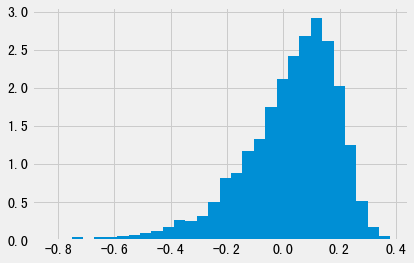

------LSTM-----6------2019-08-30-----
start date: 2013-03-29 . end date : 2019-05-31. the number of data: 160064
start date: 2019-06-28 . end date : 2019-07-31. the number of data: 6613
start date: 2019-08-30 . end date : 2019-08-30. the number of data: 3322
---LSTMModel init----
Epoch: 0
train loss 0.956465, train score -0.956465, valid loss 0.985438, valid score -0.985438
Epoch: 1
train loss 0.947346, train score -0.947346, valid loss 0.988148, valid score -0.988148
Epoch: 2
train loss 0.950710, train score -0.950710, valid loss 0.991033, valid score -0.991033
Epoch: 3
train loss 0.945968, train score -0.945968, valid loss 0.990900, valid score -0.990900
Epoch: 4
train loss 0.952484, train score -0.952484, valid loss 0.989994, valid score -0.989994
Epoch: 5
train loss 0.943563, train score -0.943563, valid loss 0.990707, valid score -0.990707
Epoch: 6
train loss 0.945025, train score -0.945025, valid loss 0.992879, valid score -0.992879
Epoch: 7
train loss 0.947705, train score -0.94

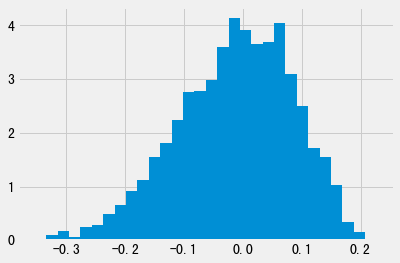

------LSTM-----6------2019-09-30-----
start date: 2013-04-26 . end date : 2019-06-28. the number of data: 161271
start date: 2019-07-31 . end date : 2019-08-30. the number of data: 6633
start date: 2019-09-30 . end date : 2019-09-30. the number of data: 3357
---LSTMModel init----
Epoch: 0
train loss 0.957835, train score -0.957835, valid loss 0.980247, valid score -0.980247
Epoch: 1
train loss 0.952306, train score -0.952306, valid loss 0.977054, valid score -0.977054
Epoch: 2
train loss 0.949243, train score -0.949243, valid loss 0.977101, valid score -0.977101
Epoch: 3
train loss 0.947874, train score -0.947874, valid loss 0.979643, valid score -0.979643
Epoch: 4
train loss 0.945276, train score -0.945276, valid loss 0.981273, valid score -0.981273
Epoch: 5
train loss 0.946050, train score -0.946050, valid loss 0.979973, valid score -0.979973
Epoch: 6
train loss 0.944745, train score -0.944745, valid loss 0.982761, valid score -0.982761
Epoch: 7
train loss 0.942407, train score -0.94

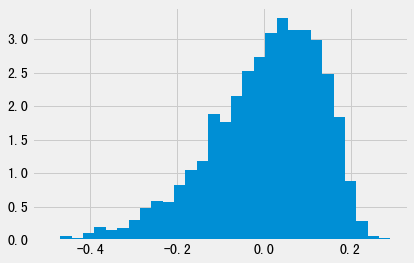

------LSTM-----6------2019-10-31-----
start date: 2013-05-31 . end date : 2019-07-31. the number of data: 162506
start date: 2019-08-30 . end date : 2019-09-30. the number of data: 6679
start date: 2019-10-31 . end date : 2019-10-31. the number of data: 3371
---LSTMModel init----
Epoch: 0
train loss 0.959136, train score -0.959136, valid loss 0.949679, valid score -0.949679
Epoch: 1
train loss 0.953388, train score -0.953388, valid loss 0.945368, valid score -0.945368
Epoch: 2
train loss 0.949718, train score -0.949718, valid loss 0.942606, valid score -0.942606
Epoch: 3
train loss 0.948320, train score -0.948320, valid loss 0.944012, valid score -0.944012
Epoch: 4
train loss 0.947023, train score -0.947023, valid loss 0.942391, valid score -0.942391
Epoch: 5
train loss 0.945402, train score -0.945402, valid loss 0.942925, valid score -0.942925
Epoch: 6
train loss 0.943548, train score -0.943548, valid loss 0.945877, valid score -0.945877
Epoch: 7
train loss 0.942703, train score -0.94

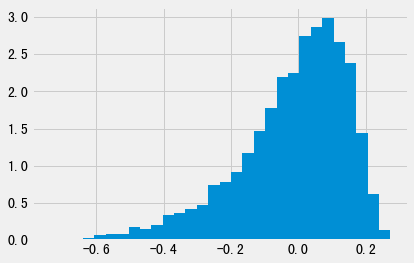

------LSTM-----6------2019-11-29-----
start date: 2013-06-28 . end date : 2019-08-30. the number of data: 163759
start date: 2019-09-30 . end date : 2019-10-31. the number of data: 6728
start date: 2019-11-29 . end date : 2019-11-29. the number of data: 3379
---LSTMModel init----
Epoch: 0
train loss 0.958588, train score -0.958588, valid loss 0.965641, valid score -0.965641
Epoch: 1
train loss 0.954135, train score -0.954135, valid loss 0.968255, valid score -0.968255
Epoch: 2
train loss 0.949851, train score -0.949851, valid loss 0.963198, valid score -0.963198
Epoch: 3
train loss 0.947641, train score -0.947641, valid loss 0.962467, valid score -0.962467
Epoch: 4
train loss 0.946163, train score -0.946163, valid loss 0.964351, valid score -0.964351
Epoch: 5
train loss 0.944276, train score -0.944276, valid loss 0.962275, valid score -0.962275
Epoch: 6
train loss 0.943882, train score -0.943882, valid loss 0.967507, valid score -0.967507
Epoch: 7
train loss 0.941796, train score -0.94

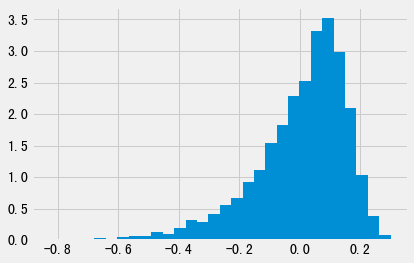

------LSTM-----6------2019-12-31-----
start date: 2013-07-31 . end date : 2019-09-30. the number of data: 165067
start date: 2019-10-31 . end date : 2019-11-29. the number of data: 6750
start date: 2019-12-31 . end date : 2019-12-31. the number of data: 3390
---LSTMModel init----
Epoch: 0
train loss 0.956764, train score -0.956764, valid loss 0.988544, valid score -0.988544
Epoch: 1
train loss 0.952208, train score -0.952208, valid loss 0.992831, valid score -0.992831
Epoch: 2
train loss 0.951993, train score -0.951993, valid loss 0.994514, valid score -0.994514
Epoch: 3
train loss 0.950130, train score -0.950130, valid loss 0.993944, valid score -0.993944
Epoch: 4
train loss 0.946762, train score -0.946762, valid loss 0.994314, valid score -0.994314
Epoch: 5
train loss 0.943995, train score -0.943995, valid loss 0.994865, valid score -0.994865
Epoch: 6
train loss 0.944141, train score -0.944141, valid loss 0.992098, valid score -0.992098
Epoch: 7
train loss 0.943342, train score -0.94

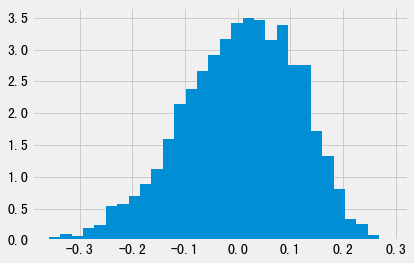

------LSTM-----6------2020-01-23-----
start date: 2013-08-30 . end date : 2019-10-31. the number of data: 166409
start date: 2019-11-29 . end date : 2019-12-31. the number of data: 6769
start date: 2020-01-23 . end date : 2020-01-23. the number of data: 3406
---LSTMModel init----
Epoch: 0
train loss 0.958434, train score -0.958434, valid loss 0.991798, valid score -0.991798
Epoch: 1
train loss 0.953147, train score -0.953147, valid loss 0.992390, valid score -0.992390
Epoch: 2
train loss 0.950990, train score -0.950990, valid loss 0.996322, valid score -0.996322
Epoch: 3
train loss 0.947434, train score -0.947434, valid loss 1.002591, valid score -1.002591
Epoch: 4
train loss 0.946764, train score -0.946764, valid loss 1.005758, valid score -1.005758
Epoch: 5
train loss 0.945342, train score -0.945342, valid loss 1.007780, valid score -1.007780
Epoch: 6
train loss 0.943335, train score -0.943335, valid loss 1.011873, valid score -1.011873
Epoch: 7
train loss 0.942830, train score -0.94

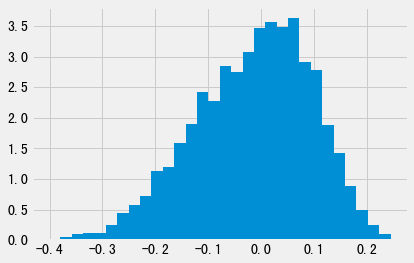

------LSTM-----6------2020-02-28-----
start date: 2013-09-30 . end date : 2019-11-29. the number of data: 167778
start date: 2019-12-31 . end date : 2020-01-23. the number of data: 6796
start date: 2020-02-28 . end date : 2020-02-28. the number of data: 3415
---LSTMModel init----
Epoch: 0
train loss 0.958456, train score -0.958456, valid loss 1.009491, valid score -1.009491
Epoch: 1
train loss 0.954003, train score -0.954003, valid loss 1.025586, valid score -1.025586
Epoch: 2
train loss 0.950676, train score -0.950676, valid loss 1.040961, valid score -1.040961
Epoch: 3
train loss 0.948585, train score -0.948585, valid loss 1.050116, valid score -1.050116
Epoch: 4
train loss 0.947097, train score -0.947097, valid loss 1.054610, valid score -1.054610
Epoch: 5
train loss 0.945591, train score -0.945591, valid loss 1.054175, valid score -1.054175
Epoch: 6
train loss 0.943945, train score -0.943945, valid loss 1.059261, valid score -1.059261
Epoch: 7
train loss 0.943010, train score -0.94

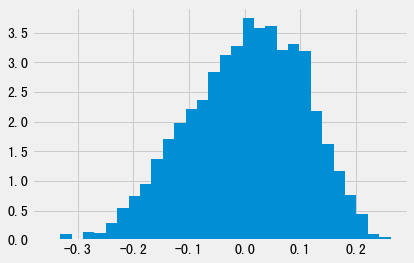

------LSTM-----6------2020-03-31-----
start date: 2013-10-31 . end date : 2019-12-31. the number of data: 169161
start date: 2020-01-23 . end date : 2020-02-28. the number of data: 6821
start date: 2020-03-31 . end date : 2020-03-31. the number of data: 3398
---LSTMModel init----
Epoch: 0
train loss 0.961404, train score -0.961404, valid loss 0.958461, valid score -0.958461
Epoch: 1
train loss 0.955772, train score -0.955772, valid loss 0.956280, valid score -0.956280
Epoch: 2
train loss 0.952516, train score -0.952516, valid loss 0.963414, valid score -0.963414
Epoch: 3
train loss 0.951013, train score -0.951013, valid loss 0.966123, valid score -0.966123
Epoch: 4
train loss 0.949809, train score -0.949809, valid loss 0.966512, valid score -0.966512
Epoch: 5
train loss 0.948272, train score -0.948272, valid loss 0.965099, valid score -0.965099
Epoch: 6
train loss 0.947119, train score -0.947119, valid loss 0.968437, valid score -0.968437
Epoch: 7
train loss 0.945681, train score -0.94

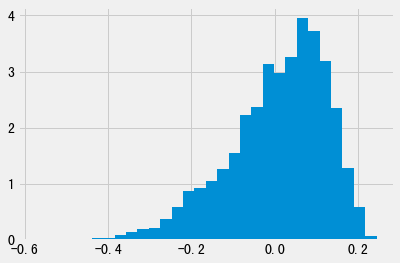

------LSTM-----6------2020-04-30-----
start date: 2013-11-29 . end date : 2020-01-23. the number of data: 170569
start date: 2020-02-28 . end date : 2020-03-31. the number of data: 6813
start date: 2020-04-30 . end date : 2020-04-30. the number of data: 3371
---LSTMModel init----
Epoch: 0
train loss 0.959007, train score -0.959007, valid loss 0.955105, valid score -0.955105
Epoch: 1
train loss 0.956783, train score -0.956783, valid loss 0.950096, valid score -0.950096
Epoch: 2
train loss 0.953516, train score -0.953516, valid loss 0.945890, valid score -0.945890
Epoch: 3
train loss 0.950505, train score -0.950505, valid loss 0.947079, valid score -0.947079
Epoch: 4
train loss 0.951638, train score -0.951638, valid loss 0.948842, valid score -0.948842
Epoch: 5
train loss 0.948963, train score -0.948963, valid loss 0.950598, valid score -0.950598
Epoch: 6
train loss 0.948356, train score -0.948356, valid loss 0.951216, valid score -0.951216
Epoch: 7
train loss 0.948600, train score -0.94

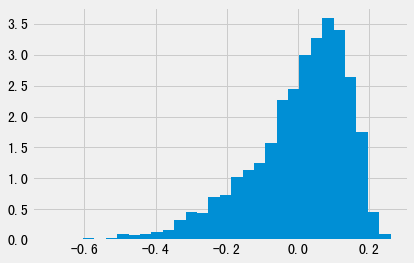

------LSTM-----6------2020-05-29-----
start date: 2013-12-31 . end date : 2020-02-28. the number of data: 172002
start date: 2020-03-31 . end date : 2020-04-30. the number of data: 6769
start date: 2020-05-29 . end date : 2020-05-29. the number of data: 3367
---LSTMModel init----
Epoch: 0
train loss 0.960506, train score -0.960506, valid loss 0.986035, valid score -0.986035
Epoch: 1
train loss 0.956699, train score -0.956699, valid loss 0.985519, valid score -0.985519
Epoch: 2
train loss 0.953467, train score -0.953467, valid loss 0.985912, valid score -0.985912
Epoch: 3
train loss 0.951389, train score -0.951389, valid loss 0.989625, valid score -0.989625
Epoch: 4
train loss 0.950999, train score -0.950999, valid loss 0.992212, valid score -0.992212
Epoch: 5
train loss 0.948767, train score -0.948767, valid loss 0.992066, valid score -0.992066
Epoch: 6
train loss 0.947514, train score -0.947514, valid loss 0.995716, valid score -0.995716
Epoch: 7
train loss 0.946072, train score -0.94

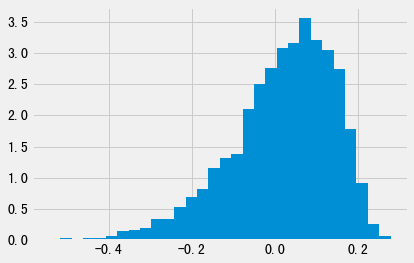

------LSTM-----6------2020-06-30-----
start date: 2014-01-30 . end date : 2020-03-31. the number of data: 173425
start date: 2020-04-30 . end date : 2020-05-29. the number of data: 6738
start date: 2020-06-30 . end date : 2020-06-30. the number of data: 3358
---LSTMModel init----
Epoch: 0
train loss 0.959838, train score -0.959838, valid loss 0.992785, valid score -0.992785
Epoch: 1
train loss 0.954909, train score -0.954909, valid loss 0.996584, valid score -0.996584
Epoch: 2
train loss 0.952475, train score -0.952475, valid loss 0.994773, valid score -0.994773
Epoch: 3
train loss 0.951030, train score -0.951030, valid loss 0.999031, valid score -0.999031
Epoch: 4
train loss 0.949959, train score -0.949959, valid loss 0.999269, valid score -0.999269
Epoch: 5
train loss 0.948520, train score -0.948520, valid loss 1.000907, valid score -1.000907
Epoch: 6
train loss 0.946707, train score -0.946707, valid loss 1.000917, valid score -1.000917
Epoch: 7
train loss 0.945237, train score -0.94

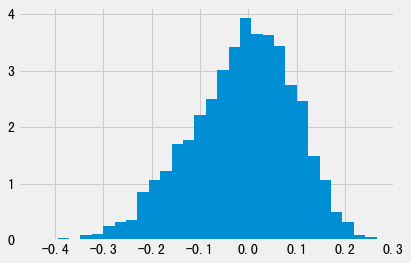

------LSTM-----6------2020-07-31-----
start date: 2014-02-28 . end date : 2020-04-30. the number of data: 174817
start date: 2020-05-29 . end date : 2020-06-30. the number of data: 6725
start date: 2020-07-31 . end date : 2020-07-31. the number of data: 3371
---LSTMModel init----
Epoch: 0
train loss 0.960408, train score -0.960408, valid loss 0.986276, valid score -0.986276
Epoch: 1
train loss 0.955920, train score -0.955920, valid loss 0.986614, valid score -0.986614
Epoch: 2
train loss 0.953994, train score -0.953994, valid loss 0.984831, valid score -0.984831
Epoch: 3
train loss 0.952847, train score -0.952847, valid loss 0.986814, valid score -0.986814
Epoch: 4
train loss 0.951038, train score -0.951038, valid loss 0.987827, valid score -0.987827
Epoch: 5
train loss 0.949950, train score -0.949950, valid loss 0.986023, valid score -0.986023
Epoch: 6
train loss 0.948782, train score -0.948782, valid loss 0.988061, valid score -0.988061
Epoch: 7
train loss 0.947010, train score -0.94

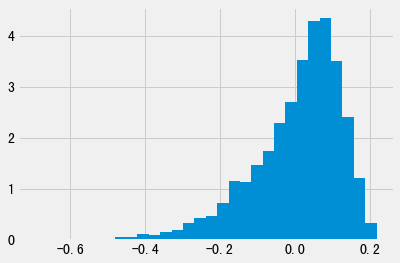

------LSTM-----12------2017-01-26-----
start date: 2011-02-28 . end date : 2016-10-31. the number of data: 96847
start date: 2016-11-30 . end date : 2016-12-30. the number of data: 3224
start date: 2017-01-26 . end date : 2017-01-26. the number of data: 1657
---LSTMModel init----
Epoch: 0
train loss 0.949726, train score -0.949726, valid loss 0.891358, valid score -0.891358
Epoch: 1
train loss 0.944931, train score -0.944931, valid loss 0.888854, valid score -0.888854
Epoch: 2
train loss 0.941248, train score -0.941248, valid loss 0.876916, valid score -0.876916
Epoch: 3
train loss 0.938736, train score -0.938736, valid loss 0.876173, valid score -0.876173
Epoch: 4
train loss 0.937393, train score -0.937393, valid loss 0.876380, valid score -0.876380
Epoch: 5
train loss 0.936455, train score -0.936455, valid loss 0.870142, valid score -0.870142
Epoch: 6
train loss 0.935515, train score -0.935515, valid loss 0.875605, valid score -0.875605
Epoch: 7
train loss 0.933209, train score -0.93

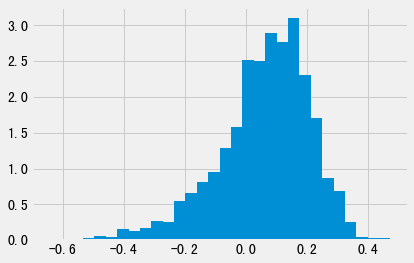

------LSTM-----12------2017-02-28-----
start date: 2011-03-31 . end date : 2016-11-30. the number of data: 97343
start date: 2016-12-30 . end date : 2017-01-26. the number of data: 3291
start date: 2017-02-28 . end date : 2017-02-28. the number of data: 1768
---LSTMModel init----
Epoch: 0
train loss 0.948059, train score -0.948059, valid loss 0.917716, valid score -0.917716
Epoch: 1
train loss 0.942598, train score -0.942598, valid loss 0.912466, valid score -0.912466
Epoch: 2
train loss 0.940368, train score -0.940368, valid loss 0.905713, valid score -0.905713
Epoch: 3
train loss 0.936580, train score -0.936580, valid loss 0.907272, valid score -0.907272
Epoch: 4
train loss 0.936610, train score -0.936610, valid loss 0.909699, valid score -0.909699
Epoch: 5
train loss 0.934089, train score -0.934089, valid loss 0.906169, valid score -0.906169
Epoch: 6
train loss 0.933081, train score -0.933081, valid loss 0.904826, valid score -0.904826
Epoch: 7
train loss 0.932666, train score -0.93

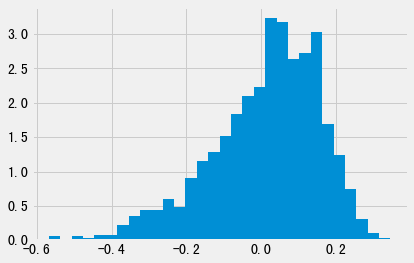

------LSTM-----12------2017-03-31-----
start date: 2011-04-29 . end date : 2016-12-30. the number of data: 97853
start date: 2017-01-26 . end date : 2017-02-28. the number of data: 3425
start date: 2017-03-31 . end date : 2017-03-31. the number of data: 1796
---LSTMModel init----
Epoch: 0
train loss 0.947707, train score -0.947707, valid loss 0.932612, valid score -0.932612
Epoch: 1
train loss 0.942913, train score -0.942913, valid loss 0.930552, valid score -0.930552
Epoch: 2
train loss 0.939057, train score -0.939057, valid loss 0.931267, valid score -0.931267
Epoch: 3
train loss 0.935985, train score -0.935985, valid loss 0.931665, valid score -0.931665
Epoch: 4
train loss 0.935483, train score -0.935483, valid loss 0.933048, valid score -0.933048
Epoch: 5
train loss 0.932892, train score -0.932892, valid loss 0.934787, valid score -0.934787
Epoch: 6
train loss 0.931781, train score -0.931781, valid loss 0.935972, valid score -0.935972
Epoch: 7
train loss 0.930110, train score -0.93

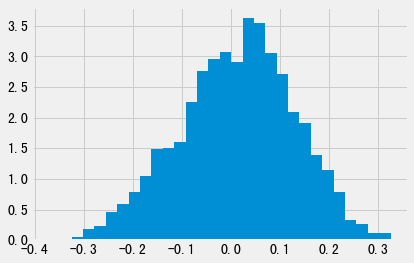

------LSTM-----12------2017-04-28-----
start date: 2011-05-31 . end date : 2017-01-26. the number of data: 98370
start date: 2017-02-28 . end date : 2017-03-31. the number of data: 3564
start date: 2017-04-28 . end date : 2017-04-28. the number of data: 1812
---LSTMModel init----
Epoch: 0
train loss 0.946609, train score -0.946609, valid loss 0.947852, valid score -0.947852
Epoch: 1
train loss 0.941724, train score -0.941724, valid loss 0.950210, valid score -0.950210
Epoch: 2
train loss 0.938436, train score -0.938436, valid loss 0.948151, valid score -0.948151
Epoch: 3
train loss 0.935865, train score -0.935865, valid loss 0.950361, valid score -0.950361
Epoch: 4
train loss 0.934145, train score -0.934145, valid loss 0.949933, valid score -0.949933
Epoch: 5
train loss 0.932796, train score -0.932796, valid loss 0.949080, valid score -0.949080
Epoch: 6
train loss 0.931492, train score -0.931492, valid loss 0.949863, valid score -0.949863
Epoch: 7
train loss 0.930111, train score -0.93

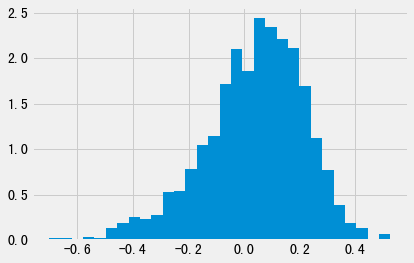

------LSTM-----12------2017-05-31-----
start date: 2011-06-30 . end date : 2017-02-28. the number of data: 98973
start date: 2017-03-31 . end date : 2017-04-28. the number of data: 3608
start date: 2017-05-31 . end date : 2017-05-31. the number of data: 1847
---LSTMModel init----
Epoch: 0
train loss 0.945226, train score -0.945226, valid loss 0.949848, valid score -0.949848
Epoch: 1
train loss 0.940679, train score -0.940679, valid loss 0.955371, valid score -0.955371
Epoch: 2
train loss 0.937444, train score -0.937444, valid loss 0.956030, valid score -0.956030
Epoch: 3
train loss 0.935325, train score -0.935325, valid loss 0.955659, valid score -0.955659
Epoch: 4
train loss 0.934057, train score -0.934057, valid loss 0.955092, valid score -0.955092
Epoch: 5
train loss 0.932332, train score -0.932332, valid loss 0.950273, valid score -0.950273
Epoch: 6
train loss 0.931566, train score -0.931566, valid loss 0.946604, valid score -0.946604
Epoch: 7
train loss 0.929551, train score -0.92

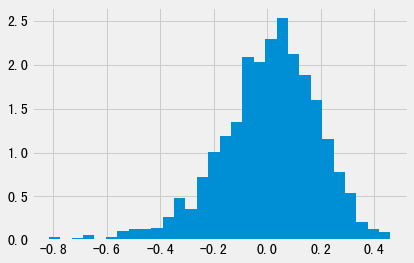

------LSTM-----12------2017-06-30-----
start date: 2011-07-29 . end date : 2017-03-31. the number of data: 99571
start date: 2017-04-28 . end date : 2017-05-31. the number of data: 3659
start date: 2017-06-30 . end date : 2017-06-30. the number of data: 1881
---LSTMModel init----
Epoch: 0
train loss 0.945253, train score -0.945253, valid loss 0.946348, valid score -0.946348
Epoch: 1
train loss 0.940039, train score -0.940039, valid loss 0.942425, valid score -0.942425
Epoch: 2
train loss 0.936711, train score -0.936711, valid loss 0.939347, valid score -0.939347
Epoch: 3
train loss 0.934568, train score -0.934568, valid loss 0.940780, valid score -0.940780
Epoch: 4
train loss 0.933418, train score -0.933418, valid loss 0.940063, valid score -0.940063
Epoch: 5
train loss 0.931507, train score -0.931507, valid loss 0.943141, valid score -0.943141
Epoch: 6
train loss 0.930366, train score -0.930366, valid loss 0.942140, valid score -0.942140
Epoch: 7
train loss 0.930072, train score -0.93

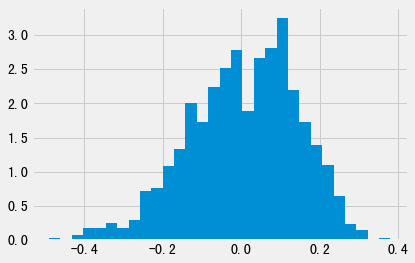

------LSTM-----12------2017-07-31-----
start date: 2011-08-31 . end date : 2017-04-28. the number of data: 100163
start date: 2017-05-31 . end date : 2017-06-30. the number of data: 3728
start date: 2017-07-31 . end date : 2017-07-31. the number of data: 1916
---LSTMModel init----
Epoch: 0
train loss 0.952799, train score -0.952799, valid loss 0.930827, valid score -0.930827
Epoch: 1
train loss 0.941195, train score -0.941195, valid loss 0.917471, valid score -0.917471
Epoch: 2
train loss 0.945161, train score -0.945161, valid loss 0.916849, valid score -0.916849
Epoch: 3
train loss 0.935900, train score -0.935900, valid loss 0.911615, valid score -0.911615
Epoch: 4
train loss 0.937820, train score -0.937820, valid loss 0.914805, valid score -0.914805
Epoch: 5
train loss 0.940137, train score -0.940137, valid loss 0.922194, valid score -0.922194
Epoch: 6
train loss 0.930858, train score -0.930858, valid loss 0.923203, valid score -0.923203
Epoch: 7
train loss 0.928802, train score -0.9

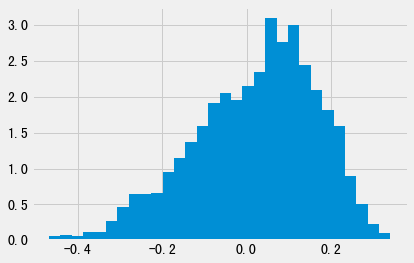

------LSTM-----12------2017-08-31-----
start date: 2011-09-30 . end date : 2017-05-31. the number of data: 100783
start date: 2017-06-30 . end date : 2017-07-31. the number of data: 3797
start date: 2017-08-31 . end date : 2017-08-31. the number of data: 1943
---LSTMModel init----
Epoch: 0
train loss 0.944813, train score -0.944813, valid loss 0.919061, valid score -0.919061
Epoch: 1
train loss 0.939756, train score -0.939756, valid loss 0.913720, valid score -0.913720
Epoch: 2
train loss 0.935559, train score -0.935559, valid loss 0.915755, valid score -0.915755
Epoch: 3
train loss 0.934403, train score -0.934403, valid loss 0.919593, valid score -0.919593
Epoch: 4
train loss 0.936284, train score -0.936284, valid loss 0.923145, valid score -0.923145
Epoch: 5
train loss 0.932802, train score -0.932802, valid loss 0.922248, valid score -0.922248
Epoch: 6
train loss 0.929412, train score -0.929412, valid loss 0.922849, valid score -0.922849
Epoch: 7
train loss 0.931859, train score -0.9

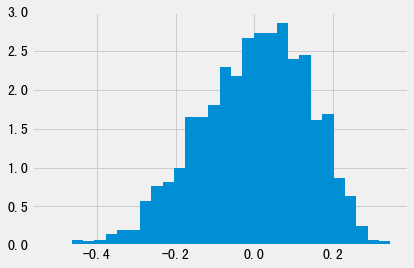

------LSTM-----12------2017-09-29-----
start date: 2011-10-31 . end date : 2017-06-30. the number of data: 101428
start date: 2017-07-31 . end date : 2017-08-31. the number of data: 3859
start date: 2017-09-29 . end date : 2017-09-29. the number of data: 1974
---LSTMModel init----
Epoch: 0
train loss 0.942323, train score -0.942323, valid loss 0.934548, valid score -0.934548
Epoch: 1
train loss 0.940667, train score -0.940667, valid loss 0.935043, valid score -0.935043
Epoch: 2
train loss 0.936946, train score -0.936946, valid loss 0.933050, valid score -0.933050
Epoch: 3
train loss 0.933446, train score -0.933446, valid loss 0.935425, valid score -0.935425
Epoch: 4
train loss 0.931479, train score -0.931479, valid loss 0.935919, valid score -0.935919
Epoch: 5
train loss 0.931774, train score -0.931774, valid loss 0.938593, valid score -0.938593
Epoch: 6
train loss 0.932408, train score -0.932408, valid loss 0.936111, valid score -0.936111
Epoch: 7
train loss 0.929406, train score -0.9

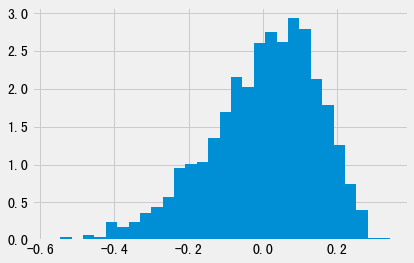

------LSTM-----12------2017-10-31-----
start date: 2011-11-30 . end date : 2017-07-31. the number of data: 102098
start date: 2017-08-31 . end date : 2017-09-29. the number of data: 3917
start date: 2017-10-31 . end date : 2017-10-31. the number of data: 1988
---LSTMModel init----
Epoch: 0
train loss 0.944961, train score -0.944961, valid loss 0.927361, valid score -0.927361
Epoch: 1
train loss 0.938918, train score -0.938918, valid loss 0.926013, valid score -0.926013
Epoch: 2
train loss 0.936891, train score -0.936891, valid loss 0.921754, valid score -0.921754
Epoch: 3
train loss 0.933602, train score -0.933602, valid loss 0.919837, valid score -0.919837
Epoch: 4
train loss 0.932406, train score -0.932406, valid loss 0.919088, valid score -0.919088
Epoch: 5
train loss 0.930859, train score -0.930859, valid loss 0.917716, valid score -0.917716
Epoch: 6
train loss 0.929233, train score -0.929233, valid loss 0.921207, valid score -0.921207
Epoch: 7
train loss 0.927548, train score -0.9

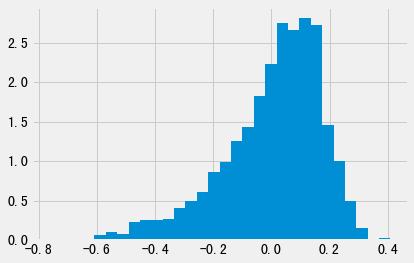

------LSTM-----12------2017-11-30-----
start date: 2011-12-30 . end date : 2017-08-31. the number of data: 102777
start date: 2017-09-29 . end date : 2017-10-31. the number of data: 3962
start date: 2017-11-30 . end date : 2017-11-30. the number of data: 2025
---LSTMModel init----
Epoch: 0
train loss 0.945247, train score -0.945247, valid loss 0.921978, valid score -0.921978
Epoch: 1
train loss 0.939705, train score -0.939705, valid loss 0.915104, valid score -0.915104
Epoch: 2
train loss 0.936832, train score -0.936832, valid loss 0.910635, valid score -0.910635
Epoch: 3
train loss 0.934193, train score -0.934193, valid loss 0.908996, valid score -0.908996
Epoch: 4
train loss 0.931959, train score -0.931959, valid loss 0.907141, valid score -0.907141
Epoch: 5
train loss 0.930298, train score -0.930298, valid loss 0.907176, valid score -0.907176
Epoch: 6
train loss 0.929450, train score -0.929450, valid loss 0.905706, valid score -0.905706
Epoch: 7
train loss 0.927652, train score -0.9

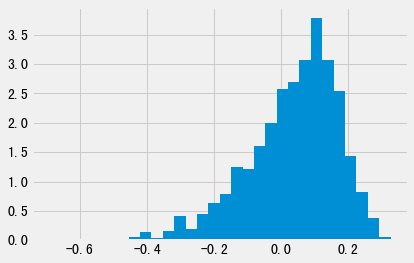

------LSTM-----12------2017-12-29-----
start date: 2012-01-31 . end date : 2017-09-29. the number of data: 103473
start date: 2017-10-31 . end date : 2017-11-30. the number of data: 4013
start date: 2017-12-29 . end date : 2017-12-29. the number of data: 2036
---LSTMModel init----
Epoch: 0
train loss 0.943763, train score -0.943763, valid loss 0.935627, valid score -0.935627
Epoch: 1
train loss 0.938016, train score -0.938016, valid loss 0.939759, valid score -0.939759
Epoch: 2
train loss 0.935296, train score -0.935296, valid loss 0.933523, valid score -0.933523
Epoch: 3
train loss 0.933124, train score -0.933124, valid loss 0.930539, valid score -0.930539
Epoch: 4
train loss 0.930839, train score -0.930839, valid loss 0.928240, valid score -0.928240
Epoch: 5
train loss 0.930052, train score -0.930052, valid loss 0.927784, valid score -0.927784
Epoch: 6
train loss 0.927866, train score -0.927866, valid loss 0.926858, valid score -0.926858
Epoch: 7
train loss 0.926655, train score -0.9

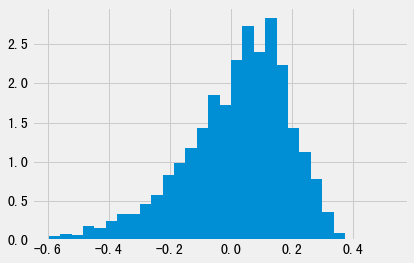

------LSTM-----12------2018-01-31-----
start date: 2012-02-29 . end date : 2017-10-31. the number of data: 104163
start date: 2017-11-30 . end date : 2017-12-29. the number of data: 4061
start date: 2018-01-31 . end date : 2018-01-31. the number of data: 2045
---LSTMModel init----
Epoch: 0
train loss 0.941531, train score -0.941531, valid loss 0.946869, valid score -0.946869
Epoch: 1
train loss 0.936238, train score -0.936238, valid loss 0.943333, valid score -0.943333
Epoch: 2
train loss 0.933143, train score -0.933143, valid loss 0.939612, valid score -0.939612
Epoch: 3
train loss 0.931547, train score -0.931547, valid loss 0.935906, valid score -0.935906
Epoch: 4
train loss 0.929528, train score -0.929528, valid loss 0.934327, valid score -0.934327
Epoch: 5
train loss 0.928067, train score -0.928067, valid loss 0.932363, valid score -0.932363
Epoch: 6
train loss 0.926367, train score -0.926367, valid loss 0.932409, valid score -0.932409
Epoch: 7
train loss 0.926014, train score -0.9

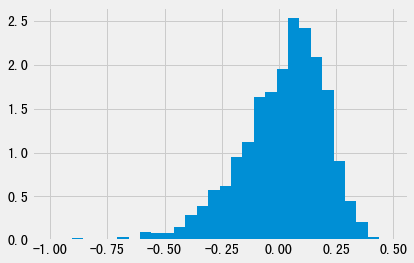

------LSTM-----12------2018-02-28-----
start date: 2012-03-30 . end date : 2017-11-30. the number of data: 104870
start date: 2017-12-29 . end date : 2018-01-31. the number of data: 4081
start date: 2018-02-28 . end date : 2018-02-28. the number of data: 2103
---LSTMModel init----
Epoch: 0
train loss 0.941791, train score -0.941791, valid loss 0.933498, valid score -0.933498
Epoch: 1
train loss 0.936984, train score -0.936984, valid loss 0.929211, valid score -0.929211
Epoch: 2
train loss 0.933599, train score -0.933599, valid loss 0.925988, valid score -0.925988
Epoch: 3
train loss 0.931258, train score -0.931258, valid loss 0.925132, valid score -0.925132
Epoch: 4
train loss 0.930316, train score -0.930316, valid loss 0.926211, valid score -0.926211
Epoch: 5
train loss 0.928820, train score -0.928820, valid loss 0.922085, valid score -0.922085
Epoch: 6
train loss 0.926471, train score -0.926471, valid loss 0.925921, valid score -0.925921
Epoch: 7
train loss 0.924729, train score -0.9

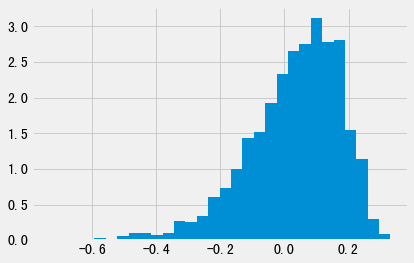

------LSTM-----12------2018-03-30-----
start date: 2012-04-27 . end date : 2017-12-29. the number of data: 105581
start date: 2018-01-31 . end date : 2018-02-28. the number of data: 4148
start date: 2018-03-30 . end date : 2018-03-30. the number of data: 2166
---LSTMModel init----
Epoch: 0
train loss 0.944962, train score -0.944962, valid loss 0.935465, valid score -0.935465
Epoch: 1
train loss 0.936249, train score -0.936249, valid loss 0.938395, valid score -0.938395
Epoch: 2
train loss 0.935598, train score -0.935598, valid loss 0.943677, valid score -0.943677
Epoch: 3
train loss 0.931753, train score -0.931753, valid loss 0.946030, valid score -0.946030
Epoch: 4
train loss 0.926540, train score -0.926540, valid loss 0.949814, valid score -0.949814
Epoch: 5
train loss 0.929290, train score -0.929290, valid loss 0.947953, valid score -0.947953
Epoch: 6
train loss 0.926868, train score -0.926868, valid loss 0.947427, valid score -0.947427
Epoch: 7
train loss 0.924554, train score -0.9

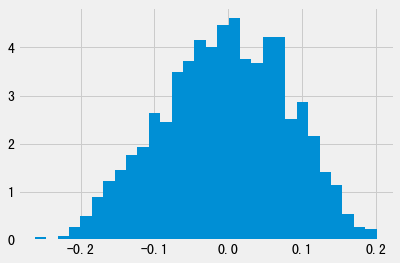

------LSTM-----12------2018-04-27-----
start date: 2012-05-31 . end date : 2018-01-31. the number of data: 106269
start date: 2018-02-28 . end date : 2018-03-30. the number of data: 4269
start date: 2018-04-27 . end date : 2018-04-27. the number of data: 2178
---LSTMModel init----
Epoch: 0
train loss 0.943789, train score -0.943789, valid loss 0.950799, valid score -0.950799
Epoch: 1
train loss 0.938769, train score -0.938769, valid loss 0.948674, valid score -0.948674
Epoch: 2
train loss 0.934278, train score -0.934278, valid loss 0.947507, valid score -0.947507
Epoch: 3
train loss 0.931186, train score -0.931186, valid loss 0.949780, valid score -0.949780
Epoch: 4
train loss 0.929904, train score -0.929904, valid loss 0.948782, valid score -0.948782
Epoch: 5
train loss 0.926658, train score -0.926658, valid loss 0.951774, valid score -0.951774
Epoch: 6
train loss 0.925896, train score -0.925896, valid loss 0.950233, valid score -0.950233
Epoch: 7
train loss 0.925888, train score -0.9

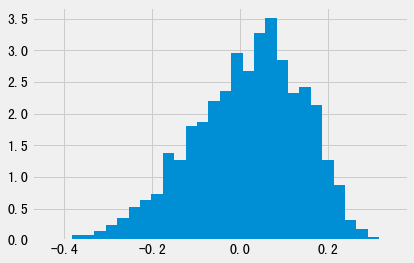

------LSTM-----12------2018-05-31-----
start date: 2012-06-29 . end date : 2018-02-28. the number of data: 107018
start date: 2018-03-30 . end date : 2018-04-27. the number of data: 4344
start date: 2018-05-31 . end date : 2018-05-31. the number of data: 2228
---LSTMModel init----
Epoch: 0
train loss 0.943099, train score -0.943099, valid loss 0.949403, valid score -0.949403
Epoch: 1
train loss 0.938119, train score -0.938119, valid loss 0.944522, valid score -0.944522
Epoch: 2
train loss 0.934865, train score -0.934865, valid loss 0.941451, valid score -0.941451
Epoch: 3
train loss 0.931928, train score -0.931928, valid loss 0.942336, valid score -0.942336
Epoch: 4
train loss 0.931104, train score -0.931104, valid loss 0.942533, valid score -0.942533
Epoch: 5
train loss 0.927824, train score -0.927824, valid loss 0.940664, valid score -0.940664
Epoch: 6
train loss 0.926220, train score -0.926220, valid loss 0.942334, valid score -0.942334
Epoch: 7
train loss 0.925739, train score -0.9

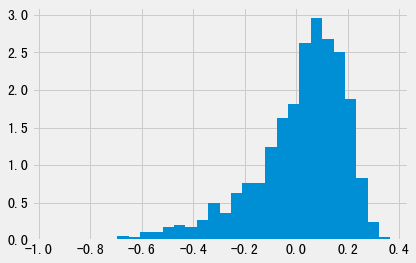

------LSTM-----12------2018-06-29-----
start date: 2012-07-31 . end date : 2018-03-30. the number of data: 107782
start date: 2018-04-27 . end date : 2018-05-31. the number of data: 4406
start date: 2018-06-29 . end date : 2018-06-29. the number of data: 2305
---LSTMModel init----
Epoch: 0
train loss 0.942666, train score -0.942666, valid loss 0.953590, valid score -0.953590
Epoch: 1
train loss 0.938242, train score -0.938242, valid loss 0.954712, valid score -0.954712
Epoch: 2
train loss 0.933839, train score -0.933839, valid loss 0.952395, valid score -0.952395
Epoch: 3
train loss 0.932077, train score -0.932077, valid loss 0.953479, valid score -0.953479
Epoch: 4
train loss 0.930550, train score -0.930550, valid loss 0.953776, valid score -0.953776
Epoch: 5
train loss 0.929700, train score -0.929700, valid loss 0.953246, valid score -0.953246
Epoch: 6
train loss 0.927015, train score -0.927015, valid loss 0.951050, valid score -0.951050
Epoch: 7
train loss 0.925655, train score -0.9

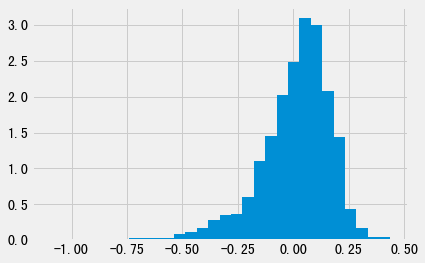

------LSTM-----12------2018-07-31-----
start date: 2012-08-31 . end date : 2018-04-27. the number of data: 108519
start date: 2018-05-31 . end date : 2018-06-29. the number of data: 4533
start date: 2018-07-31 . end date : 2018-07-31. the number of data: 2380
---LSTMModel init----
Epoch: 0
train loss 0.941849, train score -0.941849, valid loss 0.929774, valid score -0.929774
Epoch: 1
train loss 0.937377, train score -0.937377, valid loss 0.926008, valid score -0.926008
Epoch: 2
train loss 0.933707, train score -0.933707, valid loss 0.925295, valid score -0.925295
Epoch: 3
train loss 0.931421, train score -0.931421, valid loss 0.925242, valid score -0.925242
Epoch: 4
train loss 0.930009, train score -0.930009, valid loss 0.926457, valid score -0.926457
Epoch: 5
train loss 0.928494, train score -0.928494, valid loss 0.930956, valid score -0.930956
Epoch: 6
train loss 0.927180, train score -0.927180, valid loss 0.929354, valid score -0.929354
Epoch: 7
train loss 0.924693, train score -0.9

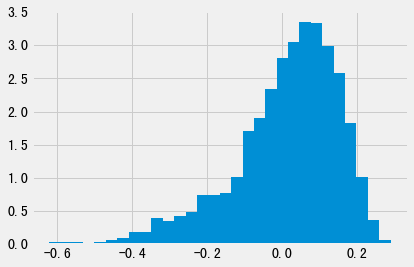

------LSTM-----12------2018-08-31-----
start date: 2012-09-28 . end date : 2018-05-31. the number of data: 109264
start date: 2018-06-29 . end date : 2018-07-31. the number of data: 4685
start date: 2018-08-31 . end date : 2018-08-31. the number of data: 2449
---LSTMModel init----
Epoch: 0
train loss 0.943853, train score -0.943853, valid loss 0.904520, valid score -0.904520
Epoch: 1
train loss 0.939539, train score -0.939539, valid loss 0.908648, valid score -0.908648
Epoch: 2
train loss 0.935000, train score -0.935000, valid loss 0.903364, valid score -0.903364
Epoch: 3
train loss 0.932427, train score -0.932427, valid loss 0.905126, valid score -0.905126
Epoch: 4
train loss 0.930709, train score -0.930709, valid loss 0.906738, valid score -0.906738
Epoch: 5
train loss 0.929021, train score -0.929021, valid loss 0.910689, valid score -0.910689
Epoch: 6
train loss 0.927530, train score -0.927530, valid loss 0.912489, valid score -0.912489
Epoch: 7
train loss 0.926046, train score -0.9

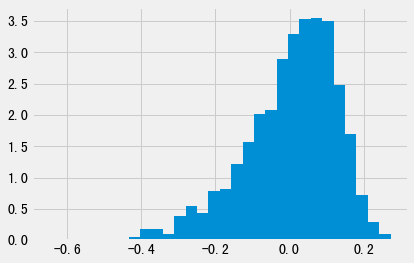

------LSTM-----12------2018-09-28-----
start date: 2012-10-31 . end date : 2018-06-29. the number of data: 110052
start date: 2018-07-31 . end date : 2018-08-31. the number of data: 4829
start date: 2018-09-28 . end date : 2018-09-28. the number of data: 2502
---LSTMModel init----
Epoch: 0
train loss 0.941976, train score -0.941976, valid loss 0.914447, valid score -0.914447
Epoch: 1
train loss 0.932489, train score -0.932489, valid loss 0.915087, valid score -0.915087
Epoch: 2
train loss 0.934997, train score -0.934997, valid loss 0.921778, valid score -0.921778
Epoch: 3
train loss 0.928846, train score -0.928846, valid loss 0.918397, valid score -0.918397
Epoch: 4
train loss 0.934089, train score -0.934089, valid loss 0.916773, valid score -0.916773
Epoch: 5
train loss 0.931804, train score -0.931804, valid loss 0.912725, valid score -0.912725
Epoch: 6
train loss 0.943922, train score -0.943922, valid loss 0.917919, valid score -0.917919
Epoch: 7
train loss 0.938137, train score -0.9

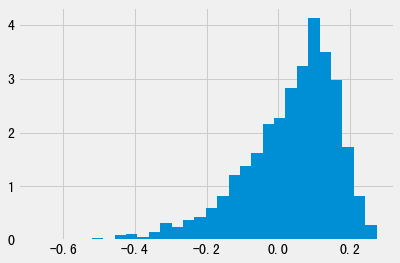

------LSTM-----12------2018-10-31-----
start date: 2012-11-30 . end date : 2018-07-31. the number of data: 110881
start date: 2018-08-31 . end date : 2018-09-28. the number of data: 4951
start date: 2018-10-31 . end date : 2018-10-31. the number of data: 2566
---LSTMModel init----
Epoch: 0
train loss 0.940323, train score -0.940323, valid loss 0.938115, valid score -0.938115
Epoch: 1
train loss 0.935739, train score -0.935739, valid loss 0.939153, valid score -0.939153
Epoch: 2
train loss 0.933696, train score -0.933696, valid loss 0.937855, valid score -0.937855
Epoch: 3
train loss 0.932167, train score -0.932167, valid loss 0.936088, valid score -0.936088
Epoch: 4
train loss 0.928953, train score -0.928953, valid loss 0.934183, valid score -0.934183
Epoch: 5
train loss 0.927543, train score -0.927543, valid loss 0.935085, valid score -0.935085
Epoch: 6
train loss 0.924748, train score -0.924748, valid loss 0.930416, valid score -0.930416
Epoch: 7
train loss 0.922342, train score -0.9

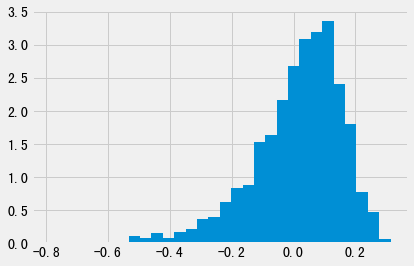

------LSTM-----12------2018-11-30-----
start date: 2012-12-31 . end date : 2018-08-31. the number of data: 111741
start date: 2018-09-28 . end date : 2018-10-31. the number of data: 5068
start date: 2018-11-30 . end date : 2018-11-30. the number of data: 2646
---LSTMModel init----
Epoch: 0
train loss 0.939677, train score -0.939677, valid loss 0.963282, valid score -0.963282
Epoch: 1
train loss 0.936172, train score -0.936172, valid loss 0.960413, valid score -0.960413
Epoch: 2
train loss 0.931852, train score -0.931852, valid loss 0.962525, valid score -0.962525
Epoch: 3
train loss 0.929172, train score -0.929172, valid loss 0.961222, valid score -0.961222
Epoch: 4
train loss 0.927836, train score -0.927836, valid loss 0.957182, valid score -0.957182
Epoch: 5
train loss 0.925491, train score -0.925491, valid loss 0.958046, valid score -0.958046
Epoch: 6
train loss 0.923521, train score -0.923521, valid loss 0.958096, valid score -0.958096
Epoch: 7
train loss 0.924174, train score -0.9

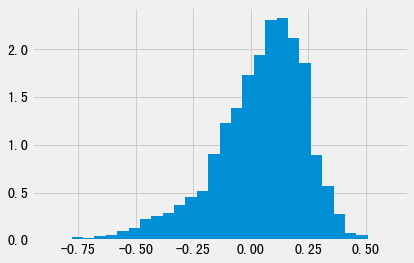

------LSTM-----12------2018-12-28-----
start date: 2013-01-31 . end date : 2018-09-28. the number of data: 112624
start date: 2018-10-31 . end date : 2018-11-30. the number of data: 5212
start date: 2018-12-28 . end date : 2018-12-28. the number of data: 2715
---LSTMModel init----
Epoch: 0
train loss 0.940741, train score -0.940741, valid loss 0.955971, valid score -0.955971
Epoch: 1
train loss 0.935080, train score -0.935080, valid loss 0.949895, valid score -0.949895
Epoch: 2
train loss 0.932225, train score -0.932225, valid loss 0.947592, valid score -0.947592
Epoch: 3
train loss 0.930016, train score -0.930016, valid loss 0.949366, valid score -0.949366
Epoch: 4
train loss 0.928030, train score -0.928030, valid loss 0.961226, valid score -0.961226
Epoch: 5
train loss 0.927987, train score -0.927987, valid loss 0.972195, valid score -0.972195
Epoch: 6
train loss 0.925093, train score -0.925093, valid loss 0.958735, valid score -0.958735
Epoch: 7
train loss 0.922853, train score -0.9

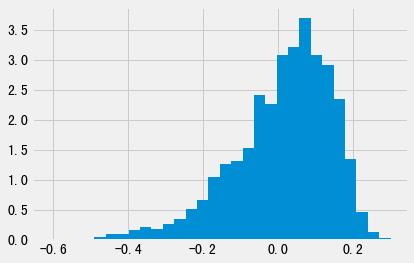

------LSTM-----12------2019-01-31-----
start date: 2013-02-28 . end date : 2018-10-31. the number of data: 113544
start date: 2018-11-30 . end date : 2018-12-28. the number of data: 5361
start date: 2019-01-31 . end date : 2019-01-31. the number of data: 2782
---LSTMModel init----
Epoch: 0
train loss 0.938871, train score -0.938871, valid loss 0.970474, valid score -0.970474
Epoch: 1
train loss 0.934501, train score -0.934501, valid loss 0.958491, valid score -0.958491
Epoch: 2
train loss 0.931202, train score -0.931202, valid loss 0.951047, valid score -0.951047
Epoch: 3
train loss 0.928349, train score -0.928349, valid loss 0.951101, valid score -0.951101
Epoch: 4
train loss 0.926288, train score -0.926288, valid loss 0.955153, valid score -0.955153
Epoch: 5
train loss 0.924277, train score -0.924277, valid loss 0.956410, valid score -0.956410
Epoch: 6
train loss 0.922976, train score -0.922976, valid loss 0.961191, valid score -0.961191
Epoch: 7
train loss 0.921394, train score -0.9

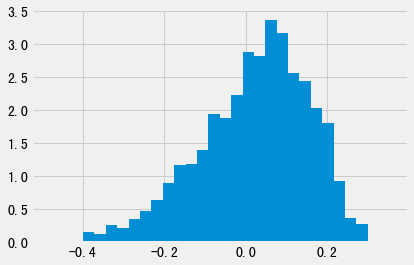

------LSTM-----12------2019-02-28-----
start date: 2013-03-29 . end date : 2018-11-30. the number of data: 114527
start date: 2018-12-28 . end date : 2019-01-31. the number of data: 5497
start date: 2019-02-28 . end date : 2019-02-28. the number of data: 2848
---LSTMModel init----
Epoch: 0
train loss 0.939212, train score -0.939212, valid loss 1.012580, valid score -1.012580
Epoch: 1
train loss 0.933994, train score -0.933994, valid loss 1.025587, valid score -1.025587
Epoch: 2
train loss 0.930670, train score -0.930670, valid loss 1.025936, valid score -1.025936
Epoch: 3
train loss 0.927817, train score -0.927817, valid loss 1.020990, valid score -1.020990
Epoch: 4
train loss 0.926957, train score -0.926957, valid loss 1.026060, valid score -1.026060
Epoch: 5
train loss 0.924423, train score -0.924423, valid loss 1.012533, valid score -1.012533
Epoch: 6
train loss 0.922889, train score -0.922889, valid loss 1.011314, valid score -1.011314
Epoch: 7
train loss 0.922284, train score -0.9

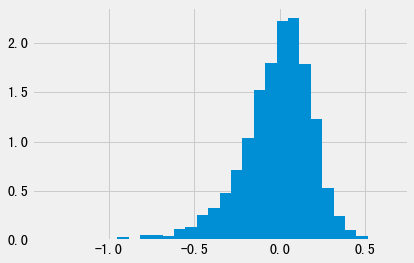

------LSTM-----12------2019-03-29-----
start date: 2013-04-26 . end date : 2018-12-28. the number of data: 115544
start date: 2019-01-31 . end date : 2019-02-28. the number of data: 5630
start date: 2019-03-29 . end date : 2019-03-29. the number of data: 2893
---LSTMModel init----
Epoch: 0
train loss 0.940174, train score -0.940174, valid loss 0.978739, valid score -0.978739
Epoch: 1
train loss 0.934378, train score -0.934378, valid loss 0.991334, valid score -0.991334
Epoch: 2
train loss 0.929472, train score -0.929472, valid loss 0.999173, valid score -0.999173
Epoch: 3
train loss 0.928498, train score -0.928498, valid loss 1.001475, valid score -1.001475
Epoch: 4
train loss 0.926910, train score -0.926910, valid loss 1.004816, valid score -1.004816
Epoch: 5
train loss 0.923787, train score -0.923787, valid loss 1.003929, valid score -1.003929
Epoch: 6
train loss 0.924678, train score -0.924678, valid loss 1.003734, valid score -1.003734
Epoch: 7
train loss 0.922790, train score -0.9

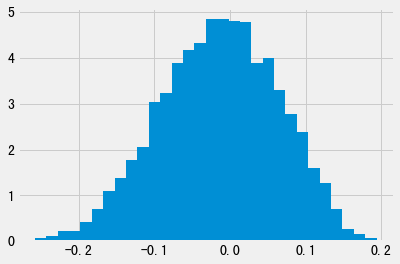

------LSTM-----12------2019-04-30-----
start date: 2013-05-31 . end date : 2019-01-31. the number of data: 116573
start date: 2019-02-28 . end date : 2019-03-29. the number of data: 5741
start date: 2019-04-30 . end date : 2019-04-30. the number of data: 2965
---LSTMModel init----
Epoch: 0
train loss 0.938123, train score -0.938123, valid loss 0.938490, valid score -0.938490
Epoch: 1
train loss 0.934042, train score -0.934042, valid loss 0.932893, valid score -0.932893
Epoch: 2
train loss 0.930729, train score -0.930729, valid loss 0.928571, valid score -0.928571
Epoch: 3
train loss 0.929086, train score -0.929086, valid loss 0.922822, valid score -0.922822
Epoch: 4
train loss 0.926371, train score -0.926371, valid loss 0.924179, valid score -0.924179
Epoch: 5
train loss 0.924364, train score -0.924364, valid loss 0.926350, valid score -0.926350
Epoch: 6
train loss 0.923610, train score -0.923610, valid loss 0.922300, valid score -0.922300
Epoch: 7
train loss 0.922346, train score -0.9

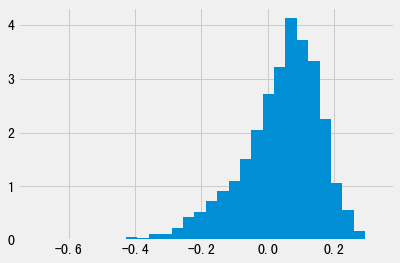

------LSTM-----12------2019-05-31-----
start date: 2013-06-28 . end date : 2019-02-28. the number of data: 117608
start date: 2019-03-29 . end date : 2019-04-30. the number of data: 5858
start date: 2019-05-31 . end date : 2019-05-31. the number of data: 3026
---LSTMModel init----
Epoch: 0
train loss 0.938576, train score -0.938576, valid loss 0.937154, valid score -0.937154
Epoch: 1
train loss 0.935427, train score -0.935427, valid loss 0.933587, valid score -0.933587
Epoch: 2
train loss 0.931757, train score -0.931757, valid loss 0.936686, valid score -0.936686
Epoch: 3
train loss 0.929818, train score -0.929818, valid loss 0.940344, valid score -0.940344
Epoch: 4
train loss 0.928003, train score -0.928003, valid loss 0.940293, valid score -0.940293
Epoch: 5
train loss 0.925939, train score -0.925939, valid loss 0.942138, valid score -0.942138
Epoch: 6
train loss 0.924131, train score -0.924131, valid loss 0.946109, valid score -0.946109
Epoch: 7
train loss 0.921999, train score -0.9

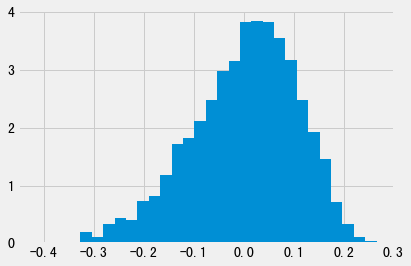

------LSTM-----12------2019-06-28-----
start date: 2013-07-31 . end date : 2019-03-29. the number of data: 118655
start date: 2019-04-30 . end date : 2019-05-31. the number of data: 5991
start date: 2019-06-28 . end date : 2019-06-28. the number of data: 3088
---LSTMModel init----
Epoch: 0
train loss 0.938242, train score -0.938242, valid loss 0.930790, valid score -0.930790
Epoch: 1
train loss 0.932878, train score -0.932878, valid loss 0.921972, valid score -0.921972
Epoch: 2
train loss 0.929480, train score -0.929480, valid loss 0.922224, valid score -0.922224
Epoch: 3
train loss 0.926838, train score -0.926838, valid loss 0.918229, valid score -0.918229
Epoch: 4
train loss 0.925156, train score -0.925156, valid loss 0.921133, valid score -0.921133
Epoch: 5
train loss 0.923826, train score -0.923826, valid loss 0.918651, valid score -0.918651
Epoch: 6
train loss 0.921946, train score -0.921946, valid loss 0.919371, valid score -0.919371
Epoch: 7
train loss 0.920068, train score -0.9

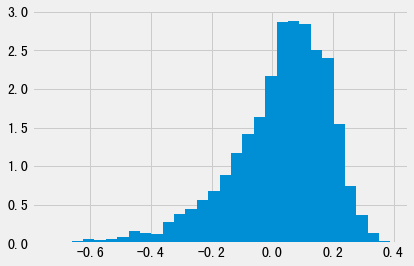

------LSTM-----12------2019-07-31-----
start date: 2013-08-30 . end date : 2019-04-30. the number of data: 119766
start date: 2019-05-31 . end date : 2019-06-28. the number of data: 6114
start date: 2019-07-31 . end date : 2019-07-31. the number of data: 3128
---LSTMModel init----
Epoch: 0
train loss 0.940063, train score -0.940063, valid loss 0.908171, valid score -0.908171
Epoch: 1
train loss 0.934607, train score -0.934607, valid loss 0.894203, valid score -0.894203
Epoch: 2
train loss 0.930780, train score -0.930780, valid loss 0.892211, valid score -0.892211
Epoch: 3
train loss 0.928382, train score -0.928382, valid loss 0.890357, valid score -0.890357
Epoch: 4
train loss 0.926961, train score -0.926961, valid loss 0.894808, valid score -0.894808
Epoch: 5
train loss 0.925671, train score -0.925671, valid loss 0.894644, valid score -0.894644
Epoch: 6
train loss 0.924005, train score -0.924005, valid loss 0.895216, valid score -0.895216
Epoch: 7
train loss 0.922554, train score -0.9

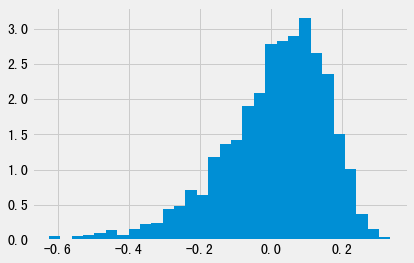

------LSTM-----12------2019-08-30-----
start date: 2013-09-30 . end date : 2019-05-31. the number of data: 120944
start date: 2019-06-28 . end date : 2019-07-31. the number of data: 6216
start date: 2019-08-30 . end date : 2019-08-30. the number of data: 3160
---LSTMModel init----
Epoch: 0
train loss 0.938298, train score -0.938298, valid loss 0.983102, valid score -0.983102
Epoch: 1
train loss 0.932280, train score -0.932280, valid loss 0.986198, valid score -0.986198
Epoch: 2
train loss 0.928871, train score -0.928871, valid loss 0.990904, valid score -0.990904
Epoch: 3
train loss 0.927865, train score -0.927865, valid loss 0.988058, valid score -0.988058
Epoch: 4
train loss 0.925274, train score -0.925274, valid loss 0.991716, valid score -0.991716
Epoch: 5
train loss 0.923883, train score -0.923883, valid loss 0.991245, valid score -0.991245
Epoch: 6
train loss 0.923814, train score -0.923814, valid loss 0.987073, valid score -0.987073
Epoch: 7
train loss 0.921625, train score -0.9

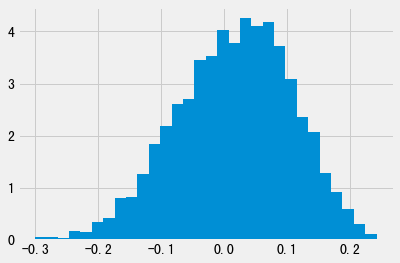

------LSTM-----12------2019-09-30-----
start date: 2013-10-31 . end date : 2019-06-28. the number of data: 122184
start date: 2019-07-31 . end date : 2019-08-30. the number of data: 6288
start date: 2019-09-30 . end date : 2019-09-30. the number of data: 3191
---LSTMModel init----
Epoch: 0
train loss 0.940003, train score -0.940003, valid loss 0.949732, valid score -0.949732
Epoch: 1
train loss 0.934766, train score -0.934766, valid loss 0.948118, valid score -0.948118
Epoch: 2
train loss 0.931104, train score -0.931104, valid loss 0.948310, valid score -0.948310
Epoch: 3
train loss 0.927827, train score -0.927827, valid loss 0.952491, valid score -0.952491
Epoch: 4
train loss 0.926641, train score -0.926641, valid loss 0.956150, valid score -0.956150
Epoch: 5
train loss 0.925938, train score -0.925938, valid loss 0.953452, valid score -0.953452
Epoch: 6
train loss 0.923650, train score -0.923650, valid loss 0.956259, valid score -0.956259
Epoch: 7
train loss 0.921798, train score -0.9

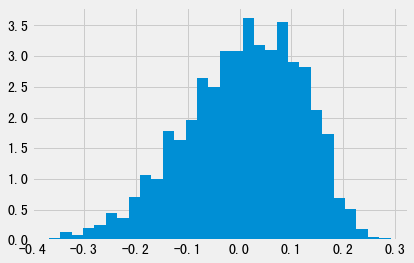

------LSTM-----12------2019-10-31-----
start date: 2013-11-29 . end date : 2019-07-31. the number of data: 123484
start date: 2019-08-30 . end date : 2019-09-30. the number of data: 6351
start date: 2019-10-31 . end date : 2019-10-31. the number of data: 3240
---LSTMModel init----
Epoch: 0
train loss 0.938683, train score -0.938683, valid loss 0.923682, valid score -0.923682
Epoch: 1
train loss 0.934527, train score -0.934527, valid loss 0.919749, valid score -0.919749
Epoch: 2
train loss 0.931851, train score -0.931851, valid loss 0.917868, valid score -0.917868
Epoch: 3
train loss 0.930064, train score -0.930064, valid loss 0.919247, valid score -0.919247
Epoch: 4
train loss 0.927397, train score -0.927397, valid loss 0.915761, valid score -0.915761
Epoch: 5
train loss 0.925953, train score -0.925953, valid loss 0.918736, valid score -0.918736
Epoch: 6
train loss 0.924490, train score -0.924490, valid loss 0.917728, valid score -0.917728
Epoch: 7
train loss 0.922270, train score -0.9

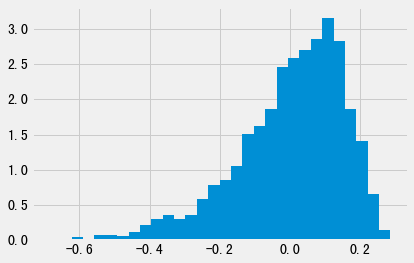

------LSTM-----12------2019-11-29-----
start date: 2013-12-31 . end date : 2019-08-30. the number of data: 124825
start date: 2019-09-30 . end date : 2019-10-31. the number of data: 6431
start date: 2019-11-29 . end date : 2019-11-29. the number of data: 3254
---LSTMModel init----
Epoch: 0
train loss 0.940752, train score -0.940752, valid loss 0.943956, valid score -0.943956
Epoch: 1
train loss 0.935812, train score -0.935812, valid loss 0.946484, valid score -0.946484
Epoch: 2
train loss 0.932437, train score -0.932437, valid loss 0.942542, valid score -0.942542
Epoch: 3
train loss 0.930103, train score -0.930103, valid loss 0.939122, valid score -0.939122
Epoch: 4
train loss 0.928549, train score -0.928549, valid loss 0.943406, valid score -0.943406
Epoch: 5
train loss 0.927364, train score -0.927364, valid loss 0.941093, valid score -0.941093
Epoch: 6
train loss 0.925467, train score -0.925467, valid loss 0.940905, valid score -0.940905
Epoch: 7
train loss 0.923745, train score -0.9

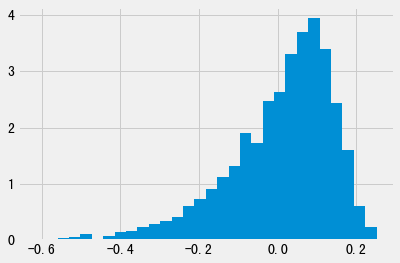

------LSTM-----12------2019-12-31-----
start date: 2014-01-30 . end date : 2019-09-30. the number of data: 126205
start date: 2019-10-31 . end date : 2019-11-29. the number of data: 6494
start date: 2019-12-31 . end date : 2019-12-31. the number of data: 3262
---LSTMModel init----
Epoch: 0
train loss 0.941117, train score -0.941117, valid loss 0.979673, valid score -0.979673
Epoch: 1
train loss 0.935095, train score -0.935095, valid loss 0.984645, valid score -0.984645
Epoch: 2
train loss 0.932109, train score -0.932109, valid loss 0.985021, valid score -0.985021
Epoch: 3
train loss 0.929376, train score -0.929376, valid loss 0.986736, valid score -0.986736
Epoch: 4
train loss 0.928184, train score -0.928184, valid loss 0.984132, valid score -0.984132
Epoch: 5
train loss 0.926409, train score -0.926409, valid loss 0.991622, valid score -0.991622
Epoch: 6
train loss 0.924317, train score -0.924317, valid loss 0.991019, valid score -0.991019
Epoch: 7
train loss 0.924028, train score -0.9

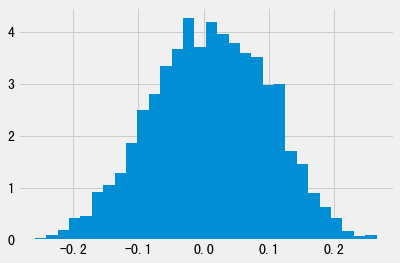

------LSTM-----12------2020-01-23-----
start date: 2014-02-28 . end date : 2019-10-31. the number of data: 127648
start date: 2019-11-29 . end date : 2019-12-31. the number of data: 6516
start date: 2020-01-23 . end date : 2020-01-23. the number of data: 3274
---LSTMModel init----
Epoch: 0
train loss 0.940670, train score -0.940670, valid loss 0.983548, valid score -0.983548
Epoch: 1
train loss 0.936016, train score -0.936016, valid loss 0.981315, valid score -0.981315
Epoch: 2
train loss 0.932338, train score -0.932338, valid loss 0.984134, valid score -0.984134
Epoch: 3
train loss 0.929942, train score -0.929942, valid loss 0.989720, valid score -0.989720
Epoch: 4
train loss 0.928153, train score -0.928153, valid loss 0.998484, valid score -0.998484
Epoch: 5
train loss 0.927203, train score -0.927203, valid loss 1.001714, valid score -1.001714
Epoch: 6
train loss 0.925562, train score -0.925562, valid loss 1.012071, valid score -1.012071
Epoch: 7
train loss 0.924459, train score -0.9

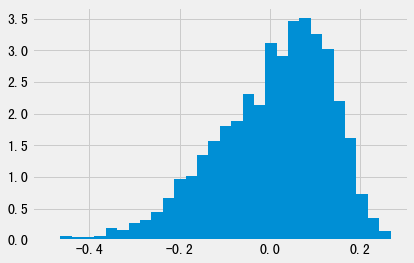

------LSTM-----12------2020-02-28-----
start date: 2014-03-31 . end date : 2019-11-29. the number of data: 129158
start date: 2019-12-31 . end date : 2020-01-23. the number of data: 6536
start date: 2020-02-28 . end date : 2020-02-28. the number of data: 3285
---LSTMModel init----
Epoch: 0
train loss 0.942981, train score -0.942981, valid loss 0.998442, valid score -0.998442
Epoch: 1
train loss 0.938890, train score -0.938890, valid loss 1.007866, valid score -1.007866
Epoch: 2
train loss 0.935067, train score -0.935067, valid loss 1.019625, valid score -1.019625
Epoch: 3
train loss 0.933352, train score -0.933352, valid loss 1.031598, valid score -1.031598
Epoch: 4
train loss 0.931784, train score -0.931784, valid loss 1.033730, valid score -1.033730
Epoch: 5
train loss 0.929759, train score -0.929759, valid loss 1.038521, valid score -1.038521
Epoch: 6
train loss 0.928715, train score -0.928715, valid loss 1.043454, valid score -1.043454
Epoch: 7
train loss 0.926818, train score -0.9

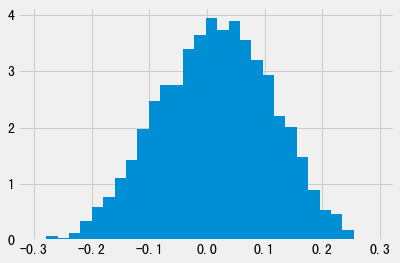

------LSTM-----12------2020-03-31-----
start date: 2014-04-30 . end date : 2019-12-31. the number of data: 130709
start date: 2020-01-23 . end date : 2020-02-28. the number of data: 6559
start date: 2020-03-31 . end date : 2020-03-31. the number of data: 3296
---LSTMModel init----
Epoch: 0
train loss 0.945347, train score -0.945347, valid loss 0.939762, valid score -0.939762
Epoch: 1
train loss 0.941104, train score -0.941104, valid loss 0.939520, valid score -0.939520
Epoch: 2
train loss 0.935859, train score -0.935859, valid loss 0.946335, valid score -0.946335
Epoch: 3
train loss 0.931929, train score -0.931929, valid loss 0.947994, valid score -0.947994
Epoch: 4
train loss 0.935432, train score -0.935432, valid loss 0.946811, valid score -0.946811
Epoch: 5
train loss 0.932698, train score -0.932698, valid loss 0.950996, valid score -0.950996
Epoch: 6
train loss 0.931719, train score -0.931719, valid loss 0.947581, valid score -0.947581
Epoch: 7
train loss 0.928931, train score -0.9

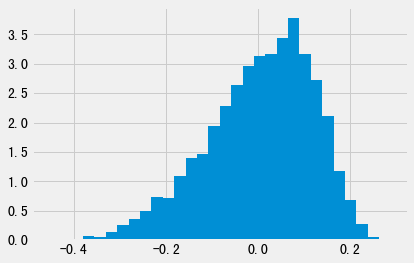

------LSTM-----12------2020-04-30-----
start date: 2014-05-30 . end date : 2020-01-23. the number of data: 132306
start date: 2020-02-28 . end date : 2020-03-31. the number of data: 6581
start date: 2020-04-30 . end date : 2020-04-30. the number of data: 3271
---LSTMModel init----
Epoch: 0
train loss 0.944388, train score -0.944388, valid loss 0.942949, valid score -0.942949
Epoch: 1
train loss 0.941621, train score -0.941621, valid loss 0.933992, valid score -0.933992
Epoch: 2
train loss 0.938145, train score -0.938145, valid loss 0.930417, valid score -0.930417
Epoch: 3
train loss 0.936270, train score -0.936270, valid loss 0.932193, valid score -0.932193
Epoch: 4
train loss 0.935857, train score -0.935857, valid loss 0.931310, valid score -0.931310
Epoch: 5
train loss 0.933948, train score -0.933948, valid loss 0.933776, valid score -0.933776
Epoch: 6
train loss 0.934437, train score -0.934437, valid loss 0.934487, valid score -0.934487
Epoch: 7
train loss 0.932051, train score -0.9

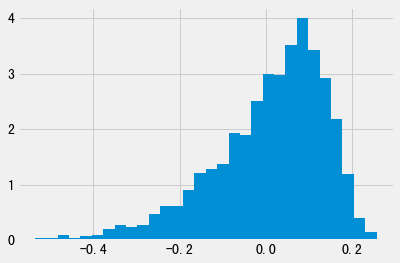

------LSTM-----12------2020-05-29-----
start date: 2014-06-30 . end date : 2020-02-28. the number of data: 133951
start date: 2020-03-31 . end date : 2020-04-30. the number of data: 6567
start date: 2020-05-29 . end date : 2020-05-29. the number of data: 3271
---LSTMModel init----
Epoch: 0
train loss 0.944020, train score -0.944020, valid loss 0.975508, valid score -0.975508
Epoch: 1
train loss 0.940926, train score -0.940926, valid loss 0.974232, valid score -0.974232
Epoch: 2
train loss 0.938624, train score -0.938624, valid loss 0.978685, valid score -0.978685
Epoch: 3
train loss 0.937179, train score -0.937179, valid loss 0.978107, valid score -0.978107
Epoch: 4
train loss 0.935607, train score -0.935607, valid loss 0.979494, valid score -0.979494
Epoch: 5
train loss 0.934312, train score -0.934312, valid loss 0.981840, valid score -0.981840
Epoch: 6
train loss 0.932885, train score -0.932885, valid loss 0.985127, valid score -0.985127
Epoch: 7
train loss 0.931020, train score -0.9

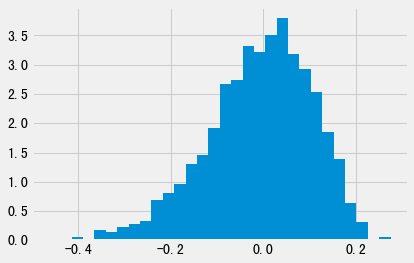

------LSTM-----12------2020-06-30-----
start date: 2014-07-31 . end date : 2020-03-31. the number of data: 135635
start date: 2020-04-30 . end date : 2020-05-29. the number of data: 6542
start date: 2020-06-30 . end date : 2020-06-30. the number of data: 3267
---LSTMModel init----
Epoch: 0
train loss 0.947252, train score -0.947252, valid loss 0.984611, valid score -0.984611
Epoch: 1
train loss 0.944797, train score -0.944797, valid loss 0.985854, valid score -0.985854
Epoch: 2
train loss 0.941138, train score -0.941138, valid loss 0.987252, valid score -0.987252
Epoch: 3
train loss 0.937463, train score -0.937463, valid loss 0.987216, valid score -0.987216
Epoch: 4
train loss 0.935495, train score -0.935495, valid loss 0.988244, valid score -0.988244
Epoch: 5
train loss 0.938284, train score -0.938284, valid loss 0.992729, valid score -0.992729
Epoch: 6
train loss 0.934763, train score -0.934763, valid loss 0.989951, valid score -0.989951
Epoch: 7
train loss 0.933055, train score -0.9

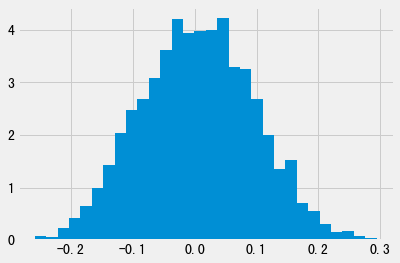

------LSTM-----12------2020-07-31-----
start date: 2014-08-29 . end date : 2020-04-30. the number of data: 137328
start date: 2020-05-29 . end date : 2020-06-30. the number of data: 6538
start date: 2020-07-31 . end date : 2020-07-31. the number of data: 3277
---LSTMModel init----
Epoch: 0
train loss 0.945501, train score -0.945501, valid loss 0.975601, valid score -0.975601
Epoch: 1
train loss 0.942352, train score -0.942352, valid loss 0.974044, valid score -0.974044
Epoch: 2
train loss 0.941114, train score -0.941114, valid loss 0.972858, valid score -0.972858
Epoch: 3
train loss 0.938643, train score -0.938643, valid loss 0.975126, valid score -0.975126
Epoch: 4
train loss 0.936971, train score -0.936971, valid loss 0.973879, valid score -0.973879
Epoch: 5
train loss 0.936051, train score -0.936051, valid loss 0.975264, valid score -0.975264
Epoch: 6
train loss 0.935126, train score -0.935126, valid loss 0.974901, valid score -0.974901
Epoch: 7
train loss 0.933151, train score -0.9

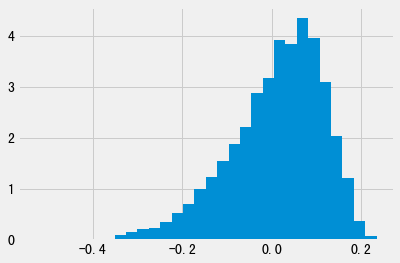

CPU times: user 4h 5min 2s, sys: 5min 49s, total: 4h 10min 52s
Wall time: 1h 14min 50s


In [11]:
%%time
## train programme. results are stored in pred_df. score is in res_df.
model_df = pd.DataFrame()
for step_len in steps:
    df_tmp = pd.DataFrame()
    i = 0
    res_df = pd.DataFrame(columns=['best_score'])
    for idx, date in enumerate(monthend_ls):
        if date < test_date:
#         if date < '2017-02-01':
            continue
        print(f"------{model_name}-----{step_len}------{date}-----")

        train_ds = dataset(df, monthend_ls[step_len+i], monthend_ls[idx-3], step_len)
        valid_ds = dataset(df, monthend_ls[idx-2], monthend_ls[idx-1], step_len)
        test_ds = dataset(df, monthend_ls[idx], monthend_ls[idx], step_len)
        i+=1

        lstm = LSTM(feature_cnt = len(f_cols), optimizer=optimizer)
        result = lstm.fit(train_ds, valid_ds)
        score_df.loc[date, (model_name+str(step_len), 'mse')] = result['best_score']
#         res_df.loc[date] = result['best_score']

        pred = lstm.predict(test_ds)
#         print(pred)
        pred.columns = [(model_name+str(step_len))]
        df_tmp = pd.concat([df_tmp, pred])
        
    if(model_df.empty):
        model_df = df_tmp
    else:
        model_df = pd.merge(model_df, df_tmp, left_index=True, right_index=True, how='outer')
    

In [12]:
score_df.mean(axis=0)

LSTM3   mse   -0.975042
LSTM6   mse   -0.961690
LSTM12  mse   -0.938136
dtype: float64

In [13]:
# pred_df = pred_df.drop(columns='LSTM_reg_wts')
model_df.to_csv(data_dir+'LSTM_reg.csv', encoding='gbk')
model_df.head()

LSTM3     LSTM6    LSTM12
date       code                                
2017-01-26 000001  0.041065  0.114621  0.186761
           000002 -0.114530 -0.161194       NaN
           000004 -0.091206       NaN       NaN
           000005  0.133698  0.107969  0.216313
           000006  0.061516  0.092189  0.167270

## weighting

In [14]:
## get weighted data by wts_grouper
num_per_group = [20, 30,50]   ## 每组选取几只股票
wts_grouper = {
#               'industry_of_300': ['date','industry_code'],
              'Neu': ['date'],
              }  ## 分组标准，按300中的industry分，还是不分类
choose_list = [] ## choose list to be backtested
choose_range = 300 ## stock pool in CSI300

In [15]:
model_df = pd.read_csv(data_dir+'LSTM_reg.csv', encoding='gbk', dtype={'code': str})
df = pd.read_csv(data_dir+'df.csv', encoding='gbk', index_col=0, dtype={'code': str})
df = df[['date', 'code', 'index_code','rtn']]
weight_df = pd.merge(model_df, df, 
                     left_on=['date', 'code'], right_on=['date', 'code'], how='left')
weight_df = weight_df.assign(Neu=1)
weight_df = weight_df[weight_df['index_code'] == choose_range]
weight_df.head()

,date,code,LSTM3,LSTM6,LSTM12,index_code,rtn,Neu
0,2017-01-26,000001,0.041065,0.114621,0.186761,300.0,0.016077,1
1,2017-01-26,000002,-0.114530,-0.161194,NaN,300.0,-0.007253,1
5,2017-01-26,000008,0.129476,0.130933,0.154139,300.0,0.005741,1
6,2017-01-26,000009,-0.227476,-0.202640,-0.080097,300.0,0.026288,1
18,2017-01-26,000027,-0.047524,-0.007817,0.071847,300.0,0.008584,1


In [16]:
for model in model_period:
    for wts_cat in wts_grouper:
        for num in num_per_group:
            name = model + '_' + wts_cat[-3:]+'_'+str(num)+ '_wts'
            choose_list.append(name)

            tmp = weight_df.assign(name=0).rename(columns={'name': name}).sort_values(
                by=model, ascending=False).groupby(wts_grouper[wts_cat]).head(num)
            tmp[name] = tmp[wts_cat] / num 
            weight_df =pd.merge(weight_df, tmp[['date', 'code', name]],
                                left_on = ['date', 'code'], right_on=['date', 'code'], how='left')
            weight_df[name] = weight_df.groupby('date')[name].apply(lambda x: x/ x.sum())
        
weight_df.to_csv(data_dir+'weight_lstm.csv', encoding='gbk')
print(choose_list)
weight_df.head()

['LSTM3_Neu_20_wts', 'LSTM3_Neu_30_wts', 'LSTM3_Neu_50_wts', 'LSTM6_Neu_20_wts', 'LSTM6_Neu_30_wts', 'LSTM6_Neu_50_wts', 'LSTM12_Neu_20_wts', 'LSTM12_Neu_30_wts', 'LSTM12_Neu_50_wts']


,date,code,LSTM3,LSTM6,LSTM12,index_code,rtn,Neu,LSTM3_Neu_20_wts,LSTM3_Neu_30_wts,LSTM3_Neu_50_wts,LSTM6_Neu_20_wts,LSTM6_Neu_30_wts,LSTM6_Neu_50_wts,LSTM12_Neu_20_wts,LSTM12_Neu_30_wts,LSTM12_Neu_50_wts
0,2017-01-26,000001,0.041065,0.114621,0.186761,300.0,0.016077,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02
1,2017-01-26,000002,-0.114530,-0.161194,NaN,300.0,-0.007253,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2017-01-26,000008,0.129476,0.130933,0.154139,300.0,0.005741,1,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN
3,2017-01-26,000009,-0.227476,-0.202640,-0.080097,300.0,0.026288,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2017-01-26,000027,-0.047524,-0.007817,0.071847,300.0,0.008584,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
# weight_df[weight_df['LSTM12_Neu_25_wts'].notnull()].groupby('date').sum()

## backtesting

In [18]:
import qlib
from qlib.config import REG_CN
from qlib.contrib.evaluate import backtest
from qlib.workflow import R
from qlib.workflow.record_temp import *
from qlib.utils import *
from qlib.data import D
from qlib.contrib.report import analysis_model, analysis_position
from qlib.contrib.strategy import TopkDropoutStrategy
from qlib.tests.data import GetData
sys.path.append('/root/workspace/QUANTAXIS/src')
from strategy import WeightStrategy
print(qlib.__version__)

0.7.0


In [19]:
provider_uri = "/root/workspace/.qlib/qlib_data/cn_data" 
market = "All"
benchmark = "SH000300"
recorder_name = datetime.datetime.now().strftime('%Y%m%d%H%M')##每次运行必须更改，否则覆盖
# score_col = 'xgboost6_Neu_wts'
# model_col = 'xgboost6'

if not exists_qlib_data(provider_uri):
    print(f"Qlib data is not found in {provider_uri}")
#     GetData().qlib_data(target_dir=provider_uri, region=REG_CN)

qlib.init(provider_uri=provider_uri, region=REG_CN, logging_level=logging.ERROR)

[28875:MainThread](2021-07-30 12:47:47,283) INFO - qlib.Initialization - [config.py:287] - default_conf: client.
[28875:MainThread](2021-07-30 12:47:47,285) WARNING - qlib.Initialization - [config.py:302] - redis connection failed(host=127.0.0.1 port=6379), cache will not be used!
QUANTAXIS>> redis connection failed(host=127.0.0.1 port=6379), cache will not be used!
[28875:MainThread](2021-07-30 12:47:47,289) INFO - qlib.Initialization - [__init__.py:54] - qlib successfully initialized based on client settings.
[28875:MainThread](2021-07-30 12:47:47,290) INFO - qlib.Initialization - [__init__.py:55] - data_path=/root/workspace/.qlib/qlib_data/cn_data


In [20]:
## backtest config
BACKTEST_CONFIG = {
    "verbose": False,
    "limit_threshold": 0.095,
    "account": 100000000,
    "benchmark": benchmark,
    "deal_price": "close",
    "open_cost": 0.0005,
    "close_cost": 0.0015,
    "min_cost": 5,
}

In [21]:
def parse_qlib_df(df: pd.DataFrame, weight_col: str):
    ## 处理为符合qlib backtest要求的dataframe
    tmp = df[['date', 'code', weight_col, 'rtn']]
    tmp.columns = ['datetime', 'instrument', 'weight', 'rtn']
# weight_df['score'] = weight_df['score'] /100

    tmp['instrument'] = tmp['instrument'].apply(lambda x: 'SH'+x if x.startswith('6') else 'SZ'+x)
    tmp['datetime'] = tmp['datetime'].apply(pd.to_datetime)
    tmp = tmp[~tmp['weight'].isna()].set_index(['datetime', 'instrument']).sort_values(by=['datetime', 'weight'], ascending=[True, False])
    tmp = tmp[tmp.index.get_level_values(0) <= D.calendar()[-1]]
    return tmp

In [22]:
### 读取股票权重文件weight_df
df = pd.read_csv(data_dir+'weight_lstm.csv', index_col=0, dtype={'code':str}, encoding='gbk')
wts_cols = [col for col in df.columns.tolist() if col.endswith('_wts')]
df = df[['date', 'code', 'rtn'] + wts_cols]
# df = df.iloc[:, 0:5]
res_df = pd.DataFrame()
report_dict = {}
positions_dict = {}
df.head()

,date,code,rtn,LSTM3_Neu_20_wts,LSTM3_Neu_30_wts,LSTM3_Neu_50_wts,LSTM6_Neu_20_wts,LSTM6_Neu_30_wts,LSTM6_Neu_50_wts,LSTM12_Neu_20_wts,LSTM12_Neu_30_wts,LSTM12_Neu_50_wts
0,2017-01-26,000001,0.016077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02
1,2017-01-26,000002,-0.007253,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2017-01-26,000008,0.005741,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN
3,2017-01-26,000009,0.026288,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2017-01-26,000027,0.008584,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
for wts_col in wts_cols:
    wts_df = parse_qlib_df(df, wts_col)
    wts_name = wts_col.replace('_wts', '')
    print(f'---------------------backtesting {wts_name}---------------------')
    
    strategy = WeightStrategy()
    report_normal, positions_normal = backtest(wts_df['weight'], strategy=strategy, **BACKTEST_CONFIG)

    report_dict[wts_name] = report_normal
    positions_dict[wts_name] = positions_normal
    res = risk_analysis(report_normal["return"] - report_normal["bench"] - report_normal["cost"]).T
    res.index = [wts_name]
    res_df = pd.concat([res_df, res], axis=0)


[28875:MainThread](2021-07-30 12:47:48,249) INFO - qlib.backtest caller - [__init__.py:148] - Create new exchange


---------------------backtesting LSTM3_Neu_20---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 12:48:20,471) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 12:48:20,715) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 12:48:20,719) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 12:48:20,722) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 12:48:20,725) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

---------------------backtesting LSTM3_Neu_30---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 12:50:12,541) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 12:50:12,794) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 12:50:12,798) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 12:50:12,801) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 12:50:12,806) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

---------------------backtesting LSTM3_Neu_50---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 12:52:39,158) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 12:52:39,415) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 12:52:39,419) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 12:52:39,424) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 12:52:39,428) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

---------------------backtesting LSTM6_Neu_20---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 12:56:15,823) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 12:56:16,080) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 12:56:16,084) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 12:56:16,087) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 12:56:16,090) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

---------------------backtesting LSTM6_Neu_30---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 12:58:09,113) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 12:58:09,370) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 12:58:09,374) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 12:58:09,378) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 12:58:09,381) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

---------------------backtesting LSTM6_Neu_50---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 13:00:35,454) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 13:00:35,718) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 13:00:35,723) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 13:00:35,728) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 13:00:35,733) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

---------------------backtesting LSTM12_Neu_20---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 13:04:13,126) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 13:04:13,382) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 13:04:13,386) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 13:04:13,390) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 13:04:13,393) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

---------------------backtesting LSTM12_Neu_30---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 13:06:05,955) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 13:06:06,216) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 13:06:06,221) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 13:06:06,224) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 13:06:06,228) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

---------------------backtesting LSTM12_Neu_50---------------------


/opt/conda/lib/python3.8/site-packages/qlib/contrib/backtest/exchange.py:152: FutureWarning:

Boolean inputs to the `inclusive` argument are deprecated infavour of `both` or `neither`.

[28875:MainThread](2021-07-30 13:08:32,665) INFO - qlib.backtest caller - [__init__.py:202] - Create new executor 
[28875:MainThread](2021-07-30 13:08:32,929) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-06]
QUANTAXIS>> No score found on predict date[2017-02-06]
[28875:MainThread](2021-07-30 13:08:32,934) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-07]
QUANTAXIS>> No score found on predict date[2017-02-07]
[28875:MainThread](2021-07-30 13:08:32,939) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-08]
QUANTAXIS>> No score found on predict date[2017-02-08]
[28875:MainThread](2021-07-30 13:08:32,943) WARNING - qlib.backtest - [backtest.py:89] - No score found on predict date[2017-02-09]
QUANTA

In [24]:
print(res_df)
best_model = res_df['information_ratio'].idxmax()
report_normal, positions_normal = report_dict[best_model], positions_dict[best_model]

                   mean       std  annualized_return  information_ratio  max_drawdown
LSTM3_Neu_20   0.000099  0.005823           0.024963           0.270043     -0.206491
LSTM3_Neu_30   0.000069  0.005169           0.017360           0.211543     -0.168585
LSTM3_Neu_50   0.000079  0.004680           0.019807           0.266598     -0.135669
LSTM6_Neu_20   0.000113  0.006093           0.028464           0.294254     -0.203137
LSTM6_Neu_30  -0.000022  0.005404          -0.005609          -0.065379     -0.217805
LSTM6_Neu_50  -0.000048  0.004701          -0.012214          -0.163657     -0.208647
LSTM12_Neu_20 -0.000011  0.005434          -0.002796          -0.032414     -0.240824
LSTM12_Neu_30  0.000025  0.005129           0.006231           0.076538     -0.210550
LSTM12_Neu_50 -0.000055  0.004531          -0.013945          -0.193865     -0.170429


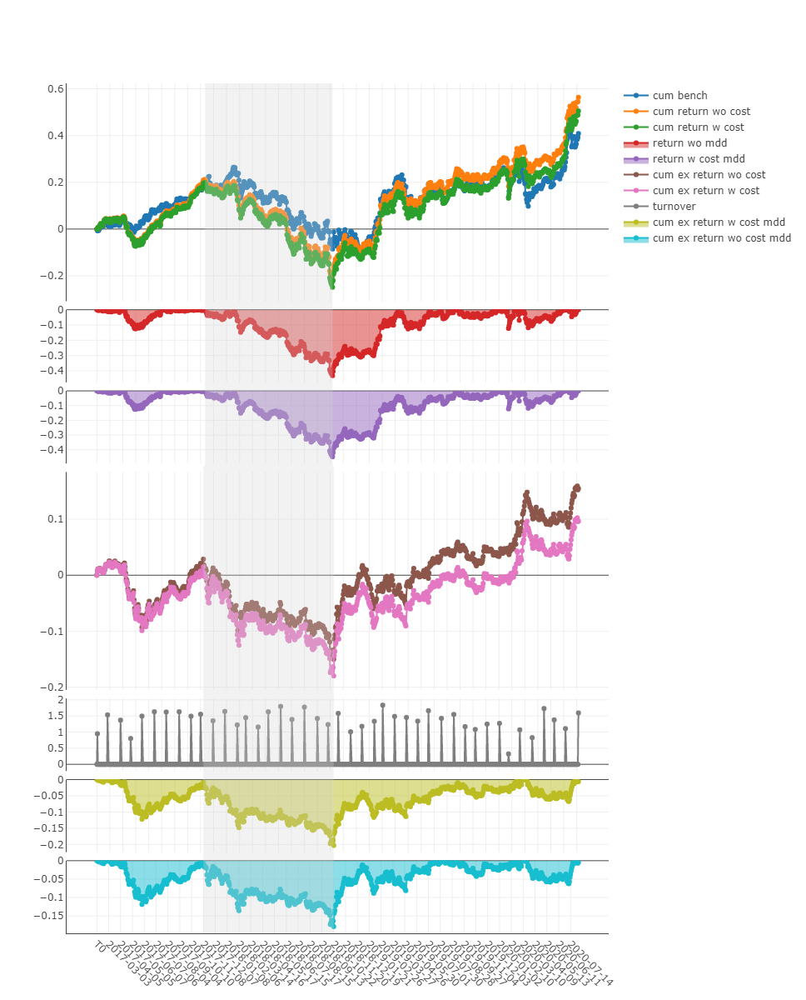

In [25]:
### return graph
analysis_position.report_graph(report_normal)

In [26]:
# ### 读取股票权重文件
# df = pd.read_csv(data_dir+'weight_lstm.csv', index_col=0, dtype={'code':str}, encoding='gbk')
# df = df[['date', 'code', 'score', 'rtn']]
# df.columns = ['datetime', 'instrument', 'score', 'rtn']
# # weight_df['score'] = weight_df['score'] /100

# df['instrument'] = df['instrument'].apply(lambda x: 'SH'+x if x.startswith('6') else 'SZ'+x)
# df['datetime'] = df['datetime'].apply(pd.to_datetime)
# df = df[~df['score'].isna()].set_index(['datetime', 'instrument']).sort_values(by=['datetime', 'score'], ascending=[True, False])
# df = df[df.index.get_level_values(0) <= D.calendar()[-1]]

# df.head(5)

In [27]:
# ## backtesting & result
# STRATEGY_CONFIG = {
#     "topk": num_per_group,
#     "n_drop": num_per_group,
# }
# BACKTEST_CONFIG = {
#     "verbose": True,
#     "limit_threshold": 0.095,
#     "account": 100000000,
#     "benchmark": benchmark,
#     "deal_price": "close",
#     "open_cost": 0.0005,
#     "close_cost": 0.0015,
#     "min_cost": 5,
# }

# # strategy = TopkDropoutStrategy(**STRATEGY_CONFIG)
# # report_normal, positions_normal = backtest(df['score'], strategy=strategy, **BACKTEST_CONFIG)
# strategy = WeightStrategy()
# report_normal, positions_normal = backtest(df['score'], strategy=strategy, **BACKTEST_CONFIG)

In [28]:
# ### return graph
# analysis_position.report_graph(report_normal)

                                                  risk
excess_return_without_cost mean               0.000181
                           std                0.006089
                           annualized_return  0.045677
                           information_ratio  0.472575
                           max_drawdown      -0.178750
excess_return_with_cost    mean               0.000113
                           std                0.006093
                           annualized_return  0.028464
                           information_ratio  0.294254
                           max_drawdown      -0.203137


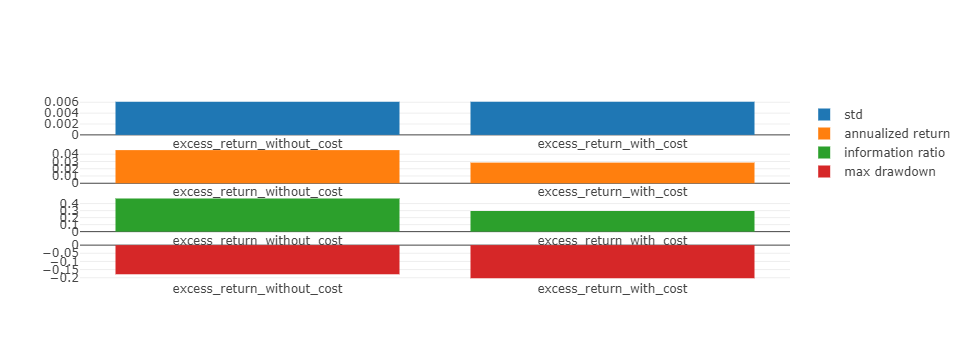

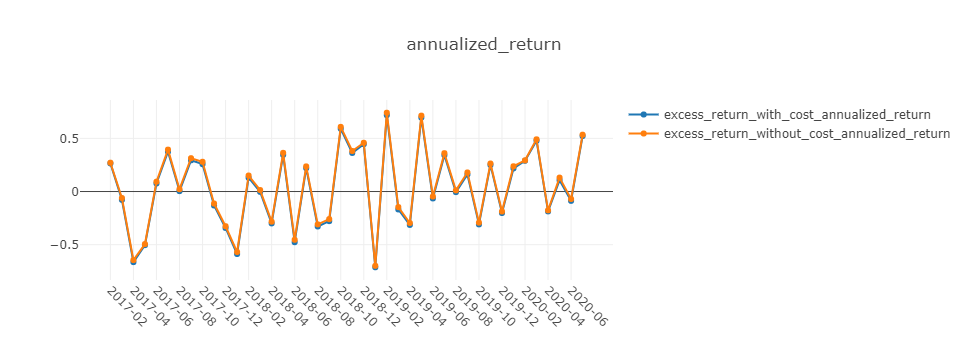

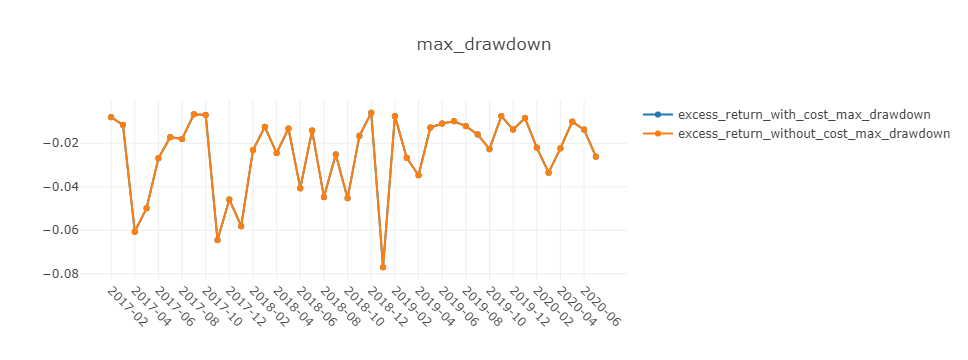

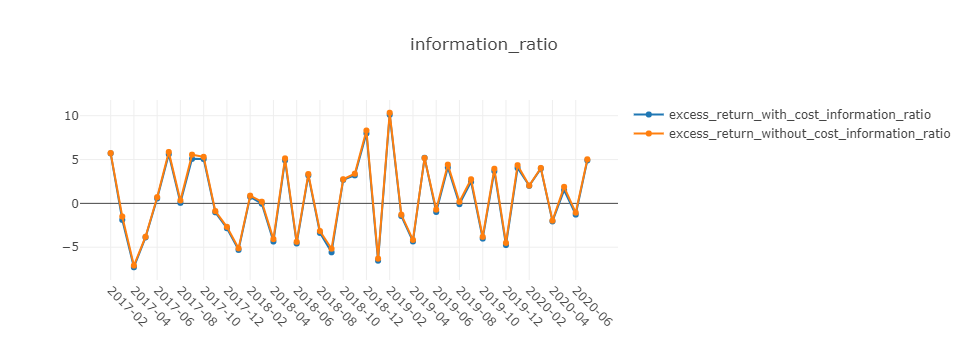

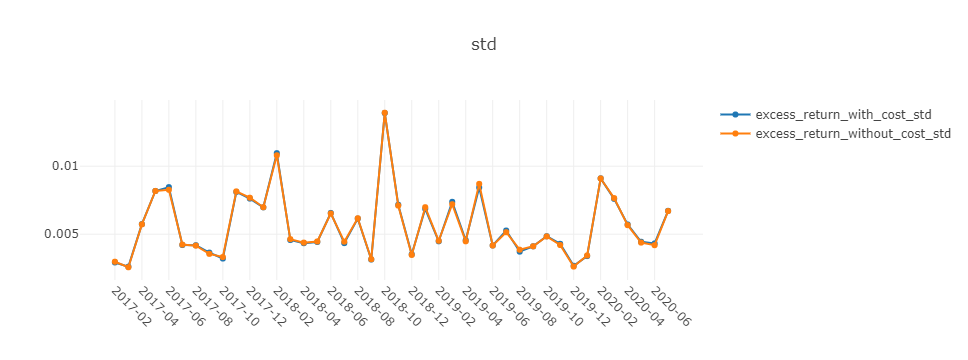

In [29]:
# analysis
analysis = dict()
analysis["excess_return_without_cost"] = risk_analysis(report_normal["return"] - report_normal["bench"])
analysis["excess_return_with_cost"] = risk_analysis(report_normal["return"] - report_normal["bench"] - report_normal["cost"])
analysis_df = pd.concat(analysis)  # type: pd.DataFrame
print(analysis_df)

analysis_position.risk_analysis_graph(analysis_df, report_normal)

In [30]:
# weight_df = pd.read_csv(data_dir +'weight_df.csv', encoding='gbk', index_col=0, dtype={'code': str})
# weight_df = weight_df.drop(columns=['LSTM_reg_wts','LSTM_reg_wts_x', 'LSTM_reg_wts_y'])
# weight_df.head()